# Statistics for Michel electron candidate

### Created by Shu, 202508---

<br />
<br />
<br />
<br />
<br />
<br />

## WVF Coincidence Explore:

In [92]:
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

import os



# ------------------------------------------------------------
# 1️⃣ Define data groups
# ------------------------------------------------------------
data_groups = [
    {
        "data_dir": "../MC_new202510/statResult_pds",
        "dates": [
            "20251010", "20251011", "20251012", "20251013", "20251014", "20251015",
            "20251016", "20251017", "20251018", "20251019", "20251020", "20251021",
            "20251022", "20251023", "20251024", "20251025", "20251026", "20251027",
            "20251028", "20251029", "20251030", "20251031", "20251032",
            "20251042", "20251043", "20251044", "20251045"
        ]
    },
    {
        "data_dir": "./statResult_pds",
        "dates": ["20251070", "20251071", "20251072", "20251073", "20251074", "20251075", "20251076",
                  "20251077", "20251078", "20251079", "20251080"
                  ]
    }
]

coinNum = []
coinTrueE = []
coinPDG = []


# ------------------------------------------------------------
# 2️⃣ Read all groups — waveform coincidence counts
# ------------------------------------------------------------
print("\n=== Reading waveform coincidence counts ===")

for group in data_groups:
    data_dir = group["data_dir"]

    print(f"\n[GROUP] {data_dir}")

    for d in group["dates"]:
        fname = f"{data_dir}/print_wvfCoin_count{d}.txt"
        if not os.path.exists(fname):
            print(f"[WARN] Missing {fname}")
            continue

        count = 0
        with open(fname, "r") as file:
            for line in file:
                line = line.strip()
                if not line:
                    continue

                parts = line.split(":")
                if len(parts) >= 2:
                    try:
                        coinNum.append(int(parts[1].strip()))
                        count += 1
                    except ValueError:
                        print(f"[WARN] Could not parse '{parts[1].strip()}' in {fname}")

        print(f"  - Loaded {count:5d} entries from {d} → {os.path.basename(fname)}")


# ------------------------------------------------------------
# 3️⃣ Read all groups — candidate energies
# ------------------------------------------------------------
print("\n=== Reading candidate energies ===")

for group in data_groups:
    data_dir = group["data_dir"]

    print(f"\n[GROUP] {data_dir}")

    for d in group["dates"]:
        fname = f"{data_dir}/print_trueE{d}.txt"
        if not os.path.exists(fname):
            print(f"[WARN] Missing {fname}")
            continue

        count = 0
        with open(fname, "r") as file:
            for line in file:
                value = line.strip()
                if value:
                    try:
                        coinTrueE.append(float(value))
                        count += 1
                    except ValueError:
                        print(f"[WARN] Could not convert '{value}' in {fname} to float.")

        print(f"  - Loaded {count:5d} entries from {d} → {os.path.basename(fname)}")


# ------------------------------------------------------------
# 4️⃣ Read all groups — PDG codes
# ------------------------------------------------------------
print("\n=== Reading PDG codes ===")

for group in data_groups:
    data_dir = group["data_dir"]

    print(f"\n[GROUP] {data_dir}")

    for d in group["dates"]:
        fname = f"{data_dir}/print_truePDG{d}.txt"
        if not os.path.exists(fname):
            print(f"[WARN] Missing {fname}")
            continue

        count = 0
        with open(fname, "r") as file:
            for line in file:
                value = line.strip()
                if value:
                    try:
                        coinPDG.append(int(value))
                        count += 1
                    except ValueError:
                        print(f"[WARN] Could not convert '{value}' in {fname} to int.")

        print(f"  - Loaded {count:5d} entries from {d} → {os.path.basename(fname)}")





# ------------------------------------------------------------
# ✅ Summary
# ------------------------------------------------------------


print("Event candidates (TPC cut)  : 251,310")
print("Track candidates with NO wvf: ~44,777")
print("Number of track candidates  :", len(coinNum))

#coinNum.extend([0] * 44777)



print("\nLength of track coinTrueE: ", len(coinTrueE))
print("Length of track coinPDG  : ", len(coinPDG))





=== Reading waveform coincidence counts ===

[GROUP] ../MC_new202510/statResult_pds
  - Loaded  3644 entries from 20251010 → print_wvfCoin_count20251010.txt
  - Loaded  3621 entries from 20251011 → print_wvfCoin_count20251011.txt
  - Loaded  3360 entries from 20251012 → print_wvfCoin_count20251012.txt
  - Loaded  3540 entries from 20251013 → print_wvfCoin_count20251013.txt
  - Loaded  3523 entries from 20251014 → print_wvfCoin_count20251014.txt
  - Loaded  3348 entries from 20251015 → print_wvfCoin_count20251015.txt
  - Loaded  3357 entries from 20251016 → print_wvfCoin_count20251016.txt
  - Loaded  3503 entries from 20251017 → print_wvfCoin_count20251017.txt
  - Loaded  3703 entries from 20251018 → print_wvfCoin_count20251018.txt
  - Loaded  3581 entries from 20251019 → print_wvfCoin_count20251019.txt
  - Loaded  3628 entries from 20251020 → print_wvfCoin_count20251020.txt
  - Loaded  3571 entries from 20251021 → print_wvfCoin_count20251021.txt
  - Loaded  3693 entries from 20251022 

Purity of coinNum:  153682 / 204829 (75.03%)
Michel e:  27546 / 153682 (17.92%)
Michel p:  126136 / 153682 (82.08%)

Candidates with #opWvf>=4:  175788 / 204829 (85.82%)
Purity:  131057 / 175788 (74.55%)

Values here are based on MS>0.2 & MH>2...


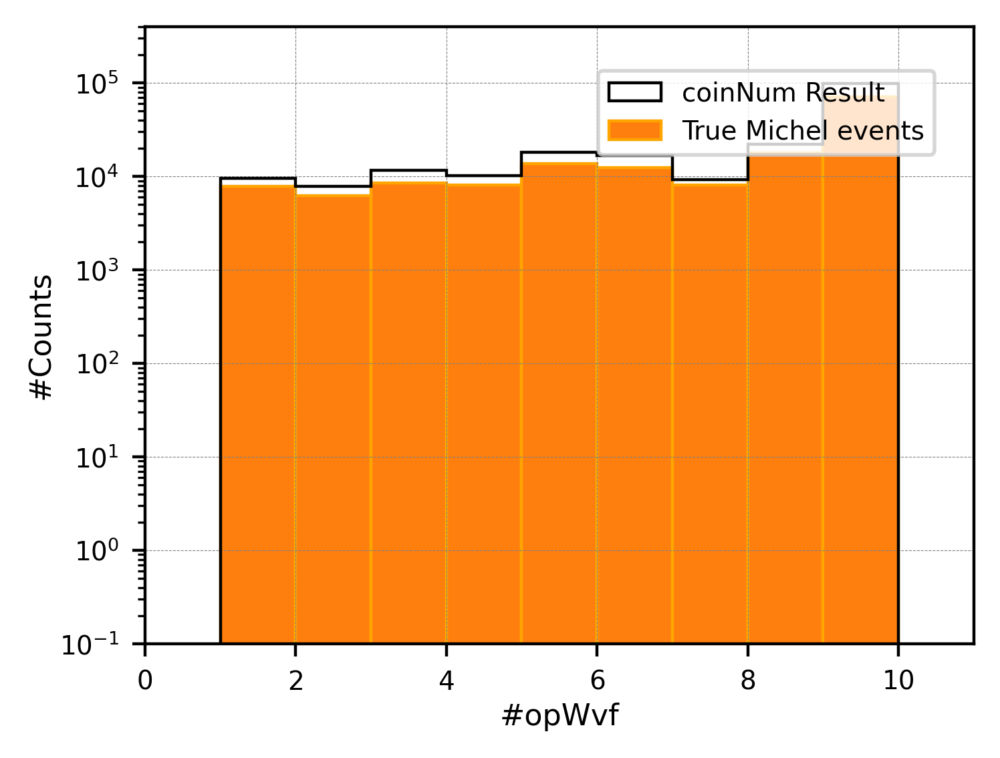

<Figure size 1600x1200 with 0 Axes>

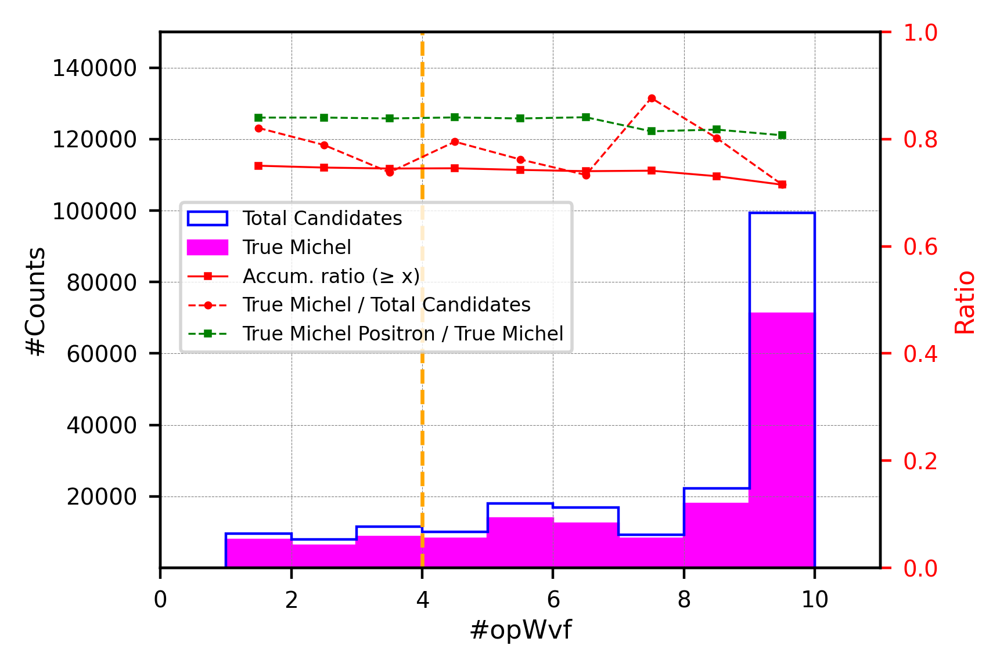

In [93]:

#Extract coinNum with trueE:===========================
coinNum_trueE = []
coinNum_trueE_e = [] #Michel electron
coinNum_trueE_p = [] #Michel positron
for i in range(0, len(coinTrueE)):
    count = coinNum[i]
    e = coinTrueE[i]
    pdg = coinPDG[i]

    if e > 0:
        coinNum_trueE.append(count)
        if pdg == 11:
            coinNum_trueE_e.append(count)
        if pdg == -11:
            coinNum_trueE_p.append(count)

print("Purity of coinNum: ", len(coinNum_trueE), "/", len(coinNum), "({:.2f}%)".format(len(coinNum_trueE)/len(coinNum)*100))
print("Michel e: ", len(coinNum_trueE_e), "/", len(coinNum_trueE), "({:.2f}%)".format(len(coinNum_trueE_e)/len(coinNum_trueE)*100))
print("Michel p: ", len(coinNum_trueE_p), "/", len(coinNum_trueE), "({:.2f}%)".format(len(coinNum_trueE_p)/len(coinNum_trueE)*100))





#Apply preliminary cut #opWvf >=4:=====================
coinNum_cut5 = []
coinNum_trueE_cut5 = []
for i in range(0, len(coinNum)):
    coin = coinNum[i]
    trueE = coinTrueE[i]

    if coin >=4:
        coinNum_cut5.append(coin)
    
        if trueE > 0:
            coinNum_trueE_cut5.append(trueE)

print("\nCandidates with #opWvf>=4: ", len(coinNum_cut5), "/", len(coinNum), "({:.2f}%)".format(len(coinNum_cut5)/len(coinNum)*100))
print("Purity: ", len(coinNum_trueE_cut5), "/", len(coinNum_cut5), "({:.2f}%)".format(len(coinNum_trueE_cut5)/len(coinNum_cut5)*100))

print("\nValues here are based on MS>0.2 & MH>2...")



# Plotting the histogram (X distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#Define the range and bin width
bin_width = 1
range_min = 0
range_max = 11
bins = np.arange(range_min, range_max + bin_width, bin_width)

#plt.plot([5, 5], [0, 1200], color="black", linewidth=1.5, linestyle='--')

plt.hist(coinNum, bins=bins, range=(range_min, range_max), edgecolor='black', 
         histtype='step', linewidth=0.8, label='coinNum Result')
plt.hist(coinNum_trueE, bins=bins, range=(range_min, range_max), edgecolor='orange', 
         histtype='bar', linewidth=0.8, label="True Michel events")



plt.legend(loc='upper center', bbox_to_anchor=(0.75, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.xlim(0, 11)
#plt.ylim(0, 50)
plt.xlabel('#opWvf', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.ylim(0.1, 400000)
plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)

plt.show() 








#Michel score distribution (Original)----------------------------------------
plt.figure(figsize=(4,3),dpi=400)

# Define the range and bin width
bin_width = 1
range_min = 1
range_max = 10
bins = np.arange(range_min, range_max + bin_width, bin_width)

# Compute histograms
hist_total, _ = np.histogram(coinNum, bins=bins, range=(range_min, range_max))
hist_true, _ = np.histogram(coinNum_trueE, bins=bins, range=(range_min, range_max))
hist_trueP, _ = np.histogram(coinNum_trueE_p, bins=bins, range=(range_min, range_max))#True positron

# Compute bin centers (midpoints of bins)
bin_centers = bins[:-1] + bin_width / 2

fig, ax1 = plt.subplots(figsize=(4,3), dpi=400)

# Primary y-axis (Counts)
ax1.hist(bin_centers, bins=bins, weights=hist_total, edgecolor='blue', histtype='step', linewidth=0.8, label="Total Candidates")
ax1.hist(bin_centers, bins=bins, weights=hist_true, edgecolor='magenta', color='magenta', histtype='bar', 
         linewidth=0.8, label="True Michel")
#ax1.hist(bin_centers, bins=bins, weights=hist_trueP, edgecolor='green', color='green', histtype='bar', 
#         linewidth=0.8, label="True Michel Positron")


ax1.plot([4, 4], [0, 10000000], color="orange", linewidth=1.2, linestyle='--')


ax1.set_xlim(0, 11)
ax1.set_xlabel('#opWvf', labelpad=2, fontsize=8)
ax1.set_ylabel('#Counts', labelpad=1, fontsize=8)
ax1.set_ylim(0.1, 150000)
#ax1.set_yscale('log')
ax1.tick_params(labelsize=7)
ax1.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
#plt.legend(loc='upper center', bbox_to_anchor=(0.3, 0.99), fontsize=9, markerscale=5, ncol=1, prop={'size': 6})

# Secondary y-axis (Ratio)
ax2 = ax1.twinx()
ratio = np.divide(hist_true, hist_total, out=np.zeros_like(hist_true, dtype=float), where=hist_total!=0)  # Avoid division by zero

ratio2 = np.divide(hist_trueP, hist_true, out=np.zeros_like(hist_trueP, dtype=float), where=hist_total!=0)  # Avoid division by zero

# --- Accumulated (>= x) ratio ---
# Cumulative sums from the right (>= x)
cum_total = np.cumsum(hist_total[::-1])[::-1]
cum_true  = np.cumsum(hist_true[::-1])[::-1]
acc_ratio = np.divide(cum_true, cum_total,
                      out=np.zeros_like(cum_true, dtype=float),
                      where=cum_total != 0)

# Add the accumulated ratio curve on the secondary y-axis
ax2.plot(bin_centers, acc_ratio, color='red', marker='s', markersize=1.5,
         linestyle='-', linewidth=0.6, label='Accum. ratio (≥ x)')


ax2.plot(bin_centers, ratio, color='red', marker='o', markersize=1.5, linestyle='--', 
         linewidth=0.6, label="True Michel / Total Candidates")

ax2.plot(bin_centers, ratio2, color='green', marker='s', markersize=1.5, linestyle='--', 
         linewidth=0.6, label="True Michel Positron / True Michel")



ax2.set_ylabel('Ratio', fontsize=8, color='red')
ax2.set_ylim(0.0, 1.0)

ax2.tick_params(axis='y', labelsize=7, colors='red')



# Combine legends from both axes
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2,
           loc='upper center', bbox_to_anchor=(0.3, 0.7),
           fontsize=9, ncol=1, prop={'size': 6})



plt.show()



<br />
<br />
<br />
<br />
<br />
<br />

## Process WVF:
### After TPC cuts & (#opWvf >= 4) (This can be taken as "PDS Cut 1")

In [94]:
from dataclasses import dataclass
from typing import Optional
import matplotlib.pyplot as plt
import numpy as np
import re
from mpl_toolkits.mplot3d import Axes3D



# ------------------- Dataclass -------------------
@dataclass
class PdsEvent:
    muon_time: Optional[int] = None
    michel_time: Optional[int] = None
    third_time: Optional[int] = None             # NEW
    muon_intensity: Optional[float] = None
    michel_intensity: Optional[float] = None
    third_intensity: Optional[float] = None      # NEW
    posX: Optional[float] = None
    posY: Optional[float] = None
    posZ: Optional[float] = None
    energy: Optional[float] = None
    lifetime: Optional[float] = None
    pdg: Optional[int] = None
    eventID: Optional[int] = None
    trackID: Optional[int] = None
    date: Optional[int] = None
    # muon
    mu_leftTurn: Optional[int] = None
    mu_rightTurn: Optional[int] = None
    mu_leftHeight: Optional[float] = None
    mu_rightHeight: Optional[float] = None
    # michel
    mi_leftTurn: Optional[int] = None
    mi_rightTurn: Optional[int] = None
    mi_leftHeight: Optional[float] = None
    mi_rightHeight: Optional[float] = None
    # third peak
    th_leftTurn: Optional[int] = None            # NEW
    th_rightTurn: Optional[int] = None           # NEW
    th_leftHeight: Optional[float] = None        # NEW
    th_rightHeight: Optional[float] = None       # NEW
    # Michel-level attributes
    michel_score: Optional[float] = None         # ✅ NEW
    michel_hits: Optional[int] = None            # ✅ NEW



# ------------------- Helpers -------------------
def parse_event_track(path_str: str):
    """Extract eventID and trackID from a file path string."""
    m = re.search(r"event(\d+)_trackID(\d+)", path_str)
    if m:
        return int(m.group(1)), int(m.group(2))
    return None, None



def read_total_files(files, dates, kind="muon"):
    """
    Read *_total_xxx.txt files.
    Each line: path: t, I, leftTurn, leftHeight, rightTurn, rightHeight
    """
    records = []
    for fname, date in zip(files, dates):
        try:
            with open(fname, "r") as f:
                for line in f:
                    line = line.strip()
                    if not line:
                        continue
                    parts = line.split(":")
                    if len(parts) < 2:
                        continue

                    path_part = parts[0].strip()
                    values = [v.strip() for v in parts[1].split(",")]
                    if len(values) < 6:
                        print(f"[WARN] Malformed line in {fname}: {line}")
                        continue

                    try:
                        time_val = int(values[0])
                        inten_val = float(values[1])
                        left_turn = int(values[2])
                        left_h = float(values[3])
                        right_turn = int(values[4])
                        right_h = float(values[5])
                    except ValueError:
                        print(f"[WARN] Could not parse numbers in {line}")
                        continue

                    evID, trID = parse_event_track(path_part)
                    rec = {"eventID": evID, "trackID": trID, "date": int(date)}

                    if kind == "muon":
                        rec.update({
                            "muon_time": time_val,
                            "muon_intensity": inten_val,
                            "mu_leftTurn": left_turn,
                            "mu_leftHeight": left_h,
                            "mu_rightTurn": right_turn,
                            "mu_rightHeight": right_h
                        })
                    elif kind == "michel":
                        rec.update({
                            "michel_time": time_val,
                            "michel_intensity": inten_val,
                            "mi_leftTurn": left_turn,
                            "mi_leftHeight": left_h,
                            "mi_rightTurn": right_turn,
                            "mi_rightHeight": right_h
                        })
                    elif kind == "third":
                        rec.update({
                            "third_time": time_val,
                            "third_intensity": inten_val,
                            "th_leftTurn": left_turn,
                            "th_leftHeight": left_h,
                            "th_rightTurn": right_turn,
                            "th_rightHeight": right_h
                        })

                    records.append(rec)
        except FileNotFoundError:
            print(f"File not found: {fname}")
    return records




def read_plain_files(files, cast_type=float):
    """Read one or more plain text files with one number per line and return concatenated values."""
    values = []
    for fname in files:
        try:
            with open(fname, "r") as file:
                for line in file:
                    value = line.strip()
                    if value:
                        try:
                            values.append(cast_type(value))
                        except ValueError:
                            print(f"Could not convert {value} in {fname}")
        except FileNotFoundError:
            print(f"File not found: {fname}")
    return values



# ------------------- Load data -------------------
# ------------------- Load data (TWO GROUPS) -------------------

data_groups = [
    {
        "data_dir": "../MC_new202510/statResult_pds",
        "dates": [
            "20251010","20251011","20251012","20251013","20251014","20251015","20251016",
            "20251017","20251018","20251019","20251020","20251021","20251022","20251023",
            "20251024","20251025","20251026","20251027","20251028","20251029","20251030",
            "20251031","20251032","20251042","20251043","20251044","20251045"
        ]
    },
    {
        "data_dir": "./statResult_pds",
        "dates": ["20251070","20251071","20251072","20251073", "20251074","20251075","20251076",
                  "20251077","20251078","20251079", "20251080" 
                  ]
    }
]

muon_records   = []
michel_records = []
third_records  = []

posX, posY, posZ = [], [], []
energy, lifetime = [], []
pdg = []
miScore, miHits = [], []

print("\n================= Reading multi-group files =================\n")

for group in data_groups:
    dir0  = group["data_dir"]
    dates = group["dates"]

    print(f"\n[GROUP] Reading from: {dir0}\n")

    # ------------------- A. TOTAL FILES -------------------
    muon_files   = [f"{dir0}/muon_total_{d}.txt"   for d in dates]
    michel_files = [f"{dir0}/michel_total_{d}.txt" for d in dates]
    third_files  = [f"{dir0}/third_total_{d}.txt"  for d in dates]

    print("→ Reading MUON TOTAL files...")
    recs = read_total_files(muon_files, dates, kind="muon")
    print(f"  Loaded {len(recs)} muon records\n")
    muon_records.extend(recs)

    print("→ Reading MICHEL TOTAL files...")
    recs = read_total_files(michel_files, dates, kind="michel")
    print(f"  Loaded {len(recs)} michel records\n")
    michel_records.extend(recs)

    print("→ Reading THIRD TOTAL files...")
    recs = read_total_files(third_files, dates, kind="third")
    print(f"  Loaded {len(recs)} third records\n")
    third_records.extend(recs)


    # ------------------- B. PLAIN FILES -------------------
    print("→ Reading plain-text extracted files...\n")

    posX.extend(     read_plain_files([f"{dir0}/posX_extract_{d}.txt" for d in dates]) )
    posY.extend(     read_plain_files([f"{dir0}/posY_extract_{d}.txt" for d in dates]) )
    posZ.extend(     read_plain_files([f"{dir0}/posZ_extract_{d}.txt" for d in dates]) )
    energy.extend(   read_plain_files([f"{dir0}/energy_extract_{d}.txt" for d in dates]) )
    lifetime.extend( read_plain_files([f"{dir0}/lifetime_extract_{d}.txt" for d in dates]) )
    pdg.extend(      read_plain_files([f"{dir0}/pdg_extract_{d}.txt" for d in dates], cast_type=int) )
    miScore.extend(  read_plain_files([f"{dir0}/michelScore_extract_{d}.txt" for d in dates]) )
    miHits.extend(   read_plain_files([f"{dir0}/michelHits_extract_{d}.txt"  for d in dates], cast_type=int) )


print("\n================= SUMMARY OF COUNTS =================")
print("Muon total records   :", len(muon_records))
print("Michel total records :", len(michel_records))
print("Third total records  :", len(third_records))
print("posX length          :", len(posX))
print("posY length          :", len(posY))
print("posZ length          :", len(posZ))
print("energy length        :", len(energy))
print("lifetime length      :", len(lifetime))
print("pdg length           :", len(pdg))
print("michelScore length   :", len(miScore))
print("michelHits length    :", len(miHits))
print("=====================================================\n")



# ------------------- Build dataset -------------------
events_veryInitial = []
n_events = min(
    len(muon_records), len(michel_records), len(third_records),
    len(posX), len(posY), len(posZ),
    len(energy), len(lifetime), len(pdg),
    len(miScore), len(miHits)
)

for i in range(n_events):
    rec_mu = muon_records[i]
    rec_mi = michel_records[i]
    rec_th = third_records[i]

    ev = PdsEvent(
        eventID=rec_mu.get("eventID", rec_mi.get("eventID", rec_th.get("eventID"))),
        trackID=rec_mu.get("trackID", rec_mi.get("trackID", rec_th.get("trackID"))),
        date=rec_mu.get("date", rec_mi.get("date", rec_th.get("date"))),

        # muon
        muon_time=rec_mu.get("muon_time"),
        muon_intensity=rec_mu.get("muon_intensity"),
        mu_leftTurn=rec_mu.get("mu_leftTurn"),
        mu_leftHeight=rec_mu.get("mu_leftHeight"),
        mu_rightTurn=rec_mu.get("mu_rightTurn"),
        mu_rightHeight=rec_mu.get("mu_rightHeight"),

        # michel
        michel_time=rec_mi.get("michel_time"),
        michel_intensity=rec_mi.get("michel_intensity"),
        mi_leftTurn=rec_mi.get("mi_leftTurn"),
        mi_leftHeight=rec_mi.get("mi_leftHeight"),
        mi_rightTurn=rec_mi.get("mi_rightTurn"),
        mi_rightHeight=rec_mi.get("mi_rightHeight"),
        michel_score=miScore[i],
        michel_hits=miHits[i],

        # third
        third_time=rec_th.get("third_time"),
        third_intensity=rec_th.get("third_intensity"),
        th_leftTurn=rec_th.get("th_leftTurn"),
        th_leftHeight=rec_th.get("th_leftHeight"),
        th_rightTurn=rec_th.get("th_rightTurn"),
        th_rightHeight=rec_th.get("th_rightHeight"),

        # physical properties
        posX=posX[i], posY=posY[i], posZ=posZ[i],
        energy=energy[i], lifetime=lifetime[i], pdg=pdg[i]
    )
    events_veryInitial.append(ev)

print("Very initial dataset:", len(events_veryInitial))

example = events_veryInitial[0]
print("\nExample Event (index 0):")
for field, value in vars(example).items():
    print(f"  {field:20s}: {value}")









#Apply cuts on peak intensities-----------------------------
events_reco_initial = []
events_true_initial = []

for ev in events_veryInitial:
    muIntensity = ev.muon_intensity
    miIntensity = ev.michel_intensity
    e = ev.energy

    ms = ev.michel_score
    mh = ev.michel_hits

    #mu & mi are cuts in following block already!
    if muIntensity > -0.1  and miIntensity > -0.1 and ms > 0.2 and mh > 2:
        events_reco_initial.append(ev)

        if e > 0:
            events_true_initial.append(ev)

print("\nDataset after initial intensity-cut----------------------")
print("Michel initial dataset   : ", len(events_reco_initial))
print("Michel purity (true/reco): ", len(events_true_initial), "/ ", len(events_reco_initial), 
      "({:.2f}%)".format(len(events_true_initial)/len(events_reco_initial)*100)) 








================= Reading multi-group files =================


[GROUP] Reading from: ../MC_new202510/statResult_pds

→ Reading MUON TOTAL files...
  Loaded 107984 muon records

→ Reading MICHEL TOTAL files...
  Loaded 107984 michel records

→ Reading THIRD TOTAL files...
  Loaded 107984 third records

→ Reading plain-text extracted files...


[GROUP] Reading from: ./statResult_pds

→ Reading MUON TOTAL files...
  Loaded 67804 muon records

→ Reading MICHEL TOTAL files...
  Loaded 67804 michel records

→ Reading THIRD TOTAL files...
  Loaded 67804 third records

→ Reading plain-text extracted files...


================= SUMMARY OF COUNTS =================
Muon total records   : 175788
Michel total records : 175788
Third total records  : 175788
posX length          : 175788
posY length          : 175788
posZ length          : 175788
energy length        : 175788
lifetime length      : 175788
pdg length           : 175788
michelScore length   : 175788
michelHits length    : 175788

Ver

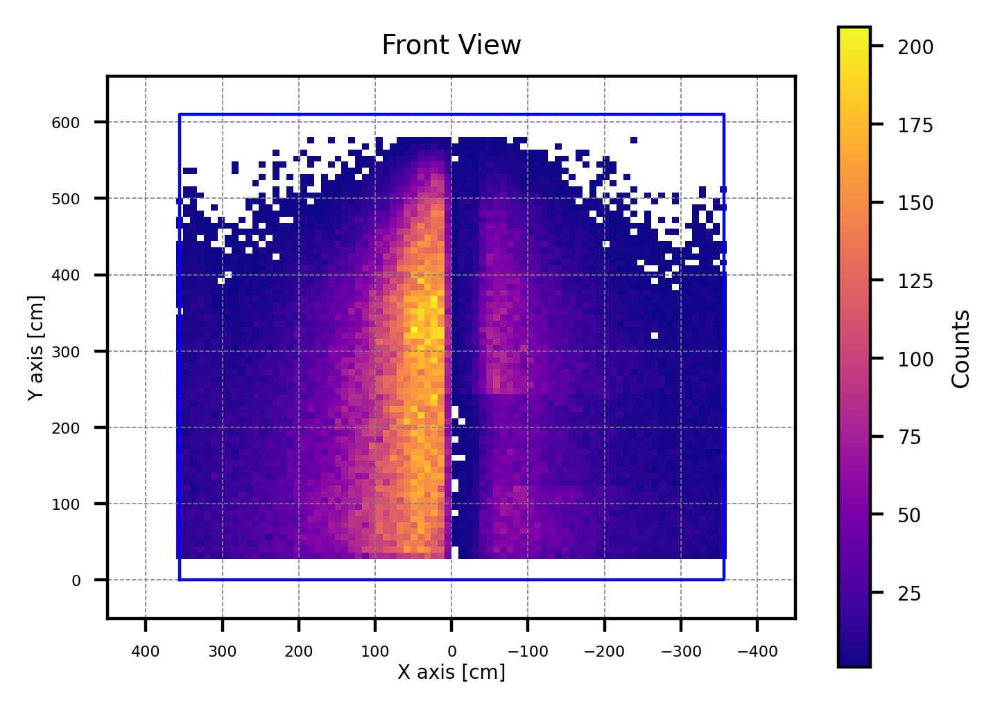

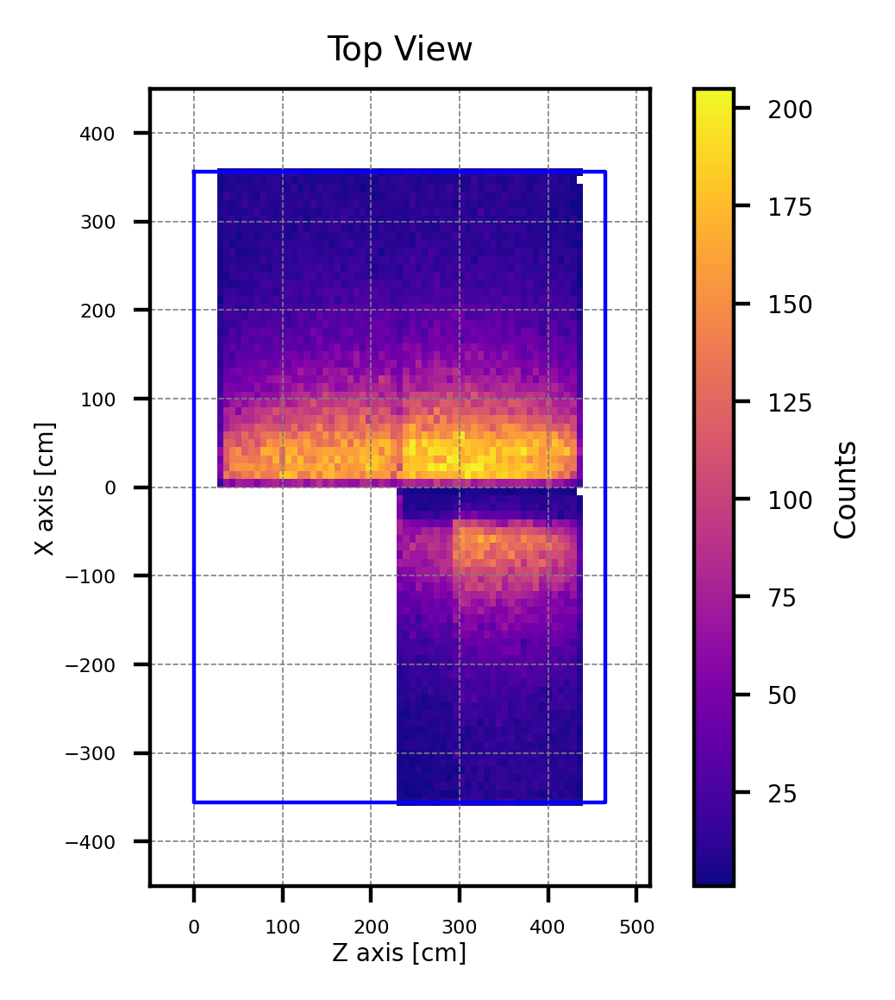


Decay points distribution (TPC & #opWvf cuts): 
# of X < 0 :  45288 (25.76%)
# of X >= 0:  130499 (74.24%)

Michel purity:  131057 /  175787 (74.55%)

Bin Center | Final / Initial Ratio
-------------------------------
   -355.0 | 0.042
   -345.0 | 0.537
   -335.0 | 0.604
   -325.0 | 0.663
   -315.0 | 0.617
   -305.0 | 0.615
   -295.0 | 0.593
   -285.0 | 0.644
   -275.0 | 0.670
   -265.0 | 0.623
   -255.0 | 0.673
   -245.0 | 0.701
   -235.0 | 0.686
   -225.0 | 0.675
   -215.0 | 0.694
   -205.0 | 0.706
   -195.0 | 0.713
   -185.0 | 0.706
   -175.0 | 0.710
   -165.0 | 0.717
   -155.0 | 0.728
   -145.0 | 0.740
   -135.0 | 0.734
   -125.0 | 0.727
   -115.0 | 0.738
   -105.0 | 0.730
    -95.0 | 0.737
    -85.0 | 0.748
    -75.0 | 0.730
    -65.0 | 0.724
    -55.0 | 0.704
    -45.0 | 0.626
    -35.0 | 0.702
    -25.0 | 0.738
    -15.0 | 0.620
     -5.0 | 0.601
      5.0 | 0.832
     15.0 | 0.866
     25.0 | 0.879
     35.0 | 0.855
     45.0 | 0.755
     55.0 | 0.749
     65.0 | 0.742
     75

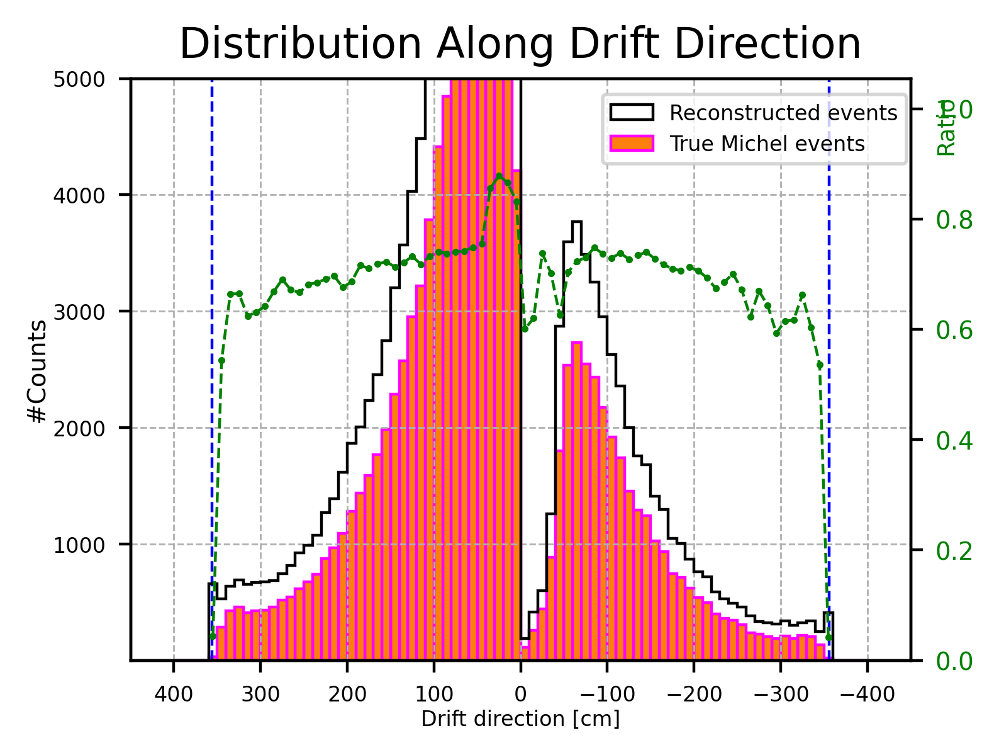

In [95]:
posX = [ev.posX for ev in events_reco_initial]
posY = [ev.posY for ev in events_reco_initial]
posZ = [ev.posZ for ev in events_reco_initial]

posX_true = [ev.posX for ev in events_true_initial]




#Y-X plane ploting (Front View)----------------------------------------
plt.figure(figsize=(4,3),dpi=400)

#Set the limts of x, y and z when drawing---
xmin = -450
xmax = 450
ymin = -100
ymax = 700
zmin = -100
zmax = 600

#Field cage range---
cageMinX = -356
cageMaxX = 356
cageMinY = 0
cageMaxY = 610
cageMinZ = 0
cageMaxZ = 465


#auxiliary line, along y(geo) and x axis---
aux2 = [0, 610, 610, 0, 0] #y shoud be y---
aux1 = [356, 356, -356, -356, 356]
plt.plot(aux1, aux2, color="blue", linewidth=0.8, linestyle='-')


# Create a custom colormap where zero-frequency regions are white
plasma = plt.cm.plasma.copy()
plasma.set_under('white')  # Sets zero values to white

# Create a 2D histogram
hist, xedges, yedges, img = plt.hist2d(posX, posY, bins=(100, 100), range=[[xmin, xmax], [ymin, ymax]],
                                       cmap=plasma, cmin=1)  # cmin=1 ensures zero bins remain white

# Add color bar
cbar = plt.colorbar()
cbar.set_label('Counts', fontsize=6)
cbar.ax.tick_params(labelsize=5)


plt.axis('scaled')
plt.xlim(-450, 450)#z---
plt.ylim(-50, 660)
plt.gca().invert_xaxis()  # Flip x-axis
plt.xlabel('X axis [cm]', labelpad=1, fontsize=5)
plt.ylabel('Y axis [cm]', labelpad=1, fontsize=5)
plt.title('Front View', fontsize=7)
plt.tick_params(labelsize=4)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
plt.show() 




#Z-X plane ploting (Top View)----------------------------------------
plt.figure(figsize=(4,3),dpi=400)

#auxiliary line, along y(geo) and x axis---
aux1 = [0, 465, 465, 0, 0] #y shoud be y---
aux2 = [356, 356, -356, -356, 356]
plt.plot(aux1, aux2, color="blue", linewidth=0.8, linestyle='-')

# Create a custom colormap where zero-frequency regions are white
plasma = plt.cm.plasma.copy()
plasma.set_under('white')  # Sets zero values to white

# Create a 2D histogram
hist, xedges, yedges, img = plt.hist2d(posZ, posX, bins=(100, 100), range=[[zmin, zmax], [xmin, xmax]],
                                       cmap=plasma, cmin=1)  # cmin=1 ensures zero bins remain white

# Add color bar
cbar = plt.colorbar(pad=-0.3)
cbar.set_label('Counts', fontsize=6)
cbar.ax.tick_params(labelsize=5)

plt.axis('scaled')
plt.ylim(-450, 450)#z---
plt.xlim(-50, 515)
plt.ylabel('X axis [cm]', labelpad=1, fontsize=5)
plt.xlabel('Z axis [cm]', labelpad=1, fontsize=5)
plt.title('Top View', fontsize=7)
plt.tick_params(labelsize=4)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
plt.show()








#Decay points distribution:==================================================================
print("\nDecay points distribution (TPC & #opWvf cuts): ")

posX = np.array(posX)
neg_X = np.sum(posX < 0)
pos_X = np.sum(posX >= 0)
print("# of X < 0 : ", neg_X, "({:.2f}%)".format(neg_X/len(posX)*100))
print("# of X >= 0: ", pos_X, "({:.2f}%)".format(pos_X/len(posX)*100))

print("\nMichel purity: ", len(events_true_initial), "/ ", len(events_reco_initial), 
      "({:.2f}%)".format(len(events_true_initial)/len(events_reco_initial)*100))         



# Plotting the histogram (X distribution)---------------
fig, ax1 = plt.subplots(figsize=(4, 3), dpi=400)

#Define the range and bin width
bin_width = 10
range_min = -400
range_max = 400
bins = np.arange(range_min, range_max + bin_width, bin_width)
bin_centers = (bins[:-1] + bins[1:]) / 2

# --- Histogram counts ---
n_initial, _ = np.histogram(posX, bins=bins)
n_final, _ = np.histogram(posX_true, bins=bins)

# --- Ratio Calculation (only for [-360, 360]) ---
ratio = []
ratio_centers = []

print("\nBin Center | Final / Initial Ratio")
print("-------------------------------")
for center, ni, nf in zip(bin_centers, n_initial, n_final):
    if -360 <= center <= 360:
        r = nf / ni if ni > 0 else np.nan
        ratio.append(r)
        ratio_centers.append(center)
        if ni > 0:
            print(f"{center:9.1f} | {r:.3f}")
        else:
            print(f"{center:9.1f} |   NaN")


# Filter out NaN values for min/max calculation
valid_ratios = [r for r in ratio if not np.isnan(r)]

if valid_ratios:
    print("\nMaximum ratio: {:.3f}".format(np.max(valid_ratios)))
    print("Minimum ratio: {:.3f}".format(np.min(valid_ratios)))
else:
    print("\nNo valid ratios to compute min/max.")

#APA planes---
plt.plot([-356, -356], [0, 10000], color="blue", linewidth=0.8, linestyle='--')
plt.plot([356, 356], [0, 10000], color="blue", linewidth=0.8, linestyle='--')

# Plot histograms
ax1.hist(bins[:-1], bins=bins, weights=n_initial, edgecolor='black',
         histtype='step', linewidth=0.8, label='Reconstructed events')
ax1.hist(bins[:-1], bins=bins, weights=n_final, edgecolor='magenta',
         histtype='bar', linewidth=0.8, label='True Michel events')

ax1.set_ylabel('Counts')
ax1.grid(True, linestyle='--', linewidth=0.5)
ax1.legend(loc='upper center', bbox_to_anchor=(0.8, 0.99), fontsize=9, markerscale=5, ncol=1, prop={'size': 6})
ax1.set_xlim(-450, 450)
ax1.set_ylim(0.1, 5000)
ax1.set_xlabel('Drift direction [cm]', labelpad=1, fontsize=6)
ax1.set_ylabel('#Counts', labelpad=1, fontsize=7)
ax1.invert_xaxis()
#ax1.set_yscale('log')
ax1.tick_params(labelsize=6)

# Secondary y-axis for ratio
ax2 = ax1.twinx()

ax2.plot(ratio_centers, ratio, 'o--', color='green', markersize=1, linewidth=0.8, label='Final / Initial Ratio')

ax2.set_ylabel('Ratio', labelpad=1, fontsize=6.6, color='green', rotation=90)
ax2.yaxis.set_label_position("right")
ax2.yaxis.set_label_coords(1.03, 0.92)  # (x, y) in axis coordinates

ax2.tick_params(labelsize=7, axis='y', labelcolor='green')
ax2.set_ylim(0, np.nanmax(ratio) * 1.2)

# Final layout
#plt.tight_layout()

plt.title('Distribution Along Drift Direction', fontsize=12)

plt.show()



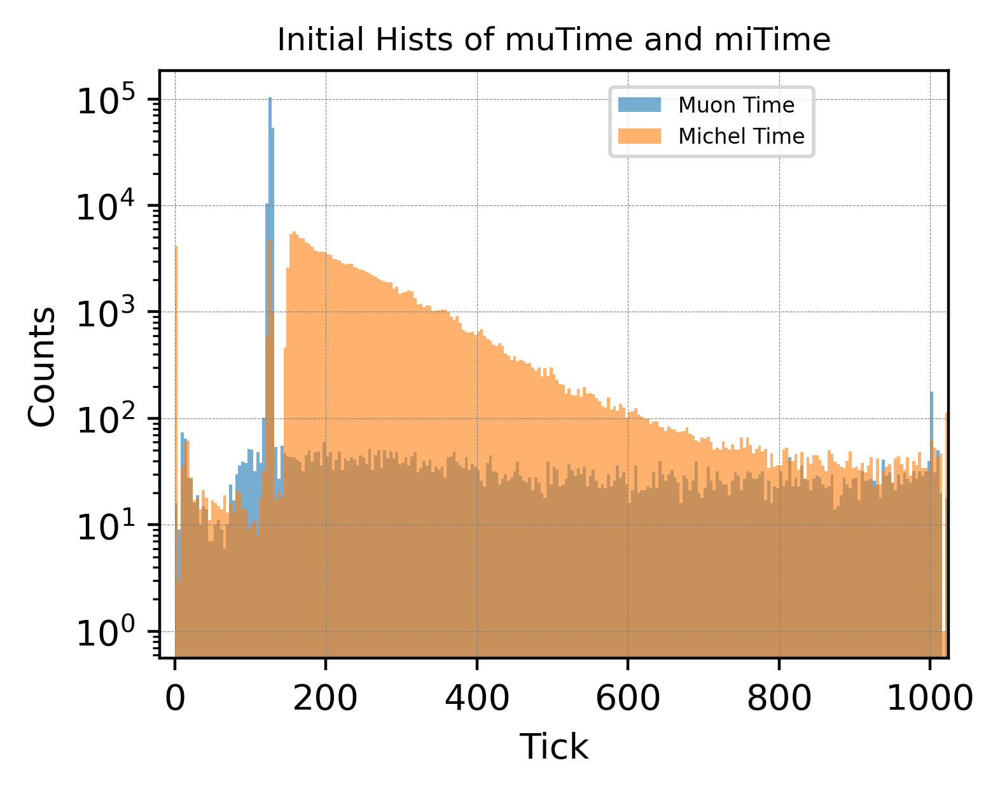

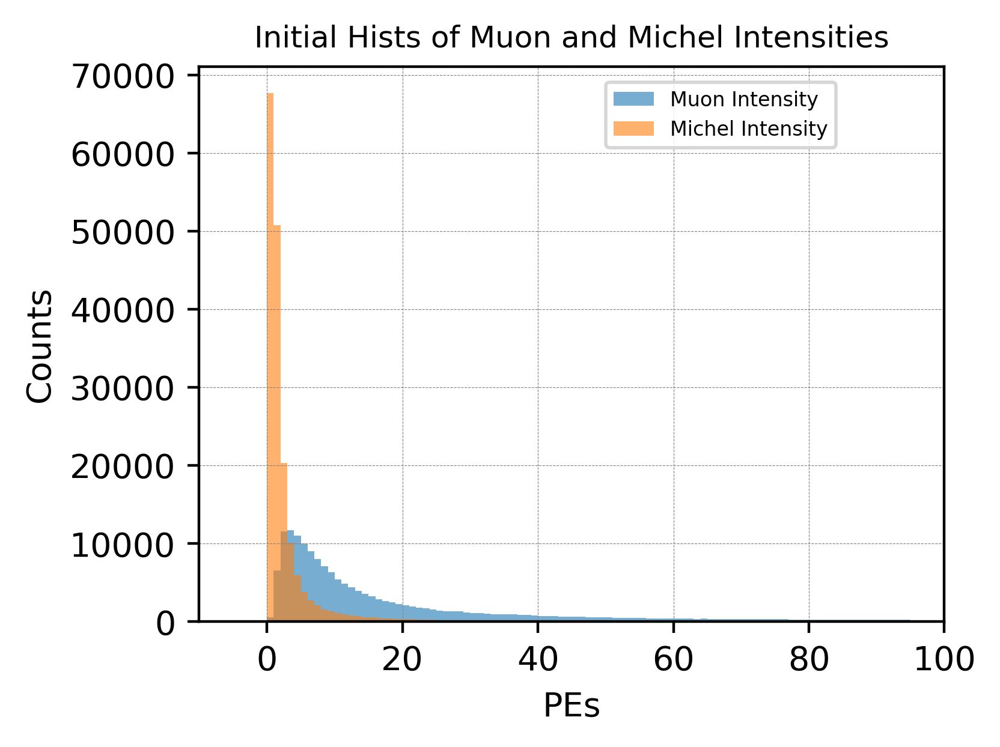

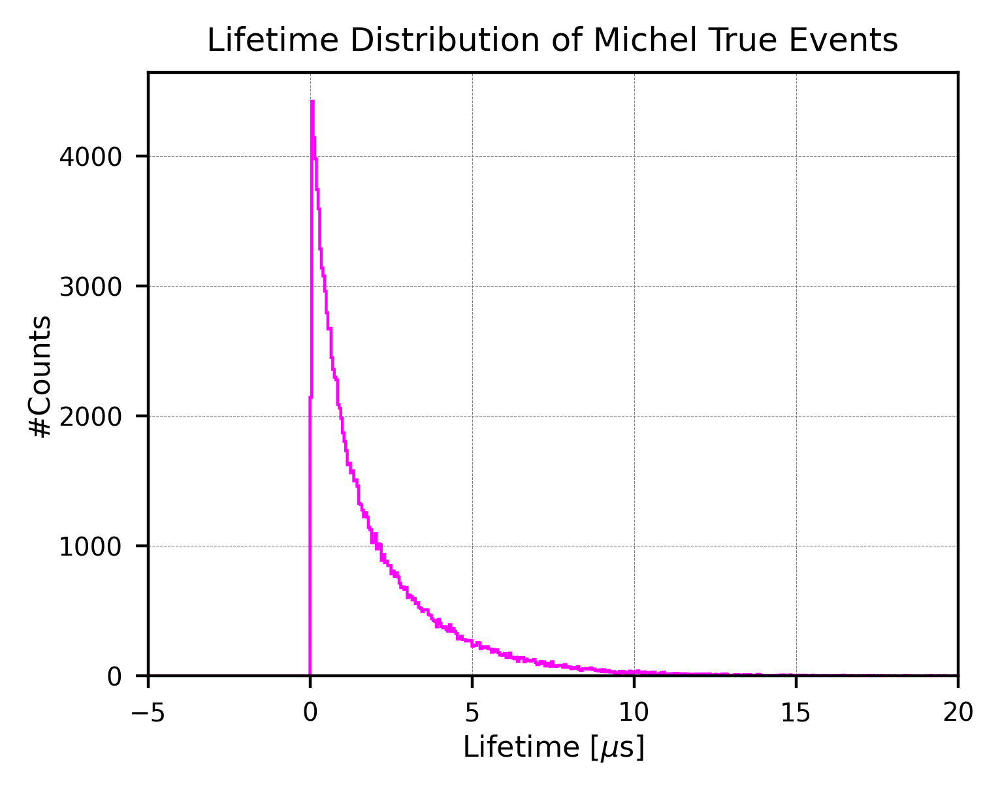

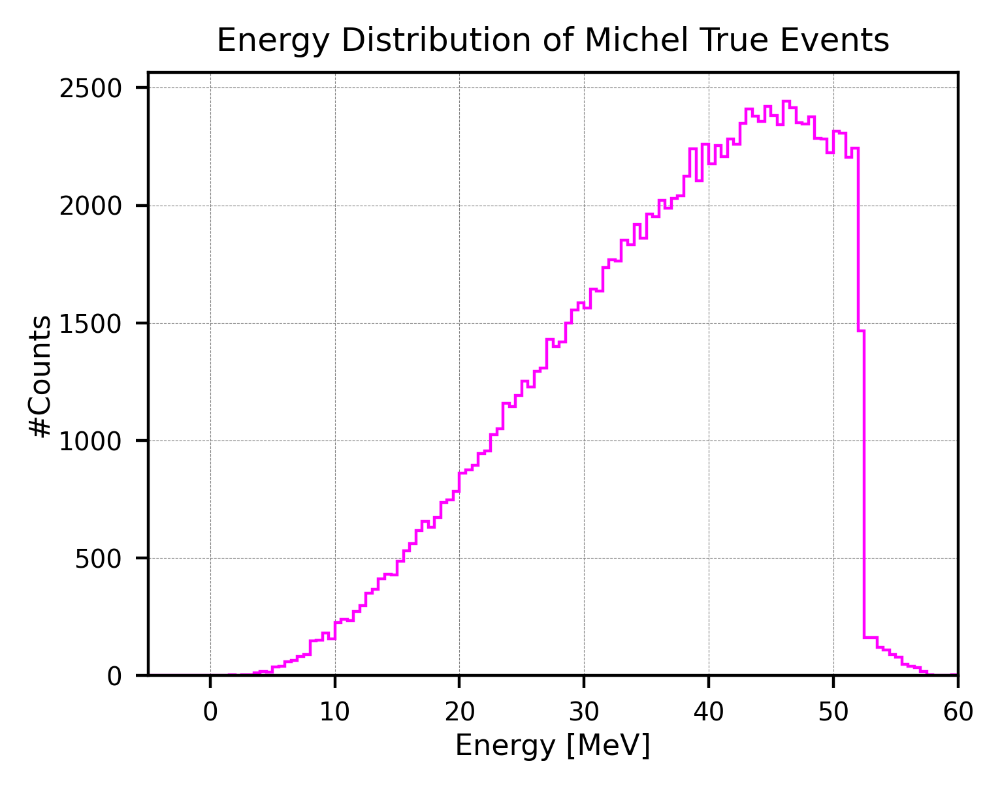

In [96]:
muon_time = [ev.muon_time for ev in events_reco_initial]
michel_time = [ev.michel_time for ev in events_reco_initial]

muon_intensity = [ev.muon_intensity for ev in events_reco_initial]
michel_intensity = [ev.michel_intensity for ev in events_reco_initial]

lifetime = [ev.lifetime for ev in events_true_initial] #true lifetime---
energy = [ev.energy for ev in events_true_initial] 


#Initial Mu and Michel time distributions=================================================
plt.figure(figsize=(4,3),dpi=400)

# Example: set your bin parameters
range_min_initial = 0
range_max_initial = 1024
bin_width_initial = 4  # You can change this value; default: 4
bins = np.arange(range_min_initial, range_max_initial + bin_width_initial, bin_width_initial)

# Plot histograms on the same canvas
plt.hist(muon_time, bins=bins, alpha=0.6, label='Muon Time')
plt.hist(michel_time, bins=bins, alpha=0.6, label='Michel Time')

plt.xlabel('Tick')
plt.ylabel('Counts')
plt.yscale('log')
plt.xlim(-20, 1024)
plt.title('Initial Hists of muTime and miTime', fontsize=9)

plt.legend(loc='upper center', bbox_to_anchor=(0.7, 0.99), fontsize=9, markerscale=4, ncol=1, prop={'size':6})
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)

plt.show()




#Initial Mu and Michel intensity distributions=================================================
plt.figure(figsize=(4,3),dpi=400)

# Example: set your bin parameters
range_min_initial = 0
range_max_initial = 100
bin_width_initial = 1  # You can change this value
bins = np.arange(range_min_initial, range_max_initial + bin_width_initial, bin_width_initial)

# Plot histograms on the same canvas
plt.hist(muon_intensity, bins=bins, alpha=0.6, label='Muon Intensity')
plt.hist(michel_intensity, bins=bins, alpha=0.6, label='Michel Intensity')

plt.xlabel('PEs')
plt.ylabel('Counts')
#plt.yscale('log')
plt.xlim(-10, 100)
plt.title('Initial Hists of Muon and Michel Intensities', fontsize=9)

plt.legend(loc='upper center', bbox_to_anchor=(0.7, 0.99), fontsize=9, markerscale=4, ncol=1, prop={'size':6})
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)

plt.show()







#True Lifetime distribution==================================================
plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.05
range_min = -20
range_max = 20
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(lifetime, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
         histtype='step', linewidth=0.8)

plt.xlim(-5, 20)
plt.xlabel('Lifetime [$\mu$s]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.ylim(0.1, 300)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Lifetime Distribution of Michel True Events', fontsize=9)
plt.show()  





#True Energy distribution==================================================
plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.5
range_min = -20
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(energy, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
         histtype='step', linewidth=0.8)

plt.xlim(-5, 60)
plt.xlabel('Energy [MeV]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.ylim(0.1, 500)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Energy Distribution of Michel True Events', fontsize=9)
plt.show()  





<br />
<br />
<br />
<br />


### Purification / cut 2: remove abnormal muon signals (constrain muTime to [120, 130])

Muon events selection (mu peak constrained to [120, 130]):
Updated Muon events:  167796 /  175787 (95.45%)
Length of time_difference (Updated):  167796

Michel purity:  125047 /  167796 (74.52%)


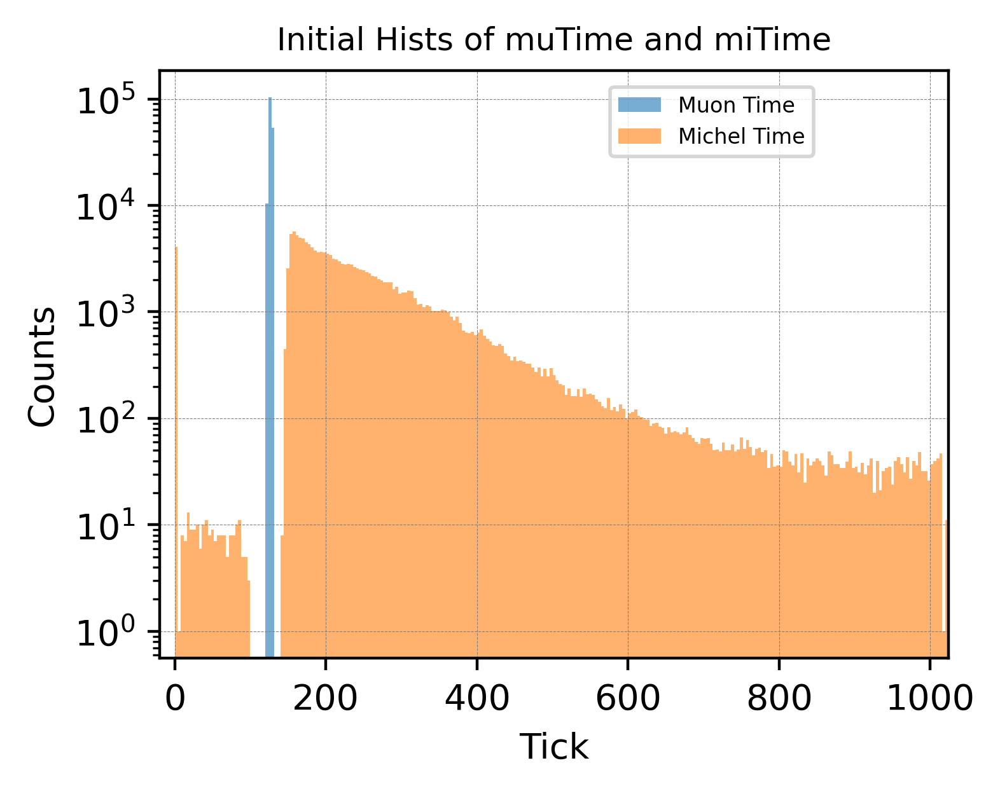




Lifetime distribution (Updated):
# Initial Candidates [-16000, 16000]:  167796


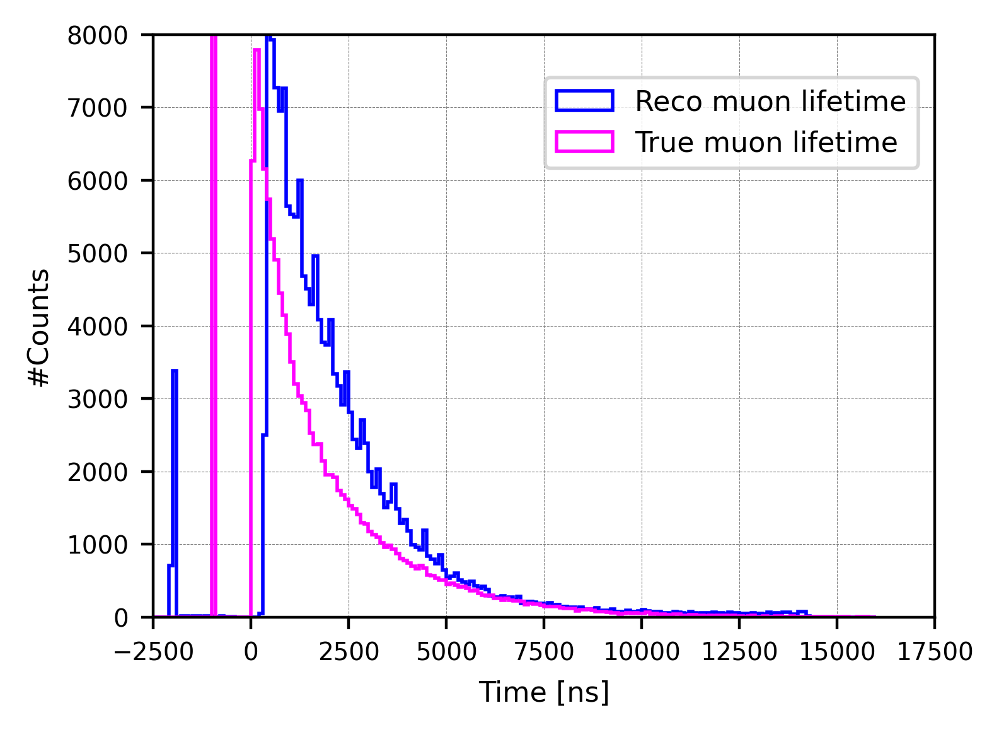

In [97]:
events_reco_update1 = []
events_true_update1 = []

lifetime_reco_update1 = []

for ev in events_reco_initial:
    muTime = ev.muon_time
    miTime = ev.michel_time
    energy = ev.energy

    if 120 <= muTime <= 130:
        events_reco_update1.append(ev)
        t = miTime-muTime
        lifetime_reco_update1.append(t)

        if energy > 0:
            events_true_update1.append(ev)


print("Muon events selection (mu peak constrained to [120, 130]):")
print("Updated Muon events: ", len(events_reco_update1), "/ ", len(events_reco_initial), 
       "({:.2f}%)".format(len(events_reco_update1)/len(events_reco_initial)*100))

# Element-wise subtraction: (mi - mu) for each corresponding element
print("Length of time_difference (Updated): ", len(lifetime_reco_update1))

print("\nMichel purity: ", len(events_true_update1), "/ ", len(events_reco_update1), 
      "({:.2f}%)".format(len(events_true_update1)/len(events_reco_update1)*100)) 









#Initial Mu and Michel time distributions=================================================
plt.figure(figsize=(4,3),dpi=400)

muTime_update = [ev.muon_time for ev in events_reco_update1]
miTime_update = [ev.michel_time for ev in events_reco_update1]


# Example: set your bin parameters
range_min_initial = 0
range_max_initial = 1024
bin_width_initial = 4  # You can change this value; default: 4
bins = np.arange(range_min_initial, range_max_initial + bin_width_initial, bin_width_initial)

# Plot histograms on the same canvas
plt.hist(muTime_update, bins=bins, alpha=0.6, label='Muon Time')
plt.hist(miTime_update, bins=bins, alpha=0.6, label='Michel Time')

plt.xlabel('Tick')
plt.ylabel('Counts')
plt.yscale('log')
plt.xlim(-20, 1024)
plt.title('Initial Hists of muTime and miTime', fontsize=9)

plt.legend(loc='upper center', bbox_to_anchor=(0.7, 0.99), fontsize=9, markerscale=4, ncol=1, prop={'size':6})
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)

plt.show()









# Muon Lifetime distribution (INITIAL; NO fitting)--------------------------------------------
plt.figure(figsize=(4, 3), dpi=400)

# Convert to ns (assuming mu_lifetime is already defined)
timdeDiff_update_ns = [value * 16 for value in lifetime_reco_update1]#reco lifetime---

lifetime_true_update1 = [ev.lifetime for ev in events_reco_update1]
lifetime_update_ns = [value * 1000 for value in lifetime_true_update1]#True lifetime---


print("\n\n\nLifetime distribution (Updated):")
print("# Initial Candidates [-16000, 16000]: ", len(timdeDiff_update_ns))

# Define histogram parameters
bin_width = 100
range_min = -16000
range_max = 16000
bins = np.arange(range_min, range_max + bin_width, bin_width)

# Plot histogram-----------------
plt.hist(timdeDiff_update_ns, bins=bins, range=(range_min, range_max),
         edgecolor='blue', histtype='step', linewidth=1.0,
         label='Reco muon lifetime')

plt.hist(lifetime_update_ns, bins=bins, range=(range_min, range_max),
         edgecolor='magenta', histtype='step', linewidth=1.0,
         label='True muon lifetime')


plt.xlim(-2500, 17500)
plt.ylim(0, 8000)
#plt.yscale('log')
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('#Counts', fontsize=8)
#plt.title('Purified (mu time [55, 65]) Lifetime')
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.74, 0.95), fontsize=11, markerscale=5, ncol=1, prop={'size':8})
plt.show()






<br />
<br />
<br />
<br />


### Purification / cut 3: remove events with unphysical lifetime (constrain lifetime to [500, inf))

#### (20251022): lifetime cut should be >0 here (we know later that 500 is NOT a good standard)




Lifetime distribution (Updated):
# Updated Candidates [0, 16000]:  163514

#Purity:  121496 / 163514 (74.30%)


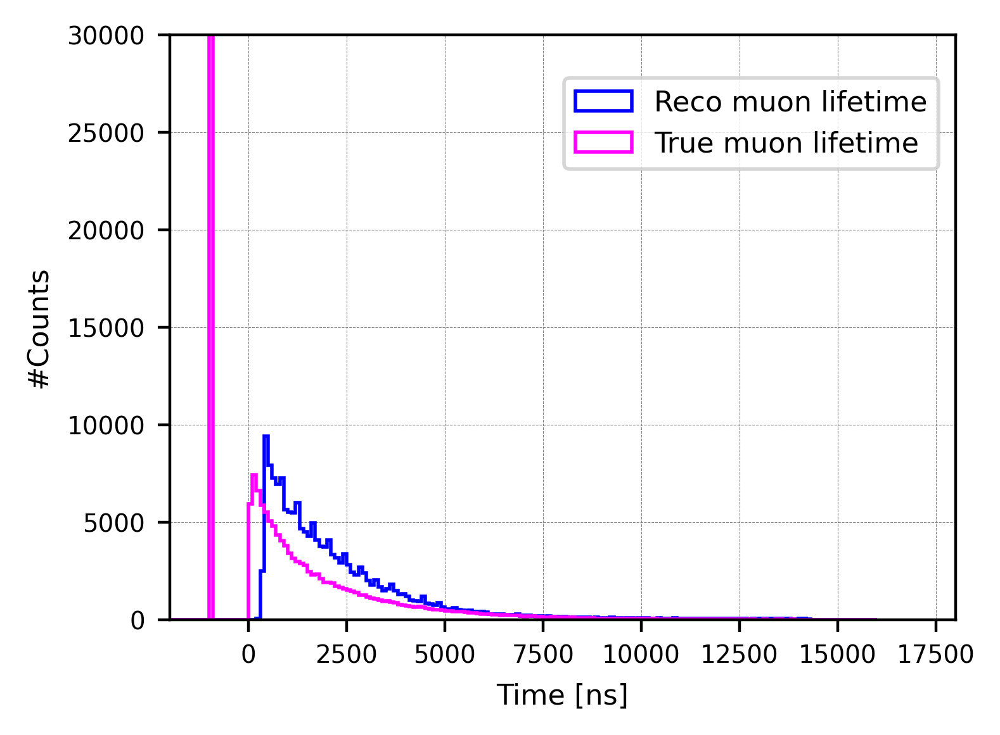

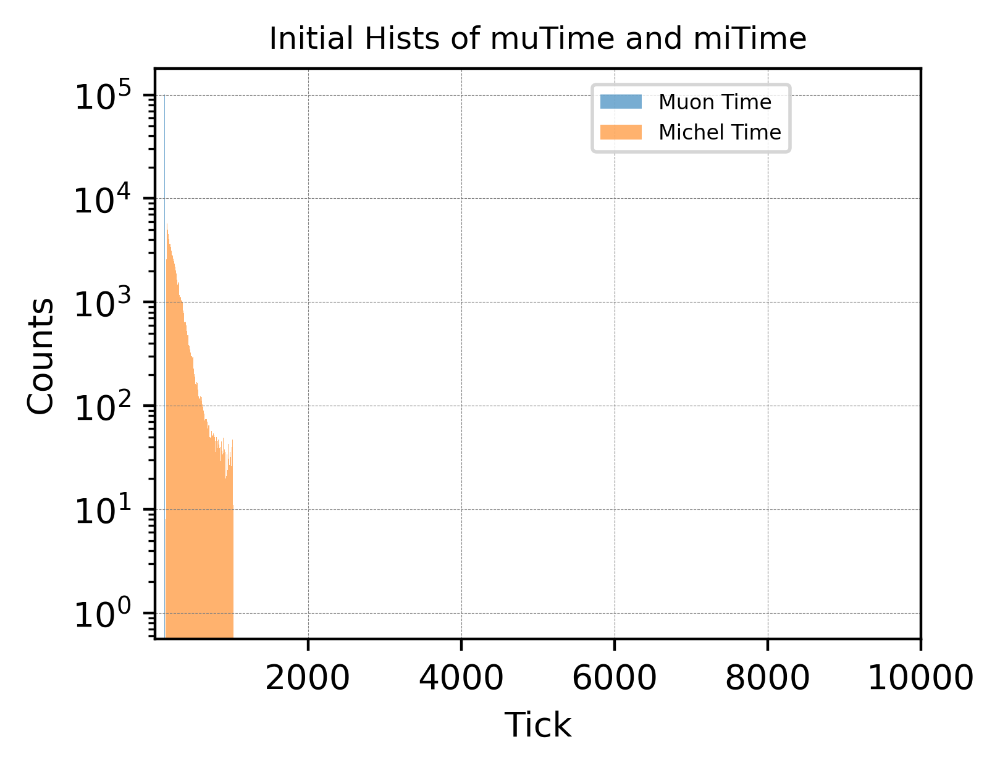


--------------------------------------
[-500, 500]:  74976 / 163514 (45.85%)


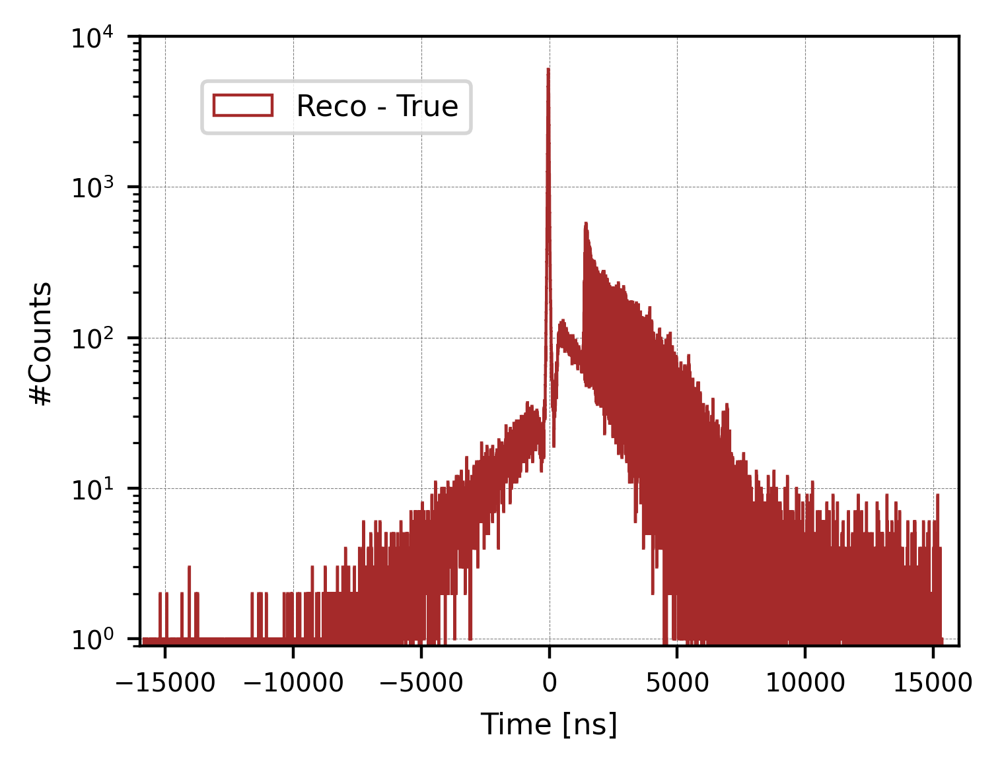



Explore the peak------


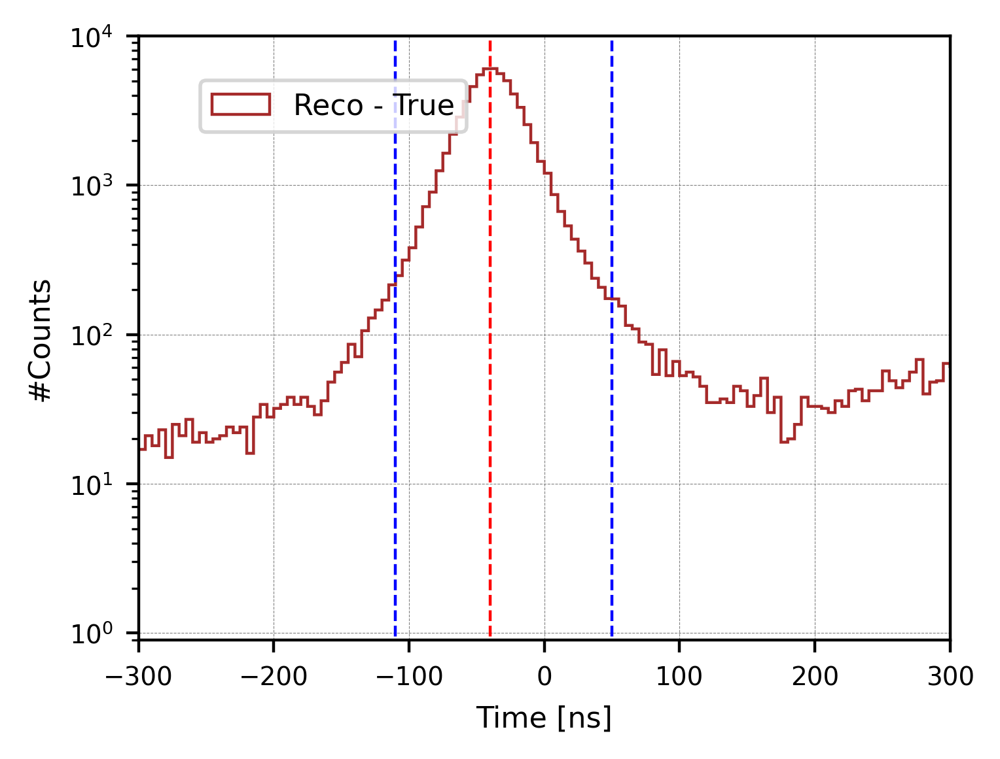



Do Gaussian Fitting for Peak!!!




In [98]:
events_reco_update2 = []#Dataset after Purification 2---
events_true_update2 = []
lifetime_reco_update2 = []

for ev in events_reco_update1:
    muTime = ev.muon_time
    miTime = ev.michel_time
    timeDiff = (miTime - muTime) * 16 #convert from tick to ns---
    e = ev.energy

    if 0 <= timeDiff: #keep physical events here---
        events_reco_update2.append(ev)
        lifetime_reco_update2.append(timeDiff)

        if e > 0:
            events_true_update2.append(ev)


print("\n\n\nLifetime distribution (Updated):")
print("# Updated Candidates [0, 16000]: ", len(events_reco_update2))

        
print("\n#Purity: ", len(events_true_update2), "/", len(events_reco_update2), 
     "({:.2f}%)".format(len(events_true_update2)/len(events_reco_update2)*100))







# Muon Lifetime distribution (INITIAL; NO fitting)--------------------------------------------
plt.figure(figsize=(4, 3), dpi=400)


# Define histogram parameters
bin_width = 100
range_min = -16000
range_max = 16000
bins = np.arange(range_min, range_max + bin_width, bin_width)

# Plot histogram-----------------
plt.hist(lifetime_reco_update2, bins=bins, range=(range_min, range_max),
         edgecolor='blue', histtype='step', linewidth=1.0,
         label='Reco muon lifetime')


lifetime_update_ns2 = [ev.lifetime * 1000 for ev in events_reco_update2]#True lifetime (contain false)---
plt.hist(lifetime_update_ns2, bins=bins, range=(range_min, range_max),
         edgecolor='magenta', histtype='step', linewidth=1.0,
         label='True muon lifetime')


plt.xlim(-2000, 18000)
plt.ylim(0, 30000)
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('#Counts', fontsize=8)
#plt.title('Purified (mu time [55, 65]) Lifetime')
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.74, 0.95), fontsize=11, markerscale=5, ncol=1, prop={'size':8})
plt.show()






#--------------------------------------------------------------
#Mu time & Mi time distribution after reco>0:
muTime_update_ns2 = [ev.muon_time for ev in events_reco_update2]
miTime_update_ns2 = [ev.michel_time for ev in events_reco_update2]

plt.figure(figsize=(4,3),dpi=400)

# Example: set your bin parameters
range_min_initial = 0
range_max_initial = 1024
bin_width_initial = 4  # You can change this value; default: 4
bins = np.arange(range_min_initial, range_max_initial + bin_width_initial, bin_width_initial)

# Plot histograms on the same canvas
plt.hist(muTime_update_ns2, bins=bins, alpha=0.6, label='Muon Time')
plt.hist(miTime_update_ns2, bins=bins, alpha=0.6, label='Michel Time')

plt.xlabel('Tick')
plt.ylabel('Counts')
plt.yscale('log')
plt.xlim(-20, 1024)
plt.xlim(0.9, 10000)
plt.title('Initial Hists of muTime and miTime', fontsize=9)

plt.legend(loc='upper center', bbox_to_anchor=(0.7, 0.99), fontsize=9, markerscale=4, ncol=1, prop={'size':6})
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)

plt.show()












#---------------------------------------------------------------
#Reco True difference-------------------------------------------

diff_reco_true = []
for ev in events_reco_update2:
    muTime = ev.muon_time
    miTime = ev.michel_time
    timeDiff = (miTime - muTime) * 16 #convert from tick to ns---
    lifetime = ev.lifetime * 1000 #convert to ns---

    diff_reco_true.append(timeDiff-lifetime)


reco_true_count_500 = sum(-500 <= x <= 500 for x in diff_reco_true)
print("\n--------------------------------------")
print("[-500, 500]: ", reco_true_count_500, "/", len(diff_reco_true), 
     "({:.2f}%)".format(reco_true_count_500/len(diff_reco_true)*100))


#------------------------------------------
plt.figure(figsize=(4, 3), dpi=400)

# Define histogram parameters
bin_width = 5
range_min = -16000
range_max = 16000
bins = np.arange(range_min, range_max + bin_width, bin_width)

# Plot histogram-----------------
plt.hist(diff_reco_true, bins=bins, range=(range_min, range_max),
         edgecolor='brown', histtype='step', linewidth=0.8,
         label='Reco - True')


plt.xlim(-16000, 16000)
plt.ylim(0.9, 10000)
plt.yscale('log')
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('#Counts', fontsize=8)
#plt.title('Purified (mu time [55, 65]) Lifetime')
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.24, 0.95), fontsize=11, markerscale=5, ncol=1, prop={'size':8})
plt.show()





#------------------------------------------
plt.figure(figsize=(4, 3), dpi=400)

print("\n\nExplore the peak------")

# Plot histogram-----------------
plt.hist(diff_reco_true, bins=bins, range=(range_min, range_max),
         edgecolor='brown', histtype='step', linewidth=0.8,
         label='Reco - True')

plt.plot([-110, -110], [0, 10000], color="blue", linewidth=0.8, linestyle='--')
plt.plot([50, 50], [0, 10000], color="blue", linewidth=0.8, linestyle='--')
plt.plot([-40, -40], [0, 10000], color="red", linewidth=0.8, linestyle='--')

plt.xlim(-300, 300)
plt.ylim(0.9, 10000)
plt.yscale('log')
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('#Counts', fontsize=8)
#plt.title('Ex=')
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.24, 0.95), fontsize=11, markerscale=5, ncol=1, prop={'size':8})
plt.show()



print("\n\nDo Gaussian Fitting for Peak!!!\n\n")

<br />
<br />
<br />
<br />
<br />
<br />
<br />

## Explore Dataset After purification 3 [RecoT>0]:

In [99]:
@dataclass
class PdsEventNew: #new class containing reco lifetime, true lifetime & diff
    muon_time: Optional[int] = None
    michel_time: Optional[int] = None
    muon_intensity: Optional[float] = None
    michel_intensity: Optional[float] = None
    third_intensity: Optional[float] = None
    posX: Optional[float] = None
    posY: Optional[float] = None
    posZ: Optional[float] = None
    energy: Optional[float] = None
    lifetime: Optional[float] = None #in unit of us---
    pdg: Optional[int] = None
    eventID: Optional[int] = None
    trackID: Optional[int] = None
    date: Optional[int] = None 
    michel_score: Optional[float] = None         # ✅ NEW
    michel_hits: Optional[int] = None 
    reco_lifetime: Optional[float] = None
    true_lifetime: Optional[float] = None # in unit of ns---
    diff_lifetime: Optional[float] = None
    michel_rise: Optional[float] = None
    michel_drop: Optional[float] = None



#Test print---------------
print("Size of events_reco_update2 (previous class): ", len(events_reco_update2))

#New calculated reco & true lifetime lists:
recoLife_update2 = []
trueLife_update2 = []  
diffLife_update2 = []

michel_rise_slope = []
michel_drop_slope = []

for ev in events_reco_update2:
    muTime = ev.muon_time
    miTime = ev.michel_time
    timeDiff = (miTime - muTime) * 16 #convert from tick to ns---

    recoLife_update2.append(timeDiff)
    trueLife_update2.append(ev.lifetime * 1000)
    diffLife_update2.append(timeDiff - ev.lifetime * 1000)

    left_slope = ev.mi_leftHeight / (miTime - ev.mi_leftTurn)
    right_slope = ev.mi_rightHeight / (ev.mi_rightTurn - miTime)

#    left_slope = (miTime - ev.mi_leftTurn)
#    right_slope = (ev.mi_rightTurn - miTime)

    michel_rise_slope.append(left_slope)
    michel_drop_slope.append(right_slope)

print("Size of lifetime_reco_update2               : ", len(recoLife_update2))
print("Size of lifetime_update_ns2                 : ", len(trueLife_update2))



#Final events with new features----------
events_newClass = []
for ev, reco_life, true_life, diff_life, rise, drop in zip(
    events_reco_update2, 
    recoLife_update2, 
    trueLife_update2, 
    diffLife_update2,
    michel_rise_slope,
    michel_drop_slope
    ):
    new_ev = PdsEventNew(
        muon_time=ev.muon_time,
        michel_time=ev.michel_time,
        muon_intensity=ev.muon_intensity,
        michel_intensity=ev.michel_intensity,
        third_intensity=ev.third_intensity,
        posX=ev.posX,
        posY=ev.posY,
        posZ=ev.posZ,
        energy=ev.energy,
        lifetime=ev.lifetime,
        pdg=ev.pdg,
        eventID=ev.eventID,
        trackID=ev.trackID,
        date=ev.date,
        michel_score=ev.michel_score,
        michel_hits=ev.michel_hits, 
        reco_lifetime=reco_life,
        true_lifetime=true_life,
        diff_lifetime=diff_life,
        michel_rise=rise,
        michel_drop=drop
    )
    events_newClass.append(new_ev)

print("\nLength of final dataset in format of new class: ", len(events_newClass))


events_diff500 = []
events_diff0 = []
true_newClass = []
for ev in events_newClass:
    if ev.energy > 0:
        true_newClass.append(ev)

#===========================================================================
    if ev.diff_lifetime > 50 or ev.diff_lifetime < -110:
        events_diff500.append(ev)
    if -110 < ev.diff_lifetime < 50:
        events_diff0.append(ev)
#===========================================================================

print("\nLength of final true in format of new class: ", len(true_newClass))

print("\nEvents with diff [-110, 50] : ", len(events_diff0), "/", len(true_newClass),
       "({:.2f}%)".format(len(events_diff0)/len(true_newClass)*100))
print("\nEvents with diff OTHERS: ", len(events_diff500), "/", len(events_newClass),
       "({:.2f}%)".format(len(events_diff500)/len(events_newClass)*100))


Size of events_reco_update2 (previous class):  163514
Size of lifetime_reco_update2               :  163514
Size of lifetime_update_ns2                 :  163514

Length of final dataset in format of new class:  163514

Length of final true in format of new class:  121496

Events with diff [-110, 50] :  65690 / 121496 (54.07%)

Events with diff OTHERS:  97824 / 163514 (59.83%)


### Purification 4:  Michel Intensity / Muon Intensity:

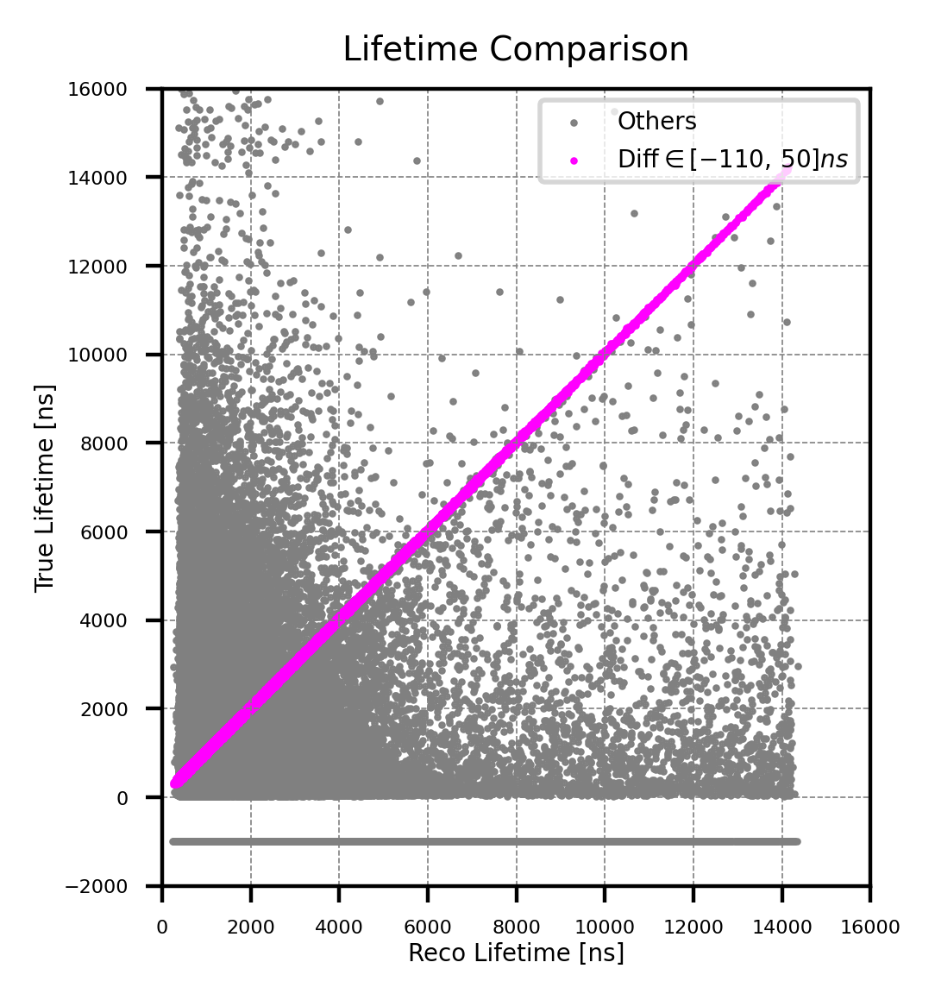

After lifetime cut (cut 3):
Purity (true / reco):  121496 / 163514 (74.30%)

(Diff [-110, 50]):  65690 / 163514 (40.17%)
(Diff OTHERS)    :  97824 / 163514 (59.83%)

(michel Intensity) / (muon intensity) (Cut 4):----------
Efficiency (cut4 / cut3):  64151 / 163514 (39.23%)
Purity (true / reco):  57598 / 64151 (89.79%)

(Diff [-110, 50]):  39790 / 64151 (62.03%)
(Diff Others)    :  24361 / 64151 (37.97%)


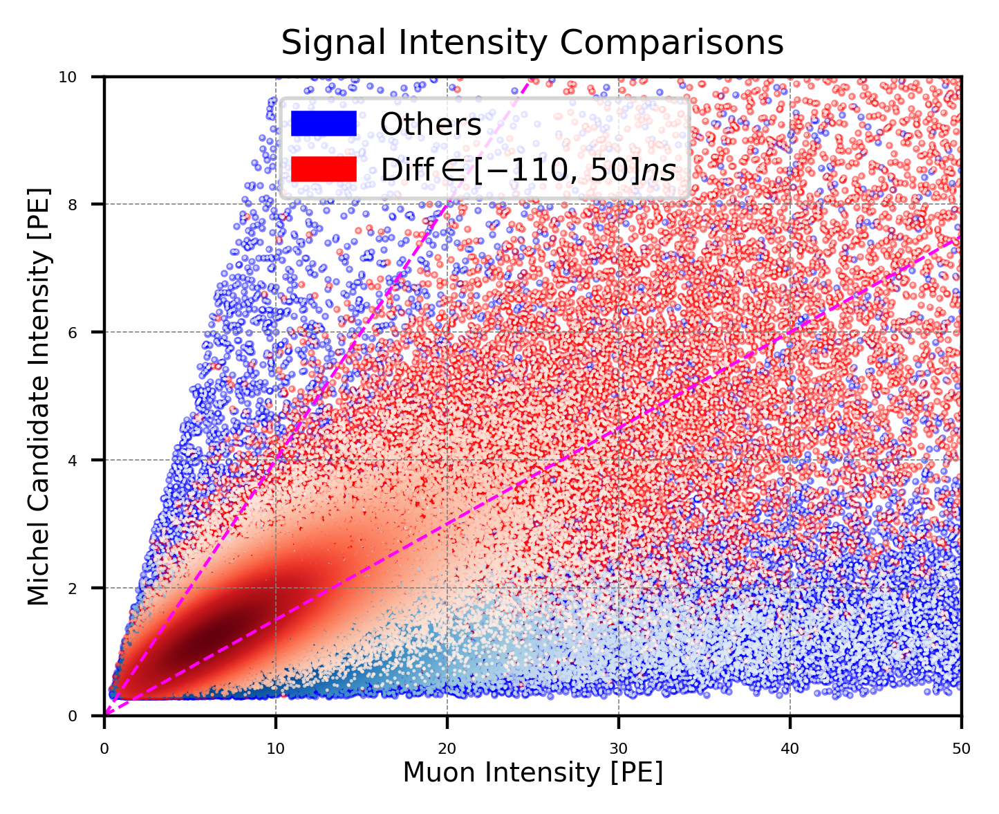


Purify 4----------------------


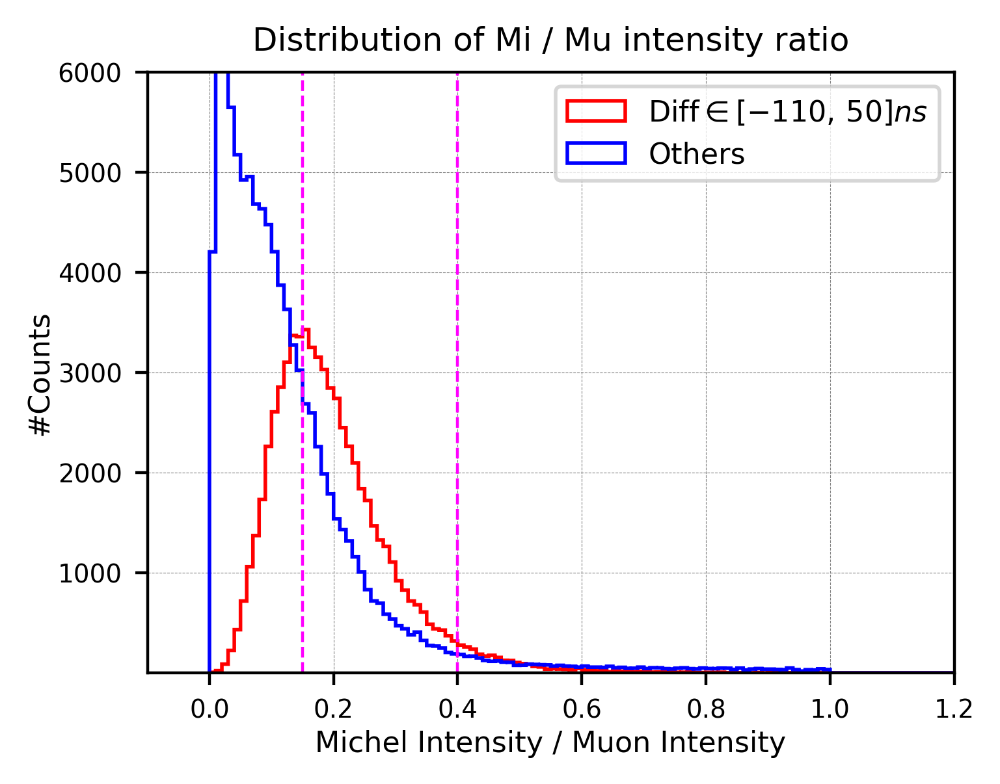

=== Bin-by-bin Ratio: Others / Diff [-110, 50] ===
x=0.005, Ratio=700.8333
x=0.015, Ratio=294.3043
x=0.025, Ratio=69.6705
x=0.035, Ratio=25.1022
x=0.045, Ratio=11.9815
x=0.055, Ratio=6.8565
x=0.065, Ratio=4.6720
x=0.075, Ratio=3.4125
x=0.085, Ratio=2.6767
x=0.095, Ratio=1.9783
x=0.105, Ratio=1.6137
x=0.115, Ratio=1.3566
x=0.125, Ratio=1.1702
x=0.135, Ratio=0.9715
x=0.145, Ratio=0.9003
x=0.155, Ratio=0.7839
x=0.165, Ratio=0.7991
x=0.175, Ratio=0.7166
x=0.185, Ratio=0.6561
x=0.195, Ratio=0.6285
x=0.205, Ratio=0.5616
x=0.215, Ratio=0.5845
x=0.225, Ratio=0.5826
x=0.235, Ratio=0.5524
x=0.245, Ratio=0.5478
x=0.255, Ratio=0.4829
x=0.265, Ratio=0.4894
x=0.275, Ratio=0.5245
x=0.285, Ratio=0.4636
x=0.295, Ratio=0.4869
x=0.305, Ratio=0.5120
x=0.315, Ratio=0.5339
x=0.325, Ratio=0.5292
x=0.335, Ratio=0.6000
x=0.345, Ratio=0.5329
x=0.355, Ratio=0.5638
x=0.365, Ratio=0.6091
x=0.375, Ratio=0.5794
x=0.385, Ratio=0.5511
x=0.395, Ratio=0.5956
x=0.405, Ratio=0.6655
x=0.415, Ratio=0.6385
x=0.425, Ratio=0.7

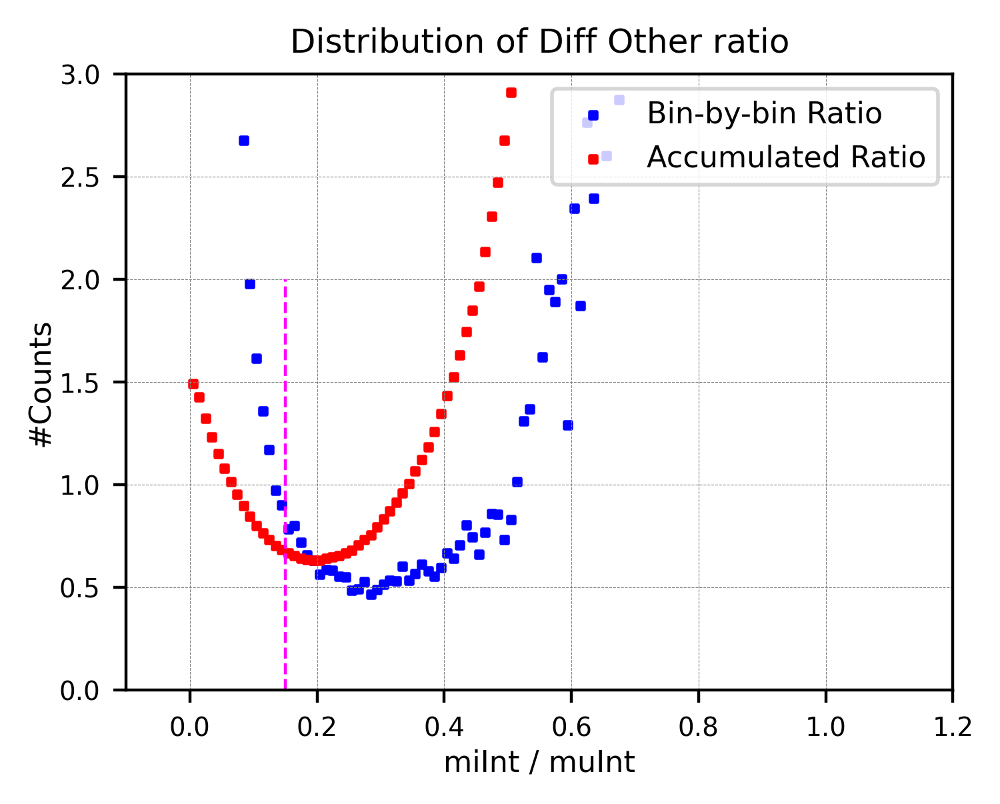

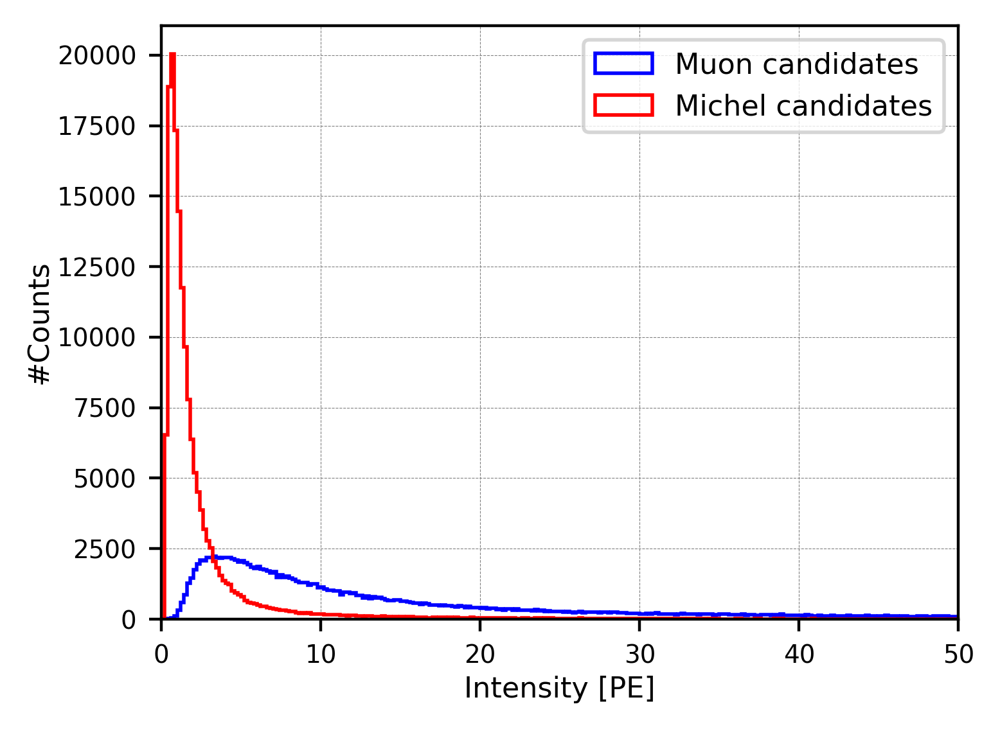

Saved!


In [100]:
from scipy.stats import gaussian_kde
from matplotlib import colors 
import matplotlib.patches as mpatches

trueLife_diff500 = [ev.true_lifetime for ev in events_diff500]
recoLife_diff500 = [ev.reco_lifetime for ev in events_diff500]
muInt_diff500 = [ev.muon_intensity for ev in events_diff500]
miInt_diff500 = [ev.michel_intensity for ev in events_diff500]
X_diff500 = [ev.posX for ev in events_diff500]

trueLife_diff0 = [ev.true_lifetime for ev in events_diff0]
recoLife_diff0 = [ev.reco_lifetime for ev in events_diff0]
muInt_diff0 = [ev.muon_intensity for ev in events_diff0]
miInt_diff0 = [ev.michel_intensity for ev in events_diff0]
X_diff0 = [ev.posX for ev in events_diff0]

# Total---
muInt_total = [ev.muon_intensity for ev in events_newClass]
miInt_total = [ev.michel_intensity for ev in events_newClass]


# ==========================================================
# TrueLife VS RecoLife
# ==========================================================
plt.figure(figsize=(4,3), dpi=400)

# Scatter plot----------
plt.scatter(recoLife_diff500, trueLife_diff500, s=0.3, c='grey', alpha=1.0, label="Others")
plt.scatter(recoLife_diff0, trueLife_diff0, s=0.3, c='magenta', alpha=1.0, label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
#-----------------------

plt.axis('scaled')
plt.xlim(0, 16000)
plt.ylim(-2000, 16000)
plt.ylabel('True Lifetime [ns]', labelpad=1, fontsize=5)
plt.xlabel('Reco Lifetime [ns]', labelpad=1, fontsize=5)
plt.title('Lifetime Comparison', fontsize=7)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
plt.legend(fontsize=5, loc="upper right")
plt.show()








#Michel Intensity Cut (Cut 4)================================================
print("After lifetime cut (cut 3):")

n_valid = sum(1 for ev in events_newClass if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco): ", n_valid, "/", len(events_newClass),
      "({:.2f}%)".format(n_valid/len(events_newClass)*100))

print("\n(Diff [-110, 50]): ", len(events_diff0), "/", len(events_newClass),
       "({:.2f}%)".format(len(events_diff0)/len(events_newClass)*100))
print("(Diff OTHERS)    : ", len(muInt_diff500), "/", len(events_newClass),
       "({:.2f}%)".format(len(muInt_diff500)/len(events_newClass)*100))



thre1 = 7.5 / 50
thre2 = 40 / 100

# filter the actual events
events_diff0_purify4 = [
    ev for ev in events_diff0
    if ev.muon_intensity != 0 and thre1 < ev.michel_intensity / ev.muon_intensity < thre2
]
events_diff500_purify4 = [
    ev for ev in events_diff500
    if ev.muon_intensity != 0 and thre1 < ev.michel_intensity / ev.muon_intensity < thre2
]
#-------------------------------

print("\n(michel Intensity) / (muon intensity) (Cut 4):----------")
events_total_purify4 = events_diff0_purify4 + events_diff500_purify4

print("Efficiency (cut4 / cut3): ", len(events_total_purify4), "/", len(events_newClass),
      "({:.2f}%)".format(len(events_total_purify4)/len(events_newClass)*100))

n_valid = sum(1 for ev in events_total_purify4 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco): ", n_valid, "/", len(events_total_purify4),
      "({:.2f}%)".format(n_valid/len(events_total_purify4)*100))

print("\n(Diff [-110, 50]): ", len(events_diff0_purify4), "/", len(events_total_purify4),
       "({:.2f}%)".format(len(events_diff0_purify4)/len(events_total_purify4)*100))
print("(Diff Others)    : ", len(events_diff500_purify4), "/", len(events_total_purify4),
       "({:.2f}%)".format(len(events_diff500_purify4)/len(events_total_purify4)*100))










# ==========================================================
# Mu Intensity VS Michel Intensity
# ==========================================================
plt.figure(figsize=(4,3), dpi=400)

# Scatter plot--------------------
# Convert to numpy arrays
x1, y1 = np.array(muInt_diff500), np.array(miInt_diff500)
x2, y2 = np.array(muInt_diff0), np.array(miInt_diff0)
x3, y3 = np.array(muInt_total), np.array(miInt_total)#total---
# --- Density for group 1 (red, 500<Diff) ---
xy1 = np.vstack([x1, y1])
z1 = gaussian_kde(xy1)(xy1)
idx1 = z1.argsort()
x1, y1, z1 = x1[idx1], y1[idx1], z1[idx1]
# --- Density for group 2 (blue, 0<Diff<500) ---
xy2 = np.vstack([x2, y2])
z2 = gaussian_kde(xy2)(xy2)
idx2 = z2.argsort()
x2, y2, z2 = x2[idx2], y2[idx2], z2[idx2]
# --- Density for group total ---
xy3 = np.vstack([x3, y3])
z3 = gaussian_kde(xy3)(xy3)
idx3 = z3.argsort()
x3, y3, z3 = x3[idx3], y3[idx3], z3[idx3]
# --- Scatter plots with base colors red & blue ---
# Base layer (solid red/blue so single points are visible)
plt.scatter(x1, y1, s=0.8, color="blue", alpha=0.5, label="_nolegend_")
plt.scatter(x2, y2, s=0.8, color="red", alpha=0.5, label="_nolegend_")
#plt.scatter(x3, y3, s=0.8, color="orange", alpha=0.5, label="_nolegend_")
# Density layer (adds darker shades where points overlap)
plt.scatter(x1, y1, c=z1, s=0.8, cmap="Blues", alpha=0.8, edgecolors="none", label="Others")
plt.scatter(x2, y2, c=z2, s=0.8, cmap="Reds", alpha=0.8, edgecolors="none", label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
#plt.scatter(x3, y3, c=z3, s=0.8, cmap="Oranges", alpha=0.8, edgecolors="none", label="MC Reco Total")
#---------------------------------

plt.plot([0, 500], [0, 75], color="magenta", linewidth=0.8, linestyle='--')
plt.plot([0, 1000], [0, 400], color="magenta", linewidth=0.8, linestyle='--')

#plt.axis('scaled')
plt.xlim(0, 50)#(-5, 400)
plt.ylim(0, 10)#(-5, 60)
plt.xlabel('Muon Intensity [PE]', labelpad=1, fontsize=7)
plt.ylabel('Michel Candidate Intensity [PE]', labelpad=1, fontsize=7)
plt.title('Signal Intensity Comparisons', fontsize=9)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)

# Create proxy artists (red and blue dots)
red_patch = mpatches.Patch(color="blue", label="Others")
blue_patch = mpatches.Patch(color="red", label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.legend(handles=[red_patch, blue_patch], loc="upper right", frameon=True, 
           bbox_to_anchor=(0.7, 0.99), fontsize=10, markerscale=6, ncol=1, prop={'size':8})

#orange_patch = mpatches.Patch(color="orange", label="Total MC Reco")
#plt.legend(handles=[orange_patch], loc="upper right", frameon=True, 
#           bbox_to_anchor=(0.7, 0.99), fontsize=10, markerscale=6, ncol=1, prop={'size':8})


plt.show()






#Ratio distribution===================================
print("\nPurify 4----------------------")

ratio_diff500_purify3 = [mi / mu for mi, mu in zip(miInt_diff500, muInt_diff500) if mu != 0]
ratio_diff0_purify3 = [mi / mu for mi, mu in zip(miInt_diff0, muInt_diff0) if mu != 0]
ratio_total_purify3 = [mi / mu for mi, mu in zip(miInt_total, muInt_total) if mu != 0]

plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.01
range_min = 0
range_max = 10
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(ratio_diff0_purify3, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=1.0, label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.hist(ratio_diff500_purify3, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="Others")
#plt.hist(ratio_total_purify3, bins=bins, range=(range_min, range_max), edgecolor='orange', 
#         histtype='step', linewidth=1.0, label="Total")

plt.plot([0.15, 0.15], [0, 40000], color="magenta", linewidth=0.8, linestyle='--')
plt.plot([0.4, 0.4], [0, 40000], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(-0.1, 1.2)
plt.xlabel('Michel Intensity / Muon Intensity', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.ylim(0.9, 6000)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Distribution of Mi / Mu intensity ratio', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show() 







# Bin-by-bin ratio & Accumulated ratio of ratio distribution================

# --- Your original binning ---
bins = np.arange(range_min, range_max + bin_width, bin_width)
x_centers = 0.5 * (bins[:-1] + bins[1:])

hist_diff, _  = np.histogram(ratio_diff0_purify3, bins=bins)
hist_other, _ = np.histogram(ratio_diff500_purify3, bins=bins)

# Avoid division by zero
hist_diff_safe = np.where(hist_diff == 0, np.nan, hist_diff)

ratio_bin = hist_other / hist_diff_safe

# Print bin-by-bin ratios
print("=== Bin-by-bin Ratio: Others / Diff [-110, 50] ===")
for xc, r in zip(x_centers, ratio_bin):
    if np.isnan(r):
        print(f"x={xc:.3f}, Ratio=NaN (denominator=0)")
    else:
        print(f"x={xc:.3f}, Ratio={r:.4f}")

cum_diff  = np.cumsum(hist_diff[::-1])[::-1]
cum_other = np.cumsum(hist_other[::-1])[::-1]
cum_ratio = cum_other / np.where(cum_diff == 0, np.nan, cum_diff)

plt.figure(figsize=(4,3), dpi=400)

# --- Scatter points: bin-by-bin ratio (blue) ---
plt.scatter(x_centers, ratio_bin, marker='s',
            color='blue', s=3, label="Bin-by-bin Ratio")

# --- Scatter points: accumulated ratio (red) ---
plt.scatter(x_centers, cum_ratio, marker='s',
            color='red', s=3, label="Accumulated Ratio")

plt.plot([0.15, 0.15], [0, 2], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(-0.1, 1.2)
plt.xlabel('miInt / muInt', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.ylim(0.0, 3.0)
#plt.xscale('log')
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Distribution of Diff Other ratio', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show() 









#Single Intensities===================================

plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.2
range_min = 0
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(muInt_total, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="Muon candidates")
plt.hist(miInt_total, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=1.0, label="Michel candidates")

#plt.plot([1, 1], [0, 400000], color="magenta", linewidth=0.8, linestyle='--')
#plt.plot([4, 4], [0, 400000], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(0, 50)
plt.xlabel('Intensity [PE]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.ylim(0.9, 30000)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
#plt.title('Distribution of Mi / Mu intensity ratio', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show() 


#Save lists:

np.save("muInt_total_MC.npy", np.array(muInt_total))
np.save("miInt_total_MC.npy", np.array(miInt_total))

print("Saved!")


#### Cut 5: Michel intensity & Muon intensity: 

After cut 4):
Purity (true / reco):  57598 / 64151 (89.79%)

(Diff 【-110, 50】:  39790 / 64151 (62.03%)
(Diff Others     :  24361 / 64151 (37.97%)

Michel Intensity Cut (Cut 5):--------------
Efficiency (cut5 / cut4):  42421 / 64151 (66.13%)
Purity (true / reco)    :  38212 / 42421 (90.08%)

(Diff [-110, 50]:  32274 / 42421 (76.08%)
(Diff OTHERS    :  10147 / 42421 (23.92%)


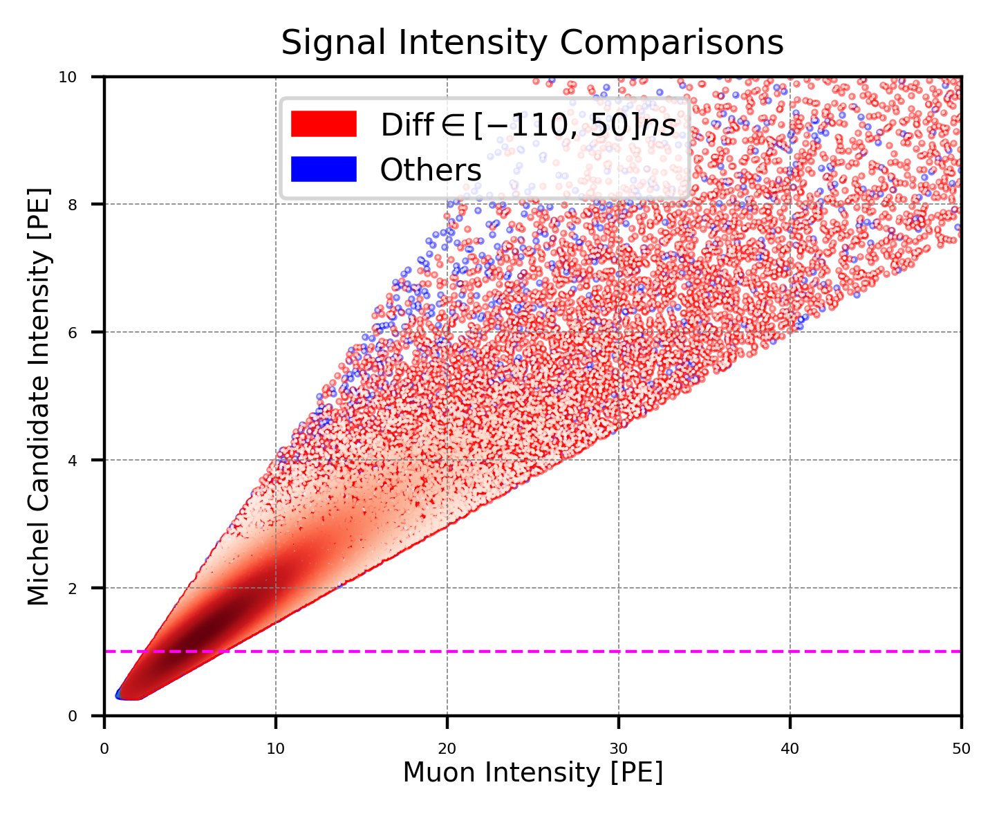


Purify 5----------------------


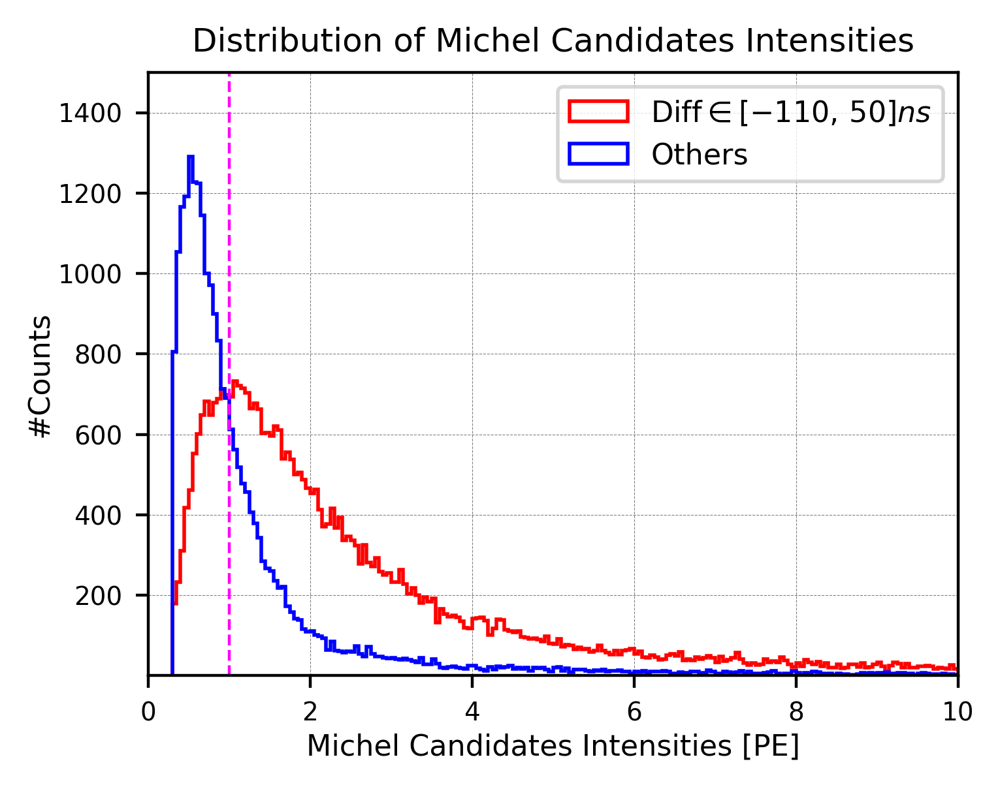

In [101]:
#Michel & Muon Intensities Cut (Cut 5)================================================
print("After cut 4):")

n_valid = sum(1 for ev in events_total_purify4 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco): ", n_valid, "/", len(events_total_purify4),
      "({:.2f}%)".format(n_valid/len(events_total_purify4)*100))

print("\n(Diff 【-110, 50】: ", len(events_diff0_purify4), "/", len(events_total_purify4),
       "({:.2f}%)".format(len(events_diff0_purify4)/len(events_total_purify4)*100))
print("(Diff Others     : ", len(events_diff500_purify4), "/", len(events_total_purify4),
       "({:.2f}%)".format(len(events_diff500_purify4)/len(events_total_purify4)*100))



thre_muInt = 0.3 # mu Int will automatically higher than mi---
thre_miInt = 1.0

# filter the actual events
events_diff0_purify5 = [
    ev for ev in events_diff0_purify4
    if thre_miInt < ev.michel_intensity and thre_muInt < ev.muon_intensity
]
events_diff500_purify5 = [
    ev for ev in events_diff500_purify4
    if thre_miInt < ev.michel_intensity and thre_muInt < ev.muon_intensity
]
#-------------------------------

print("\nMichel Intensity Cut (Cut 5):--------------")

events_total_purify5 = events_diff0_purify5 + events_diff500_purify5

print("Efficiency (cut5 / cut4): ", len(events_total_purify5), "/", len(events_total_purify4),
      "({:.2f}%)".format(len(events_total_purify5)/len(events_total_purify4)*100))

n_valid = sum(1 for ev in events_total_purify5 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify5),
      "({:.2f}%)".format(n_valid/len(events_total_purify5)*100))

print("\n(Diff [-110, 50]: ", len(events_diff0_purify5), "/", len(events_total_purify5),
       "({:.2f}%)".format(len(events_diff0_purify5)/len(events_total_purify5)*100))
print("(Diff OTHERS    : ", len(events_diff500_purify5), "/", len(events_total_purify5),
       "({:.2f}%)".format(len(events_diff500_purify5)/len(events_total_purify5)*100))







# ==========================================================
# Mu Intensity VS Michel Intensity
# ==========================================================
muInt_diff500_purify4 = [ev.muon_intensity for ev in events_diff500_purify4]#Events after purification 4---
miInt_diff500_purify4 = [ev.michel_intensity for ev in events_diff500_purify4]

muInt_diff0_purify4 = [ev.muon_intensity for ev in events_diff0_purify4]
miInt_diff0_purify4 = [ev.michel_intensity for ev in events_diff0_purify4]



plt.figure(figsize=(4,3), dpi=400)

# Scatter plot--------------------
# Convert to numpy arrays
x1, y1 = np.array(muInt_diff500_purify4), np.array(miInt_diff500_purify4)
x2, y2 = np.array(muInt_diff0_purify4), np.array(miInt_diff0_purify4)
# --- Density for group 1 (red, 500<Diff) ---
xy1 = np.vstack([x1, y1])
z1 = gaussian_kde(xy1)(xy1)
idx1 = z1.argsort()
x1, y1, z1 = x1[idx1], y1[idx1], z1[idx1]
# --- Density for group 2 (blue, 0<Diff<500) ---
xy2 = np.vstack([x2, y2])
z2 = gaussian_kde(xy2)(xy2)
idx2 = z2.argsort()
x2, y2, z2 = x2[idx2], y2[idx2], z2[idx2]
# --- Scatter plots with base colors red & blue ---
# Base layer (solid red/blue so single points are visible)
plt.scatter(x1, y1, s=0.8, color="blue", alpha=0.5, label="_nolegend_")
plt.scatter(x2, y2, s=0.8, color="red", alpha=0.5, label="_nolegend_")
# Density layer (adds darker shades where points overlap)
plt.scatter(x1, y1, c=z1, s=0.8, cmap="Blues", alpha=0.8, edgecolors="none", label="Others")
plt.scatter(x2, y2, c=z2, s=0.8, cmap="Reds", alpha=0.8, edgecolors="none", label=r"$\mathrm{Diff} \in [-110,\,50]ns$")

#---------------------------------

plt.plot([0, 100], [1.0, 1.0], color="magenta", linewidth=0.8, linestyle='--')
#plt.plot([0, 1000], [0, 500], color="magenta", linewidth=0.8, linestyle='--')

#plt.axis('scaled')
plt.xlim(0, 50)
plt.ylim(0, 10)
plt.xlabel('Muon Intensity [PE]', labelpad=1, fontsize=7)
plt.ylabel('Michel Candidate Intensity [PE]', labelpad=1, fontsize=7)
plt.title('Signal Intensity Comparisons', fontsize=9)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)

# Create proxy artists (red and blue dots)
red_patch = mpatches.Patch(color="red", label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
blue_patch = mpatches.Patch(color="blue", label="Others")
plt.legend(handles=[red_patch, blue_patch], loc="upper right", frameon=True, 
           bbox_to_anchor=(0.7, 0.99), fontsize=10, markerscale=6, ncol=1, prop={'size':8})


plt.show()







#Michel Intensity distribution===================================
print("\nPurify 5----------------------")

#miInt_diff500_purify5 = [ev.michel_intensity for ev in events_diff500_purify5]
#miInt_diff0_purify5 = [ev.michel_intensity for ev in events_diff0_purify5]

plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.05
range_min = 0
range_max = 10
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(miInt_diff0_purify4, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=1.0, label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.hist(miInt_diff500_purify4, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="Others")

plt.plot([1.0, 1.0], [0, 2000], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(0, 10)
plt.xlabel('Michel Candidates Intensities [PE]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.ylim(0.9, 1500)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Distribution of Michel Candidates Intensities', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show()  





#### Mu & Michel intensity distributions after Cut 5:

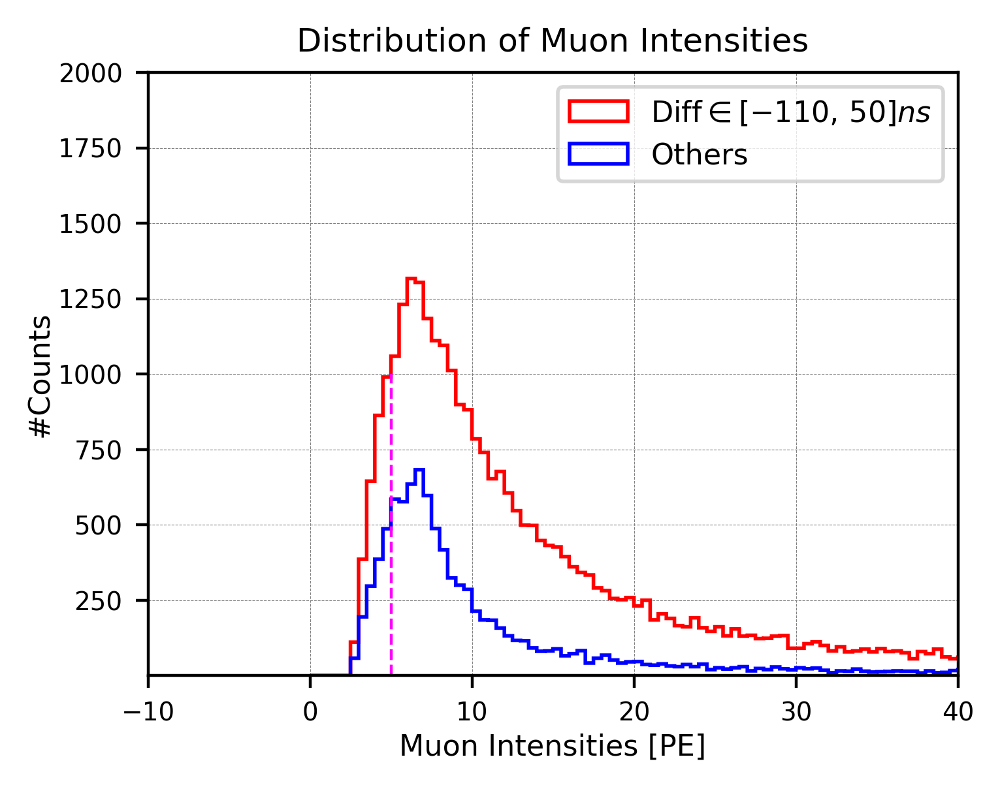

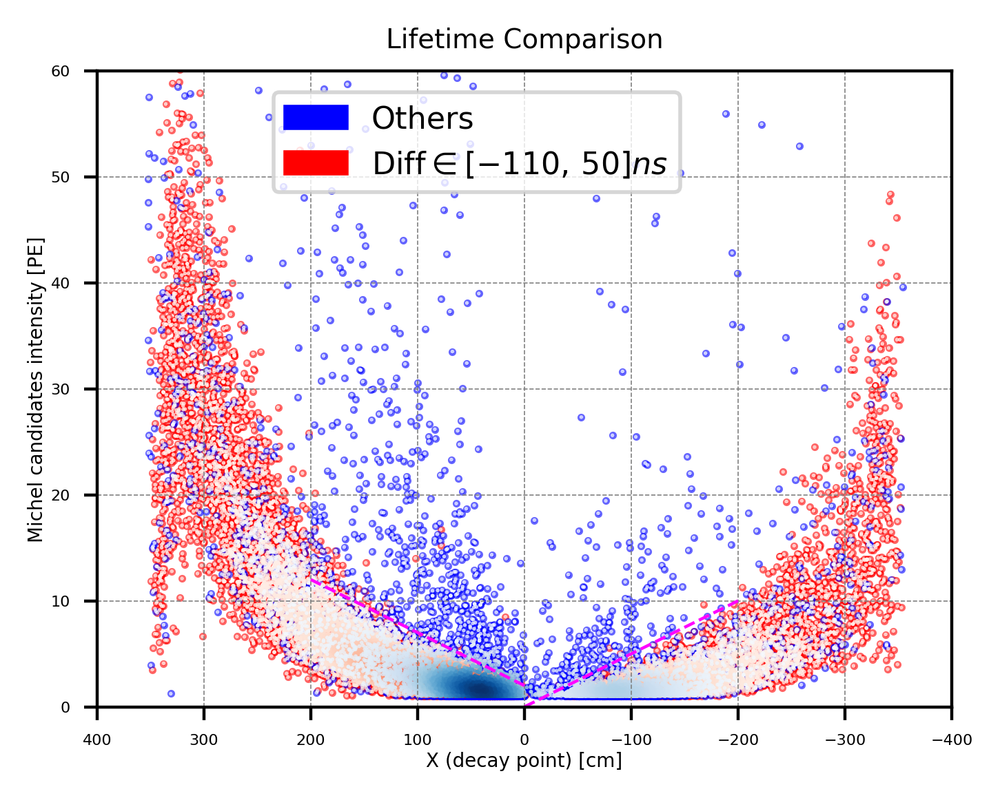

In [102]:
#Muon Intensity distribution===================================

muInt_diff500_purify5 = [ev.muon_intensity for ev in events_diff500_purify5]
muInt_diff0_purify5 = [ev.muon_intensity for ev in events_diff0_purify5]

plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.5
range_min = 0
range_max = 300
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(muInt_diff0_purify5, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=1.0, label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.hist(muInt_diff500_purify5, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="Others")

plt.plot([5, 5], [0, 1000], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(-10, 40)
plt.xlabel('Muon Intensities [PE]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.ylim(0.9, 2000)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Distribution of Muon Intensities', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show() 





#Michel Intensity VS x axis================================
plt.figure(figsize=(4,3), dpi=400)

posX_diff500_purify5 = [ev.posX for ev in events_diff500_purify5]
posX_diff0_purify5 = [ev.posX for ev in events_diff0_purify5]
miInt_diff500_purify5 = [ev.michel_intensity for ev in events_diff500_purify5]
miInt_diff0_purify5 = [ev.michel_intensity for ev in events_diff0_purify5]

# Scatter plot----------
# --- Diff<500 (red group) ---
x0 = np.array(posX_diff0_purify5, dtype=float)
y0 = np.array(miInt_diff0_purify5, dtype=float)
xy0 = np.vstack([x0, y0])
z0 = gaussian_kde(xy0)(xy0)

# --- 500<Diff (blue group) ---
x1 = np.array(posX_diff500_purify5, dtype=float)
y1 = np.array(miInt_diff500_purify5, dtype=float)
xy1 = np.vstack([x1, y1])
z1 = gaussian_kde(xy1)(xy1)

# Base layer (solid color so single points are visible)
plt.scatter(x0, y0, s=1, color="red", alpha=0.6, label="_nolegend_")
plt.scatter(x1, y1, s=1, color="blue", alpha=0.6, label="_nolegend_")
# Density layer (adds shading in dense regions)
plt.scatter(x0, y0, c=z0, s=1, cmap="Reds", alpha=0.8, edgecolors="none", label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.scatter(x1, y1, c=z1, s=1, cmap="Blues", alpha=0.8, edgecolors="none", label="Others")
#-----------------------

#slope = 5/100 [PE/cm]
plt.plot([0.0, 200.0], [2, 12], color="magenta", linewidth=0.8, linestyle='--')
plt.plot([0.0, -200.0], [0, 10], color="magenta", linewidth=0.8, linestyle='--')

#plt.axis('scaled')
plt.xlim(-400, 400)
plt.gca().invert_xaxis()  # Flip x-axis
plt.ylim(0, 60)
plt.xlabel('X (decay point) [cm]', labelpad=1, fontsize=5)
plt.ylabel('Michel candidates intensity [PE]', labelpad=1, fontsize=5)
plt.title('Lifetime Comparison', fontsize=7)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)

# Create proxy artists (red and blue dots)
red_patch = mpatches.Patch(color="blue", label="Others")
blue_patch = mpatches.Patch(color="red", label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.legend(handles=[red_patch, blue_patch], loc="upper right", frameon=True, 
           bbox_to_anchor=(0.7, 0.99), fontsize=10, markerscale=6, ncol=1, prop={'size':8})

plt.show()

#### Cut 5': Michel signal VS Distance cut:

After cut 5:---------
Purity (true / reco)    :  38212 / 42421 (90.08%)

(Diff [-110, 50]:  32274 / 42421 (76.08%)
(Diff OTHERS    :  10147 / 42421 (23.92%)

After Cut 5' (Michel vs Distance):--------------
Efficiency (cut5' / cut5):  41379 / 42421 (97.54%)
Purity (true / reco)    :  37627 / 41379 (90.93%)

(Diff [-110, 50]:  32142 / 41379 (77.68%)
(Diff OTHERS    :  9237 / 41379 (22.32%)


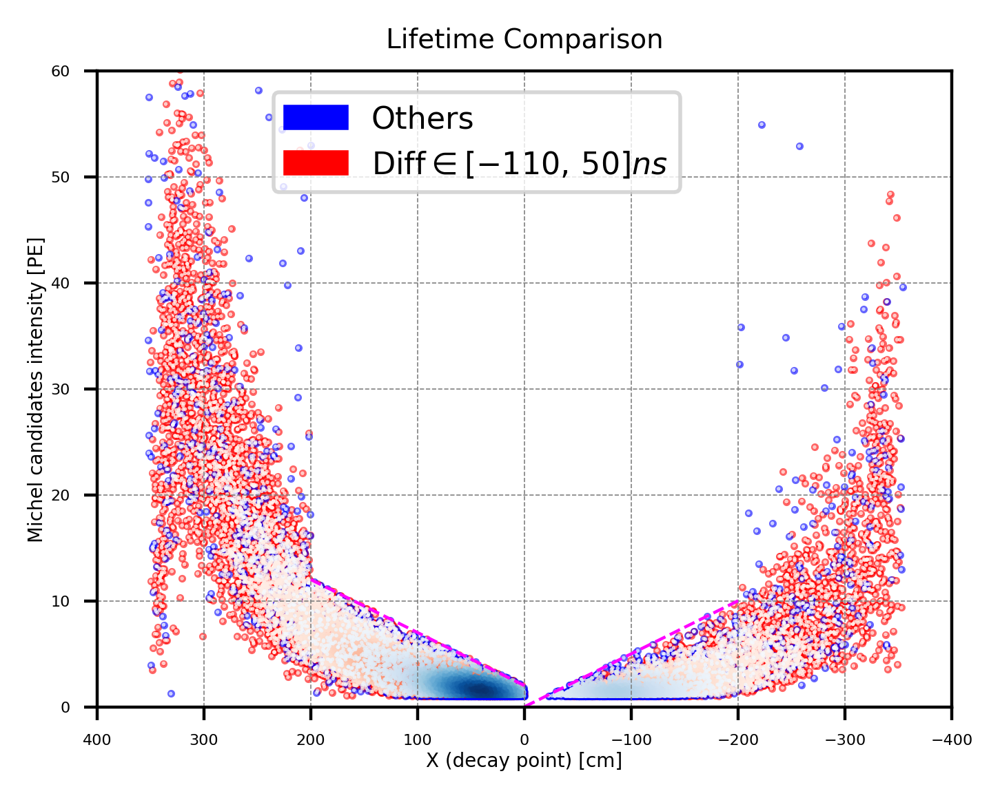

In [103]:
print("After cut 5:---------")

n_valid = sum(1 for ev in events_total_purify5 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify5),
      "({:.2f}%)".format(n_valid/len(events_total_purify5)*100))

print("\n(Diff [-110, 50]: ", len(events_diff0_purify5), "/", len(events_total_purify5),
       "({:.2f}%)".format(len(events_diff0_purify5)/len(events_total_purify5)*100))
print("(Diff OTHERS    : ", len(events_diff500_purify5), "/", len(events_total_purify5),
       "({:.2f}%)".format(len(events_diff500_purify5)/len(events_total_purify5)*100))


#Michel Peak rise & drop Cut (Cut 5')--------
# --- Define slopes and intercepts for both cuts ---
slope_pos = (7 - 2) / 100.0      # = 0.05
intercept_pos = 2.0

slope_neg = (10 - 0) / (-200 - 0.0)  # = -0.05
intercept_neg = 0.0

def below_line_cut(ev):
    """Return True if event passes both (posX, michel_intensity) cuts."""
    x = ev.posX
    y = ev.michel_intensity

    # Region 1: positive side [0, 100]
    if 0 <= x <= 200:
        return y <= intercept_pos + slope_pos * x

    # Region 2: negative side [-200, 0]
    elif -200 <= x <= 0:
        return y <= intercept_neg + slope_neg * x

    # Outside both ranges: no cut
    else:
        return True

# --- Apply the geometric cut to both event classes ---
events_diff0_purify5P = [ev for ev in events_diff0_purify5 if below_line_cut(ev)]
events_diff500_purify5P = [ev for ev in events_diff500_purify5 if below_line_cut(ev)]
#-------------------------------





print("\nAfter Cut 5' (Michel vs Distance):--------------")

events_total_purify5P = events_diff0_purify5P + events_diff500_purify5P

print("Efficiency (cut5' / cut5): ", len(events_total_purify5P), "/", len(events_total_purify5),
      "({:.2f}%)".format(len(events_total_purify5P)/len(events_total_purify5)*100))

n_valid = sum(1 for ev in events_total_purify5P if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify5P),
      "({:.2f}%)".format(n_valid/len(events_total_purify5P)*100))

print("\n(Diff [-110, 50]: ", len(events_diff0_purify5P), "/", len(events_total_purify5P),
       "({:.2f}%)".format(len(events_diff0_purify5P)/len(events_total_purify5P)*100))
print("(Diff OTHERS    : ", len(events_diff500_purify5P), "/", len(events_total_purify5P),
       "({:.2f}%)".format(len(events_diff500_purify5P)/len(events_total_purify5P)*100))






#Michel Intensity VS x axis================================
plt.figure(figsize=(4,3), dpi=400)

posX_diff500_purify5P = [ev.posX for ev in events_diff500_purify5P]
posX_diff0_purify5P = [ev.posX for ev in events_diff0_purify5P]
miInt_diff500_purify5P = [ev.michel_intensity for ev in events_diff500_purify5P]
miInt_diff0_purify5P = [ev.michel_intensity for ev in events_diff0_purify5P]

# Scatter plot----------
# --- Diff<500 (red group) ---
x0 = np.array(posX_diff0_purify5P, dtype=float)
y0 = np.array(miInt_diff0_purify5P, dtype=float)
xy0 = np.vstack([x0, y0])
z0 = gaussian_kde(xy0)(xy0)

# --- 500<Diff (blue group) ---
x1 = np.array(posX_diff500_purify5P, dtype=float)
y1 = np.array(miInt_diff500_purify5P, dtype=float)
xy1 = np.vstack([x1, y1])
z1 = gaussian_kde(xy1)(xy1)

# Base layer (solid color so single points are visible)
plt.scatter(x0, y0, s=1, color="red", alpha=0.6, label="_nolegend_")
plt.scatter(x1, y1, s=1, color="blue", alpha=0.6, label="_nolegend_")
# Density layer (adds shading in dense regions)
plt.scatter(x0, y0, c=z0, s=1, cmap="Reds", alpha=0.8, edgecolors="none", label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.scatter(x1, y1, c=z1, s=1, cmap="Blues", alpha=0.8, edgecolors="none", label="Others")
#-----------------------

#slope = 5/100 [PE/cm]
plt.plot([0.0, 200.0], [2, 12], color="magenta", linewidth=0.8, linestyle='--')
plt.plot([0.0, -200.0], [0, 10], color="magenta", linewidth=0.8, linestyle='--')

#plt.axis('scaled')
plt.xlim(-400, 400)
plt.gca().invert_xaxis()  # Flip x-axis
plt.ylim(0, 60)
plt.xlabel('X (decay point) [cm]', labelpad=1, fontsize=5)
plt.ylabel('Michel candidates intensity [PE]', labelpad=1, fontsize=5)
plt.title('Lifetime Comparison', fontsize=7)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)

# Create proxy artists (red and blue dots)
red_patch = mpatches.Patch(color="blue", label="Others")
blue_patch = mpatches.Patch(color="red", label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.legend(handles=[red_patch, blue_patch], loc="upper right", frameon=True, 
           bbox_to_anchor=(0.7, 0.99), fontsize=10, markerscale=6, ncol=1, prop={'size':8})

plt.show()





#### Cut 6: Michel peak rise and drop slope: 

After cut 5':---------
Purity (true / reco)    :  37627 / 41379 (90.93%)

(Diff [-110, 50]:  32142 / 41379 (77.68%)
(Diff Others    :  9237 / 41379 (22.32%)

Michel Peak Rise Drop Slope (Cut 6):--------------
Efficiency (cut5 / cut4):  31963 / 41379 (77.24%)
Purity (true / reco)    :  29067 / 31963 (90.94%)

(Diff [-110, 50]:  26119 / 31963 (81.72%)
(Diff OTHERS    :  5844 / 31963 (18.28%)


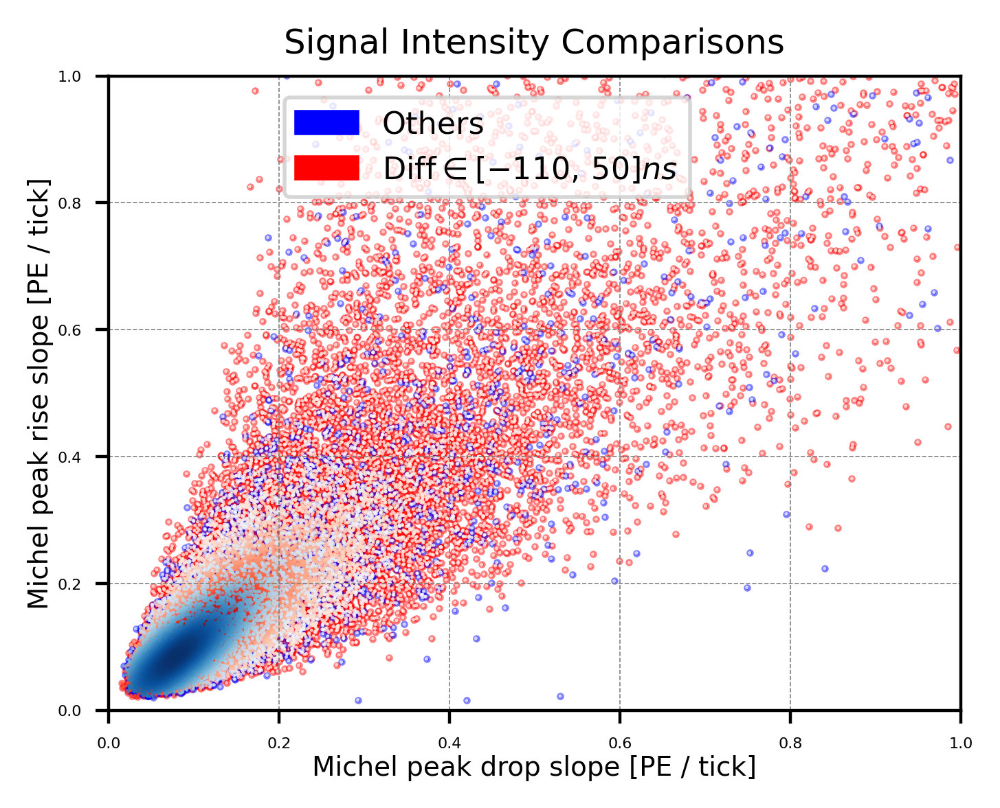

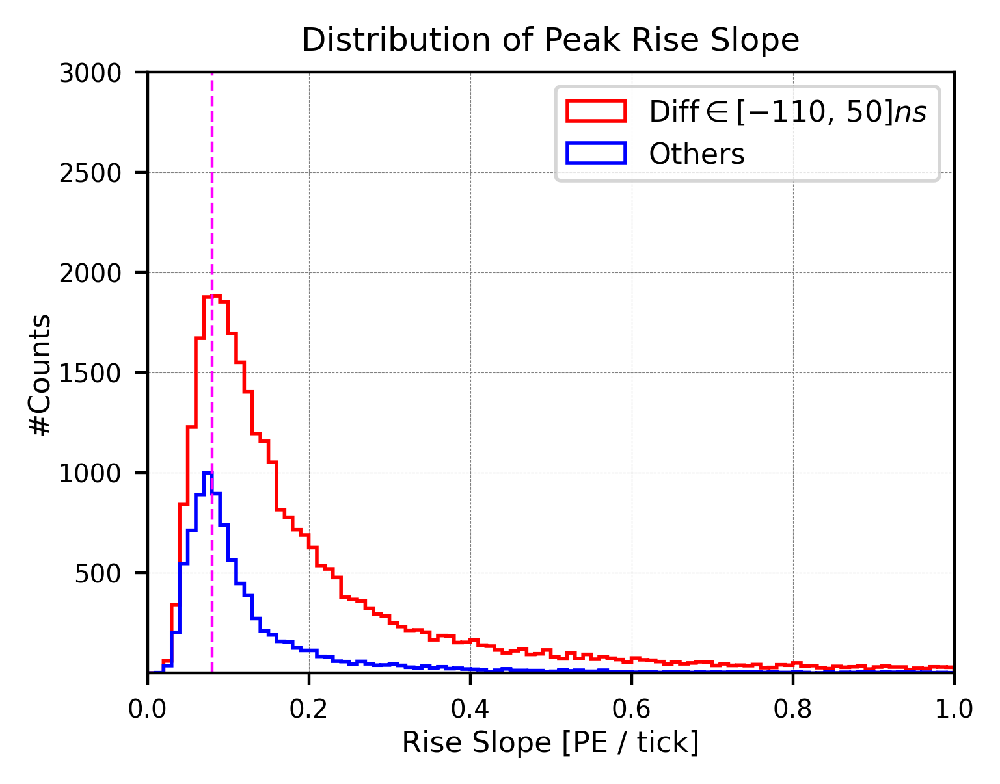

=== Bin-by-bin Ratio: Others / Diff [-110, 50] ===
x=0.005, Ratio=NaN (denominator=0)
x=0.015, Ratio=NaN (denominator=0)
x=0.025, Ratio=0.6167
x=0.035, Ratio=0.5936
x=0.045, Ratio=0.6481
x=0.055, Ratio=0.5806
x=0.065, Ratio=0.5329
x=0.075, Ratio=0.5328
x=0.085, Ratio=0.4753
x=0.095, Ratio=0.3986
x=0.105, Ratio=0.3325
x=0.115, Ratio=0.2882
x=0.125, Ratio=0.2771
x=0.135, Ratio=0.2274
x=0.145, Ratio=0.1824
x=0.155, Ratio=0.1806
x=0.165, Ratio=0.1936
x=0.175, Ratio=0.1992
x=0.185, Ratio=0.1746
x=0.195, Ratio=0.1640
x=0.205, Ratio=0.1805
x=0.215, Ratio=0.1546
x=0.225, Ratio=0.1558
x=0.235, Ratio=0.1237
x=0.245, Ratio=0.1508
x=0.255, Ratio=0.1226
x=0.265, Ratio=0.1611
x=0.275, Ratio=0.1420
x=0.285, Ratio=0.1327
x=0.295, Ratio=0.1404
x=0.305, Ratio=0.1767
x=0.315, Ratio=0.1638
x=0.325, Ratio=0.1362
x=0.335, Ratio=0.1163
x=0.345, Ratio=0.1667
x=0.355, Ratio=0.1566
x=0.365, Ratio=0.1658
x=0.375, Ratio=0.1189
x=0.385, Ratio=0.1579
x=0.395, Ratio=0.1307
x=0.405, Ratio=0.1159
x=0.415, Ratio=0.1223

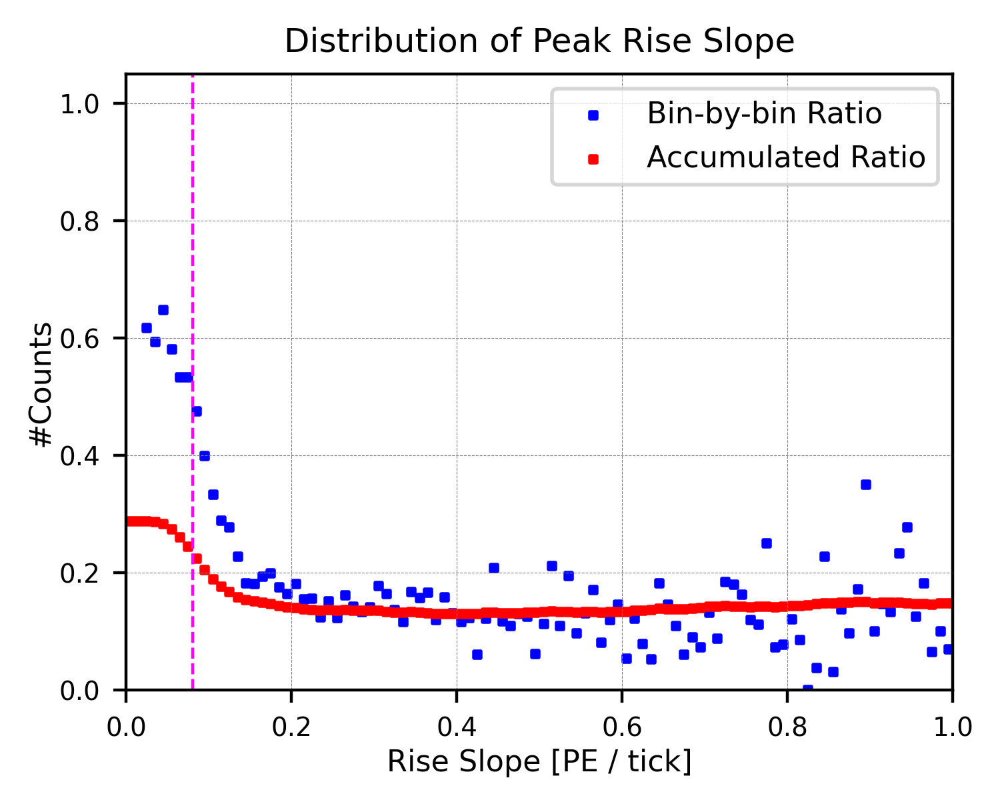

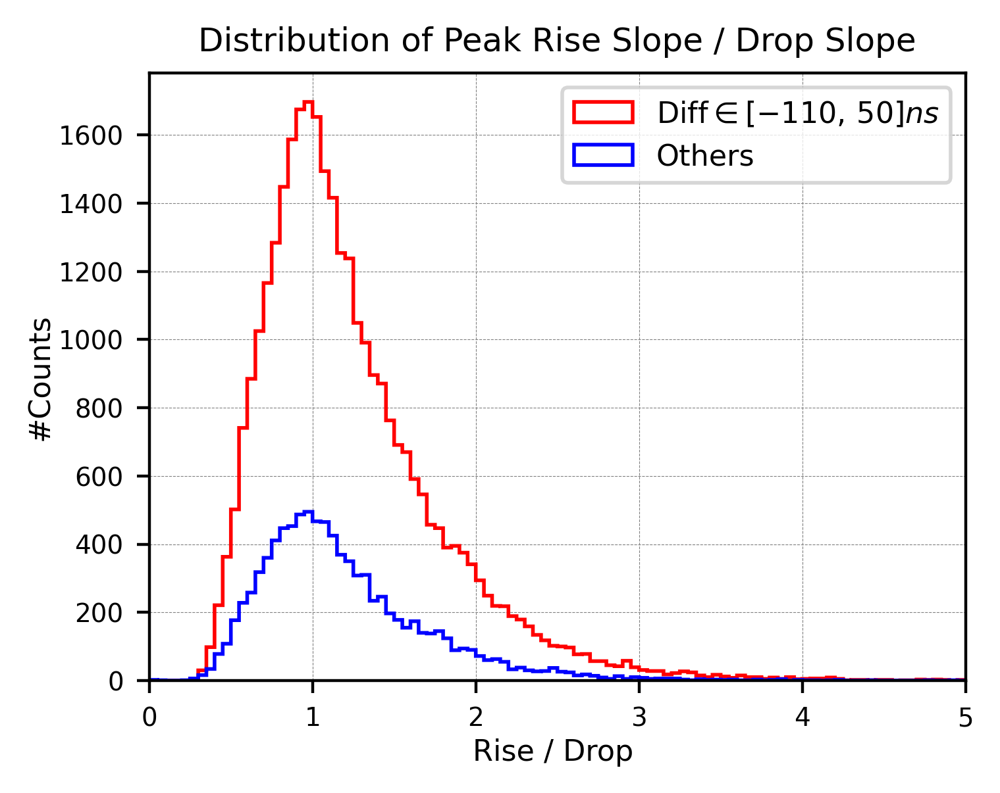

In [104]:
#Michel Peak rise & drop Cut (Cut 6)--------
print("After cut 5':---------")

n_valid = sum(1 for ev in events_total_purify5P if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify5P),
      "({:.2f}%)".format(n_valid/len(events_total_purify5P)*100))

print("\n(Diff [-110, 50]: ", len(events_diff0_purify5P), "/", len(events_total_purify5P),
       "({:.2f}%)".format(len(events_diff0_purify5P)/len(events_total_purify5P)*100))
print("(Diff Others    : ", len(events_diff500_purify5P), "/", len(events_total_purify5P),
       "({:.2f}%)".format(len(events_diff500_purify5P)/len(events_total_purify5P)*100))


rise_diff0_purity5P = [ev.michel_rise for ev in events_diff0_purify5P]
drop_diff0_purity5P = [ev.michel_drop for ev in events_diff0_purify5P]

ratios_diff0_purity5P = [
    r / d if d not in (0, None) else None
    for r, d in zip(rise_diff0_purity5P, drop_diff0_purity5P)
]

rise_diff500_purity5P = [ev.michel_rise for ev in events_diff500_purify5P]
drop_diff500_purity5P = [ev.michel_drop for ev in events_diff500_purify5P]

ratios_diff500_purity5P = [
    r / d if d not in (0, None) else None
    for r, d in zip(rise_diff500_purity5P, drop_diff500_purity5P)
]



thre_rise = 0.08 # mu Int will automatically higher than mi---


# filter the actual events
events_diff0_purify6 = [
    ev for ev in events_diff0_purify5P
    if thre_rise < ev.michel_rise
]
events_diff500_purify6 = [
    ev for ev in events_diff500_purify5P
    if thre_rise < ev.michel_rise 
]
#-------------------------------



print("\nMichel Peak Rise Drop Slope (Cut 6):--------------")

events_total_purify6 = events_diff0_purify6 + events_diff500_purify6

print("Efficiency (cut5 / cut4): ", len(events_total_purify6), "/", len(events_total_purify5P),
      "({:.2f}%)".format(len(events_total_purify6)/len(events_total_purify5P)*100))

n_valid = sum(1 for ev in events_total_purify6 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify6),
      "({:.2f}%)".format(n_valid/len(events_total_purify6)*100))

print("\n(Diff [-110, 50]: ", len(events_diff0_purify6), "/", len(events_total_purify6),
       "({:.2f}%)".format(len(events_diff0_purify6)/len(events_total_purify6)*100))
print("(Diff OTHERS    : ", len(events_diff500_purify6), "/", len(events_total_purify6),
       "({:.2f}%)".format(len(events_diff500_purify6)/len(events_total_purify6)*100))








# ==========================================================
# Michel Rise VS Michel Drop
# ==========================================================
plt.figure(figsize=(4,3), dpi=400)

# Scatter plot--------------------
# Convert to numpy arrays
x1, y1 = np.array(drop_diff500_purity5P), np.array(rise_diff500_purity5P)
x2, y2 = np.array(drop_diff0_purity5P), np.array(rise_diff0_purity5P)
# --- Density for group 1 (red, 500<Diff) ---
xy1 = np.vstack([x1, y1])
z1 = gaussian_kde(xy1)(xy1)
idx1 = z1.argsort()
x1, y1, z1 = x1[idx1], y1[idx1], z1[idx1]
# --- Density for group 2 (blue, 0<Diff<500) ---
xy2 = np.vstack([x2, y2])
z2 = gaussian_kde(xy2)(xy2)
idx2 = z2.argsort()
x2, y2, z2 = x2[idx2], y2[idx2], z2[idx2]
# --- Scatter plots with base colors red & blue ---
# Base layer (solid red/blue so single points are visible)
plt.scatter(x2, y2, s=0.8, color="red", alpha=0.5, label="_nolegend_")
plt.scatter(x1, y1, s=0.8, color="blue", alpha=0.5, label="_nolegend_")
# Density layer (adds darker shades where points overlap)
plt.scatter(x2, y2, c=z2, s=0.8, cmap="Reds", alpha=0.8, edgecolors="none", label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.scatter(x1, y1, c=z1, s=0.8, cmap="Blues", alpha=0.8, edgecolors="none", label="Others")


#---------------------------------

#plt.plot([0, 500], [0, 40], color="magenta", linewidth=0.8, linestyle='--')
#plt.plot([0, 1000], [0, 500], color="magenta", linewidth=0.8, linestyle='--')

#plt.axis('scaled')
plt.xlim(0, 1)
plt.ylim(0, 1)
plt.xlabel('Michel peak drop slope [PE / tick]', labelpad=1, fontsize=7)
plt.ylabel('Michel peak rise slope [PE / tick]', labelpad=1, fontsize=7)
plt.title('Signal Intensity Comparisons', fontsize=9)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)

# Create proxy artists (red and blue dots)
red_patch = mpatches.Patch(color="blue", label="Others")
blue_patch = mpatches.Patch(color="red", label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.legend(handles=[red_patch, blue_patch], loc="upper right", frameon=True, 
           bbox_to_anchor=(0.7, 0.99), fontsize=10, markerscale=6, ncol=1, prop={'size':8})

plt.show()





#Michel Rise Distributions===================================
plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.01
range_min = 0
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(rise_diff0_purity5P, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=1.0, label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.hist(rise_diff500_purity5P, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="Others")

plt.plot([0.08, 0.08], [0, 3000], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(0, 1.0)
plt.xlabel('Rise Slope [PE / tick]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.ylim(0.9, 3000)
#plt.xscale('log')
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Distribution of Peak Rise Slope', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show()  





# Bin-by-bin ratio & Accumulated ratio distribution================


# --- Your original binning ---
bin_width = 0.01
range_min = 0
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)
x_centers = 0.5 * (bins[:-1] + bins[1:])

hist_diff, _  = np.histogram(rise_diff0_purity5P, bins=bins)
hist_other, _ = np.histogram(rise_diff500_purity5P, bins=bins)

# Avoid division by zero
hist_diff_safe = np.where(hist_diff == 0, np.nan, hist_diff)

ratio_bin = hist_other / hist_diff_safe

# Print bin-by-bin ratios
print("=== Bin-by-bin Ratio: Others / Diff [-110, 50] ===")
for xc, r in zip(x_centers, ratio_bin):
    if np.isnan(r):
        print(f"x={xc:.3f}, Ratio=NaN (denominator=0)")
    else:
        print(f"x={xc:.3f}, Ratio={r:.4f}")

cum_diff  = np.cumsum(hist_diff[::-1])[::-1]
cum_other = np.cumsum(hist_other[::-1])[::-1]
cum_ratio = cum_other / np.where(cum_diff == 0, np.nan, cum_diff)

plt.figure(figsize=(4,3), dpi=400)

# --- Scatter points: bin-by-bin ratio (blue) ---
plt.scatter(x_centers, ratio_bin, marker='s',
            color='blue', s=3, label="Bin-by-bin Ratio")

# --- Scatter points: accumulated ratio (red) ---
plt.scatter(x_centers, cum_ratio, marker='s',
            color='red', s=3, label="Accumulated Ratio")

plt.plot([0.08, 0.08], [0, 2], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(0, 1.0)
plt.xlabel('Rise Slope [PE / tick]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.ylim(0.0, 1.05)
#plt.xscale('log')
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Distribution of Peak Rise Slope', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show() 











#Michel Rise & Drop Distributions===================================
plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.05
range_min = 0
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)

#plt.hist(drop_diff0_purity1, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
#         histtype='step', linewidth=1.0, label="Drop for Diff0")
#plt.hist(drop_diff500_purity1, bins=bins, range=(range_min, range_max), edgecolor='green', 
#         histtype='step', linewidth=1.0, label="Drop for Diff500")
plt.hist(ratios_diff0_purity5P, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=1.0, label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.hist(ratios_diff500_purity5P, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="Others")


plt.xlim(0, 5)
plt.xlabel('Rise / Drop ', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.ylim(0.9, 1000)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Distribution of Peak Rise Slope / Drop Slope', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show() 







#Apply Cut======================================




### Cut 7: 2nd 3rd peak intensity diff cut

After cut 6:---------
Purity (true / reco)    :  29067 / 31963 (90.94%)

(Diff [-110, 50]:  26119 / 31963 (81.72%)
(Diff OTHERS    :  5844 / 31963 (18.28%)

Third / Second peak intensity (Cut 7):--------------
Efficiency (cut7 / cut6):  27862 / 31963 (87.17%)
Purity (true / reco)    :  25340 / 27862 (90.95%)

(Diff [-110, 50]:  23567 / 27862 (84.58%)
(Diff OTHERS    :  4295 / 27862 (15.42%)


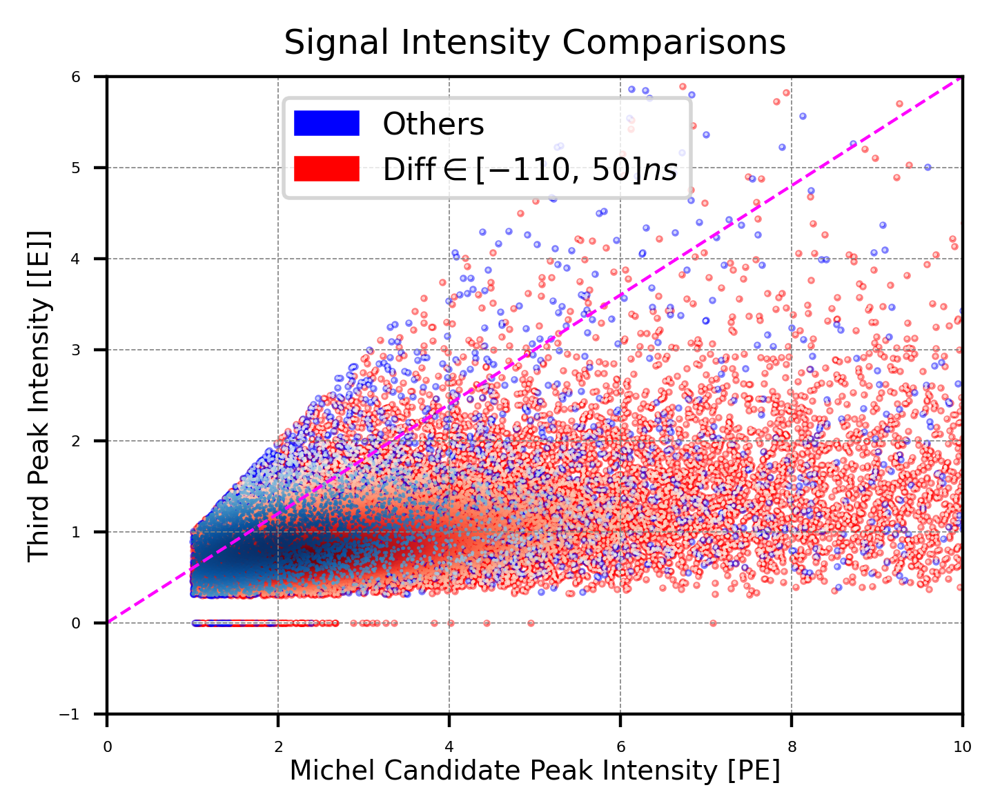

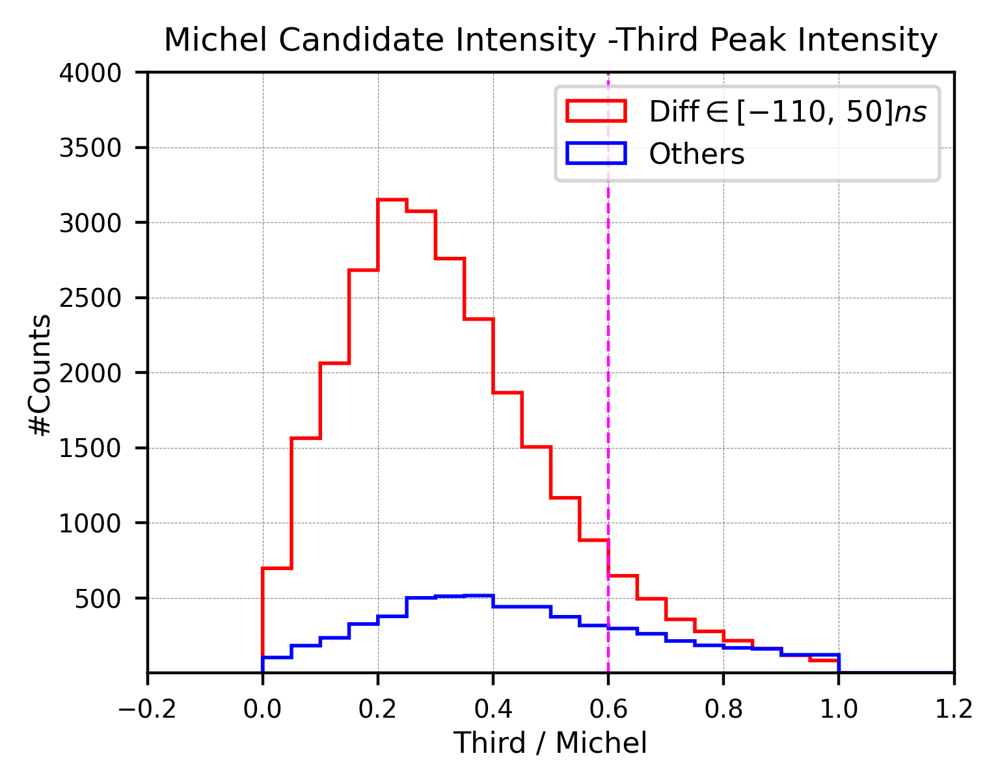

=== Bin-by-bin Ratio: Others / Diff [-110, 50] ===
x=0.025, Ratio=0.1478
x=0.075, Ratio=0.1164
x=0.125, Ratio=0.1135
x=0.175, Ratio=0.1216
x=0.225, Ratio=0.1196
x=0.275, Ratio=0.1627
x=0.325, Ratio=0.1852
x=0.375, Ratio=0.2186
x=0.425, Ratio=0.2363
x=0.475, Ratio=0.2930
x=0.525, Ratio=0.3208
x=0.575, Ratio=0.3575
x=0.625, Ratio=0.4575
x=0.675, Ratio=0.5283
x=0.725, Ratio=0.5966
x=0.775, Ratio=0.6643
x=0.825, Ratio=0.7767
x=0.875, Ratio=0.9877
x=0.925, Ratio=1.0254
x=0.975, Ratio=1.4578
x=1.025, Ratio=NaN (denominator = 0)
x=1.075, Ratio=NaN (denominator = 0)
x=1.125, Ratio=NaN (denominator = 0)
x=1.175, Ratio=NaN (denominator = 0)
x=1.225, Ratio=NaN (denominator = 0)
x=1.275, Ratio=NaN (denominator = 0)
x=1.325, Ratio=NaN (denominator = 0)
x=1.375, Ratio=NaN (denominator = 0)
x=1.425, Ratio=NaN (denominator = 0)
x=1.475, Ratio=NaN (denominator = 0)
x=1.525, Ratio=NaN (denominator = 0)
x=1.575, Ratio=NaN (denominator = 0)
x=1.625, Ratio=NaN (denominator = 0)
x=1.675, Ratio=NaN (denomina

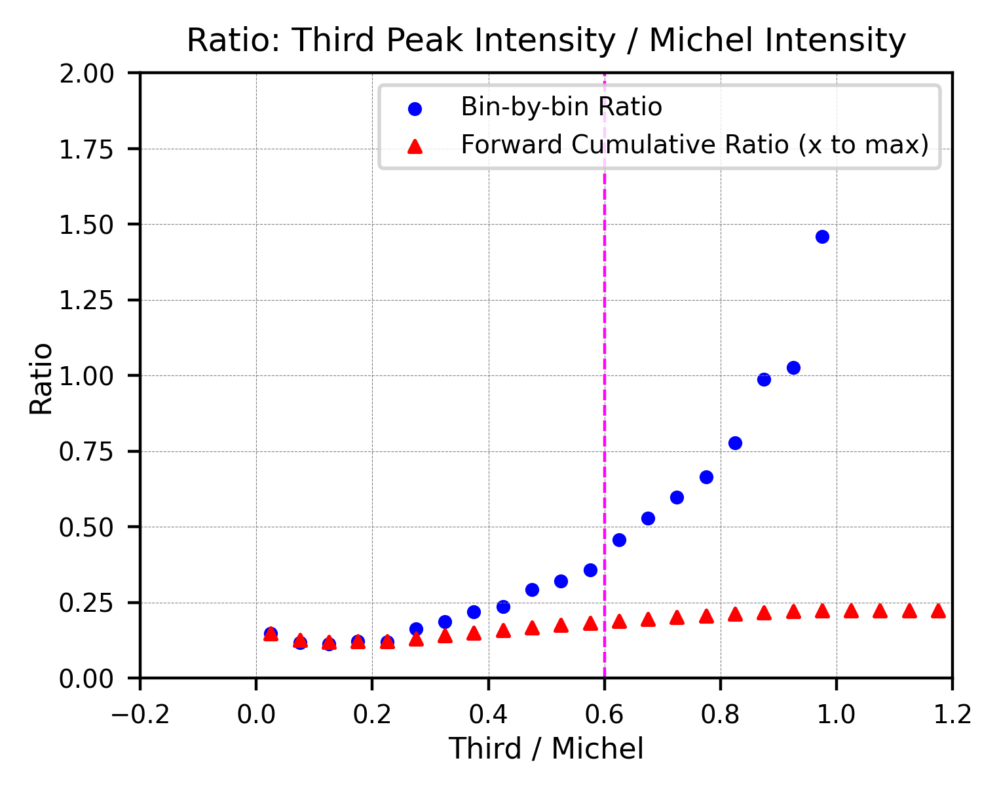

In [105]:
#Michel Peak rise & drop Cut (Cut 6)--------
print("After cut 6:---------")

n_valid = sum(1 for ev in events_total_purify6 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify6),
      "({:.2f}%)".format(n_valid/len(events_total_purify6)*100))

print("\n(Diff [-110, 50]: ", len(events_diff0_purify6), "/", len(events_total_purify6),
       "({:.2f}%)".format(len(events_diff0_purify6)/len(events_total_purify6)*100))
print("(Diff OTHERS    : ", len(events_diff500_purify6), "/", len(events_total_purify6),
       "({:.2f}%)".format(len(events_diff500_purify6)/len(events_total_purify6)*100))



miInt_diff0_purity6 = [ev.michel_intensity for ev in events_diff0_purify6]
thInt_diff0_purity6 = [ev.third_intensity for ev in events_diff0_purify6]

miInt_diff500_purity6 = [ev.michel_intensity for ev in events_diff500_purify6]
thInt_diff500_purity6 = [ev.third_intensity for ev in events_diff500_purify6]



# Element-by-element ratio (thInt / miInt)
ratio_diff0_purity6 = [th / mi for th, mi in zip(thInt_diff0_purity6, miInt_diff0_purity6)]
ratio_diff500_purity6 = [th / mi for th, mi in zip(thInt_diff500_purity6, miInt_diff500_purity6)]


thre1 = 0.0
thre2 = 0.6

# filter the actual events
events_diff0_purify7 = [
    ev for ev in events_diff0_purify6
    if ev.michel_intensity != 0 and thre1 < ev.third_intensity / ev.michel_intensity < thre2
]
events_diff500_purify7 = [
    ev for ev in events_diff500_purify6
    if ev.michel_intensity != 0 and thre1 < ev.third_intensity / ev.michel_intensity < thre2
]
#-------------------------------


print("\nThird / Second peak intensity (Cut 7):--------------")

events_total_purify7 = events_diff0_purify7 + events_diff500_purify7

print("Efficiency (cut7 / cut6): ", len(events_total_purify7), "/", len(events_total_purify6),
      "({:.2f}%)".format(len(events_total_purify7)/len(events_total_purify6)*100))

n_valid = sum(1 for ev in events_total_purify7 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify7),
      "({:.2f}%)".format(n_valid/len(events_total_purify7)*100))

print("\n(Diff [-110, 50]: ", len(events_diff0_purify7), "/", len(events_total_purify7),
       "({:.2f}%)".format(len(events_diff0_purify7)/len(events_total_purify7)*100))
print("(Diff OTHERS    : ", len(events_diff500_purify7), "/", len(events_total_purify7),
       "({:.2f}%)".format(len(events_diff500_purify7)/len(events_total_purify7)*100))








# ==========================================================
# Michel Int VS Third Int
# ==========================================================
plt.figure(figsize=(4,3), dpi=400)

# Scatter plot--------------------
# Convert to numpy arrays
x1, y1 = np.array(miInt_diff500_purity6), np.array(thInt_diff500_purity6) #(x, y)
x2, y2 = np.array(miInt_diff0_purity6), np.array(thInt_diff0_purity6)
# --- Density for group 1 (red, 500<Diff) ---
xy1 = np.vstack([x1, y1])
z1 = gaussian_kde(xy1)(xy1)
idx1 = z1.argsort()
x1, y1, z1 = x1[idx1], y1[idx1], z1[idx1]
# --- Density for group 2 (blue, 0<Diff<500) ---
xy2 = np.vstack([x2, y2])
z2 = gaussian_kde(xy2)(xy2)
idx2 = z2.argsort()
x2, y2, z2 = x2[idx2], y2[idx2], z2[idx2]
# --- Scatter plots with base colors red & blue ---
# Base layer (solid red/blue so single points are visible)
plt.scatter(x2, y2, s=0.8, color="red", alpha=0.5, label="_nolegend_")
plt.scatter(x1, y1, s=0.8, color="blue", alpha=0.5, label="_nolegend_")
# Density layer (adds darker shades where points overlap)
plt.scatter(x2, y2, c=z2, s=0.8, cmap="Reds", alpha=0.8, edgecolors="none", label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.scatter(x1, y1, c=z1, s=0.8, cmap="Blues", alpha=0.8, edgecolors="none", label="Others")
#---------------------------------

#plt.plot([0, 500], [0, 40], color="magenta", linewidth=0.8, linestyle='--')
plt.plot([0, 100], [0, 60], color="magenta", linewidth=0.8, linestyle='--')

#plt.axis('scaled')
plt.xlim(0, 10)
plt.ylim(-1, 6)
plt.xlabel('Michel Candidate Peak Intensity [PE]', labelpad=1, fontsize=7)
plt.ylabel('Third Peak Intensity [[E]]', labelpad=1, fontsize=7)
plt.title('Signal Intensity Comparisons', fontsize=9)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)

# Create proxy artists (red and blue dots)
red_patch = mpatches.Patch(color="blue", label="Others")
blue_patch = mpatches.Patch(color="red", label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.legend(handles=[red_patch, blue_patch], loc="upper right", frameon=True, 
           bbox_to_anchor=(0.7, 0.99), fontsize=10, markerscale=6, ncol=1, prop={'size':8})

plt.show()






#Third / Michel Distributions===================================
plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.05
range_min = 0
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(ratio_diff0_purity6, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=1.0, label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.hist(ratio_diff500_purity6, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="Others")

plt.plot([0.6, 0.6], [0, 4000], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(-0.2, 1.2)
plt.xlabel('Third / Michel', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.ylim(0.9, 4000)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Michel Candidate Intensity -Third Peak Intensity', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show() 






# ============================================================
# Ratio Plot for Third/Michel Distributions (scatter only)
# ============================================================


# --- Binning (same as your histogram) ---
bin_width = 0.05
range_min = 0
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)
x_centers = 0.5 * (bins[:-1] + bins[1:])


hist_diff, _  = np.histogram(ratio_diff0_purity6, bins=bins)
hist_other, _ = np.histogram(ratio_diff500_purity6, bins=bins)

hist_diff_safe = np.where(hist_diff == 0, np.nan, hist_diff)


ratio_bin = hist_other / hist_diff_safe

print("=== Bin-by-bin Ratio: Others / Diff [-110, 50] ===")
for xc, r in zip(x_centers, ratio_bin):
    if np.isnan(r):
        print(f"x={xc:.3f}, Ratio=NaN (denominator = 0)")
    else:
        print(f"x={xc:.3f}, Ratio={r:.4f}")



# forward cumulative ratio
cum_diff  = np.cumsum(hist_diff)
cum_other = np.cumsum(hist_other)
cum_ratio = cum_other / np.where(cum_diff == 0, np.nan, cum_diff)



plt.figure(figsize=(4,3), dpi=400)

# --- Scatter: bin-by-bin ratio (blue circles) ---
plt.scatter(x_centers, ratio_bin,
            color='blue', s=8, marker='o',
            label="Bin-by-bin Ratio")

# --- Scatter: accumulated ratio (red triangles) ---
plt.scatter(x_centers, cum_ratio,
            color='red', s=10, marker='^',
            label="Forward Cumulative Ratio (x to max)")

plt.plot([0.6, 0.6], [0, 4000], color="magenta", linewidth=0.8, linestyle='--')


plt.xlim(-0.2, 1.2)
plt.ylim(0, 2.0)

plt.xlabel('Third / Michel', labelpad=2, fontsize=8)
plt.ylabel('Ratio', labelpad=1, fontsize=8)

plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.tick_params(labelsize=7)
plt.title('Ratio: Third Peak Intensity / Michel Intensity', fontsize=9)

plt.legend(fontsize=7, loc="upper right")

plt.show()


### Cut 8: Third second peak intensity ratio cut


After Cut 7:--------------
Purity (true / reco)    :  25340 / 27862 (90.95%)

(Diff [-110, 50]:  23567 / 27862 (84.58%)
(Diff OTHERS    :  4295 / 27862 (15.42%)

Michel 3rd Peaks intensity Diff (Cut 8):--------------
Efficiency (cut8 / cut7):  26606 / 27862 (95.49%)
Purity (true / reco)    :  24213 / 26606 (91.01%)

(Diff [-110, 50]:  22729 / 26606 (85.43%)
(Diff OTHERS    :  3877 / 26606 (14.57%)


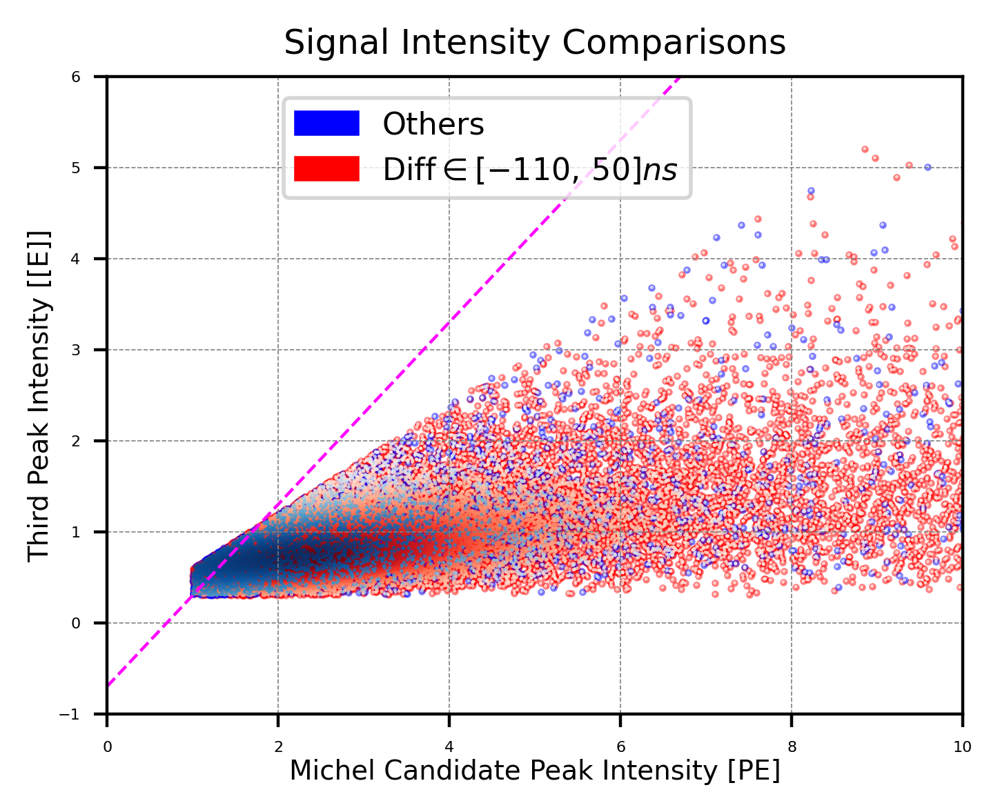

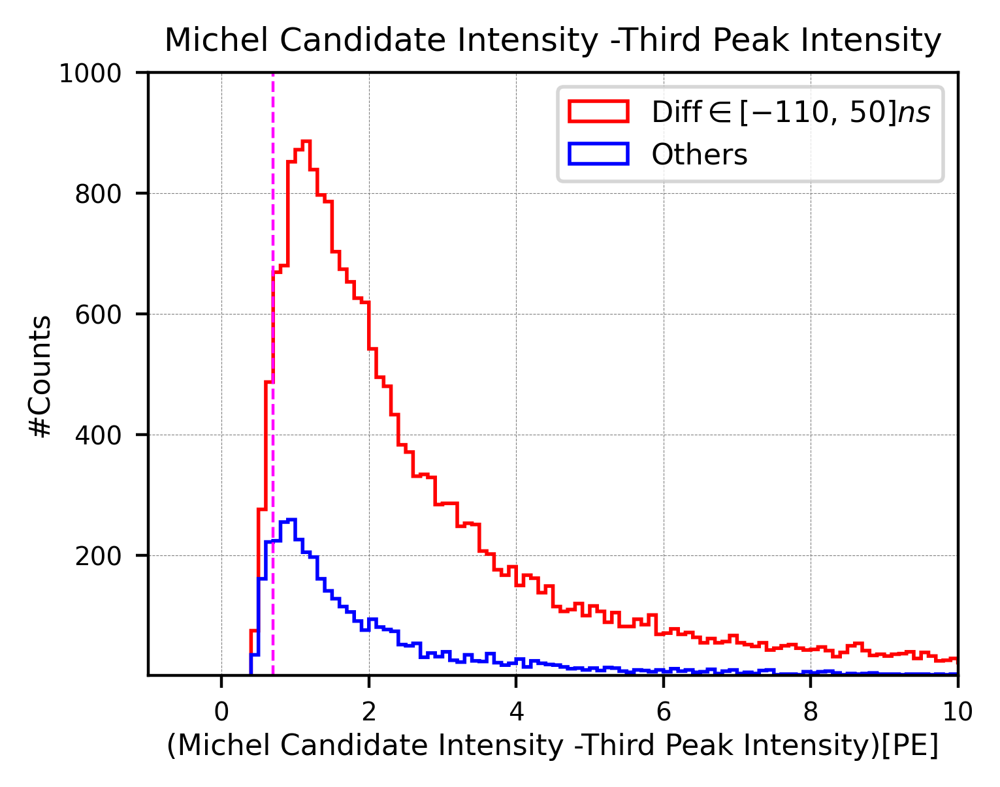

In [106]:
print("\nAfter Cut 7:--------------")

n_valid = sum(1 for ev in events_total_purify7 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify7),
      "({:.2f}%)".format(n_valid/len(events_total_purify7)*100))

print("\n(Diff [-110, 50]: ", len(events_diff0_purify7), "/", len(events_total_purify7),
       "({:.2f}%)".format(len(events_diff0_purify7)/len(events_total_purify7)*100))
print("(Diff OTHERS    : ", len(events_diff500_purify7), "/", len(events_total_purify7),
       "({:.2f}%)".format(len(events_diff500_purify7)/len(events_total_purify7)*100))


miInt_diff0_purity7 = [ev.michel_intensity for ev in events_diff0_purify7]
thInt_diff0_purity7 = [ev.third_intensity for ev in events_diff0_purify7]

miInt_diff500_purity7 = [ev.michel_intensity for ev in events_diff500_purify7]
thInt_diff500_purity7 = [ev.third_intensity for ev in events_diff500_purify7]

# Element-by-element difference (thInt - miInt)
subtract_diff0_purity7 = [mi - th for th, mi in zip(thInt_diff0_purity7, miInt_diff0_purity7)]
subtract_diff500_purity7 = [mi - th for th, mi in zip(thInt_diff500_purity7, miInt_diff500_purity7)]


thre_diff = 0.7

# filter the actual events
events_diff0_purify8 = [
    ev for ev in events_diff0_purify7
    if thre_diff <  (ev.michel_intensity - ev.third_intensity)
]
events_diff500_purify8 = [
    ev for ev in events_diff500_purify7
    if thre_diff <  (ev.michel_intensity - ev.third_intensity)
]
#-------------------------------


print("\nMichel 3rd Peaks intensity Diff (Cut 8):--------------")

events_total_purify8 = events_diff0_purify8 + events_diff500_purify8

print("Efficiency (cut8 / cut7): ", len(events_total_purify8), "/", len(events_total_purify7),
      "({:.2f}%)".format(len(events_total_purify8)/len(events_total_purify7)*100))

n_valid = sum(1 for ev in events_total_purify8 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify8),
      "({:.2f}%)".format(n_valid/len(events_total_purify8)*100))

print("\n(Diff [-110, 50]: ", len(events_diff0_purify8), "/", len(events_total_purify8),
       "({:.2f}%)".format(len(events_diff0_purify8)/len(events_total_purify8)*100))
print("(Diff OTHERS    : ", len(events_diff500_purify8), "/", len(events_total_purify8),
       "({:.2f}%)".format(len(events_diff500_purify8)/len(events_total_purify8)*100))










# ==========================================================
# Michel Int VS Third Int
# ==========================================================
plt.figure(figsize=(4,3), dpi=400)

# Scatter plot--------------------
# Convert to numpy arrays
x1, y1 = np.array(miInt_diff500_purity7), np.array(thInt_diff500_purity7) #(x, y)
x2, y2 = np.array(miInt_diff0_purity7), np.array(thInt_diff0_purity7)
# --- Density for group 1 (red, 500<Diff) ---
xy1 = np.vstack([x1, y1])
z1 = gaussian_kde(xy1)(xy1)
idx1 = z1.argsort()
x1, y1, z1 = x1[idx1], y1[idx1], z1[idx1]
# --- Density for group 2 (blue, 0<Diff<500) ---
xy2 = np.vstack([x2, y2])
z2 = gaussian_kde(xy2)(xy2)
idx2 = z2.argsort()
x2, y2, z2 = x2[idx2], y2[idx2], z2[idx2]
# --- Scatter plots with base colors red & blue ---
# Base layer (solid red/blue so single points are visible)
plt.scatter(x2, y2, s=0.8, color="red", alpha=0.5, label="_nolegend_")
plt.scatter(x1, y1, s=0.8, color="blue", alpha=0.5, label="_nolegend_")
# Density layer (adds darker shades where points overlap)
plt.scatter(x2, y2, c=z2, s=0.8, cmap="Reds", alpha=0.8, edgecolors="none", label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.scatter(x1, y1, c=z1, s=0.8, cmap="Blues", alpha=0.8, edgecolors="none", label="Others")
#---------------------------------

plt.plot([0, 10], [-0.7, 9.3], color="magenta", linewidth=0.8, linestyle='--')

#plt.axis('scaled')
plt.xlim(0, 10)
plt.ylim(-1, 6)
plt.xlabel('Michel Candidate Peak Intensity [PE]', labelpad=1, fontsize=7)
plt.ylabel('Third Peak Intensity [[E]]', labelpad=1, fontsize=7)
plt.title('Signal Intensity Comparisons', fontsize=9)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)

# Create proxy artists (red and blue dots)
red_patch = mpatches.Patch(color="blue", label="Others")
blue_patch = mpatches.Patch(color="red", label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.legend(handles=[red_patch, blue_patch], loc="upper right", frameon=True, 
           bbox_to_anchor=(0.7, 0.99), fontsize=10, markerscale=6, ncol=1, prop={'size':8})

plt.show()









#(Michel Candidate Intensity -Third Peak Intensity) Distributions====================
plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.1
range_min = 0
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(subtract_diff0_purity7, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=1.0, label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.hist(subtract_diff500_purity7, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="Others")

plt.plot([0.7, 0.7], [0, 1000], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(-1, 10)
plt.xlabel('(Michel Candidate Intensity -Third Peak Intensity)[PE]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.ylim(0.9, 1000)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Michel Candidate Intensity -Third Peak Intensity', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show()  

### Cut 9: Space Cut along drift direction


After Cut 8:--------------
Purity (true / reco)    :  24213 / 26606 (91.01%)

(Diff [-110, 50]:  22729 / 26606 (85.43%)
(Diff OTHERS    :  3877 / 26606 (14.57%)

Drift Direction Cut (Cut 9):--------------
Efficiency (cut9 / cut8):  25041 / 26606 (94.12%)
Purity (true / reco)    :  22892 / 25041 (91.42%)

(Diff [-110, 50]:  21734 / 25041 (86.79%)
(Diff OTHERS    :  3307 / 25041 (13.21%)

Decay points distribution: 


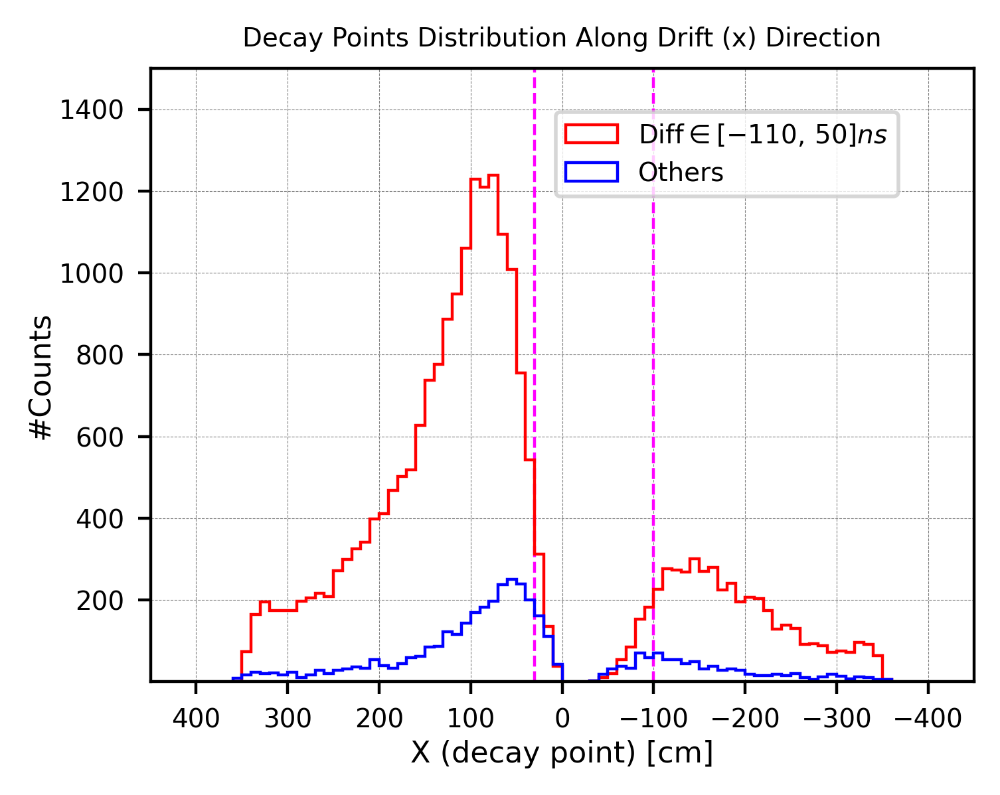

In [107]:
print("\nAfter Cut 8:--------------")

n_valid = sum(1 for ev in events_total_purify8 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify8),
      "({:.2f}%)".format(n_valid/len(events_total_purify8)*100))

print("\n(Diff [-110, 50]: ", len(events_diff0_purify8), "/", len(events_total_purify8),
       "({:.2f}%)".format(len(events_diff0_purify8)/len(events_total_purify8)*100))
print("(Diff OTHERS    : ", len(events_diff500_purify8), "/", len(events_total_purify8),
       "({:.2f}%)".format(len(events_diff500_purify8)/len(events_total_purify8)*100))





posX_cut = 30
negX_cut = -100

# filter the actual events
events_diff0_purify9 = [
    ev for ev in events_diff0_purify8
    if posX_cut < ev.posX  or  ev.posX < negX_cut
]
events_diff500_purify9 = [
    ev for ev in events_diff500_purify8
    if posX_cut < ev.posX  or  ev.posX < negX_cut
]
#-------------------------------


print("\nDrift Direction Cut (Cut 9):--------------")

events_total_purify9 = events_diff0_purify9 + events_diff500_purify9

print("Efficiency (cut9 / cut8): ", len(events_total_purify9), "/", len(events_total_purify8),
      "({:.2f}%)".format(len(events_total_purify9)/len(events_total_purify8)*100))

n_valid = sum(1 for ev in events_total_purify9 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify9),
      "({:.2f}%)".format(n_valid/len(events_total_purify9)*100))

print("\n(Diff [-110, 50]: ", len(events_diff0_purify9), "/", len(events_total_purify9),
       "({:.2f}%)".format(len(events_diff0_purify9)/len(events_total_purify9)*100))
print("(Diff OTHERS    : ", len(events_diff500_purify9), "/", len(events_total_purify9),
       "({:.2f}%)".format(len(events_diff500_purify9)/len(events_total_purify9)*100))









posX_diff500_purify8 = [ev.posX for ev in events_diff500_purify8]

posX_diff0_purify8 = [ev.posX for ev in events_diff0_purify8]

posX_total_purify8 = posX_diff500_purify8 + posX_diff0_purify8


#Decay points distribution:==========================================
print("\nDecay points distribution: ")

# Plotting the histogram (X distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#APA planes---
#plt.plot([-360, -360], [0, 3000], color="blue", linewidth=0.8, linestyle='--')
#plt.plot([360, 360], [0, 3000], color="blue", linewidth=0.8, linestyle='--')

#Cut line------
plt.plot([30, 30], [0, 3000], color="magenta", linewidth=0.8, linestyle='--')
plt.plot([-100, -100], [0, 3000], color="magenta", linewidth=0.8, linestyle='--')

#Define the range and bin width
bin_width = 10
range_min = -400
range_max = 400
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(posX_diff0_purify8, bins=bins, range=(range_min, range_max), edgecolor='red', 
          histtype='step', linewidth=0.8, label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.hist(posX_diff500_purify8, bins=bins, range=(range_min, range_max), edgecolor='blue', 
          histtype='step', linewidth=0.8, label="Others")
#plt.hist(posX_total_purify8, bins=bins, range=(range_min, range_max), edgecolor='orange', 
#          histtype='step', linewidth=0.8, label="Total")
#--------------------------------

plt.xlim(-450, 450)
plt.xlabel('X (decay point) [cm]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.gca().invert_xaxis()  # Flip x-axis
plt.ylim(0.9, 1500)
#plt.yscale('log')
plt.title('Decay Points Distribution Along Drift (x) Direction', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.7, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show()  





Decay points distribution: 


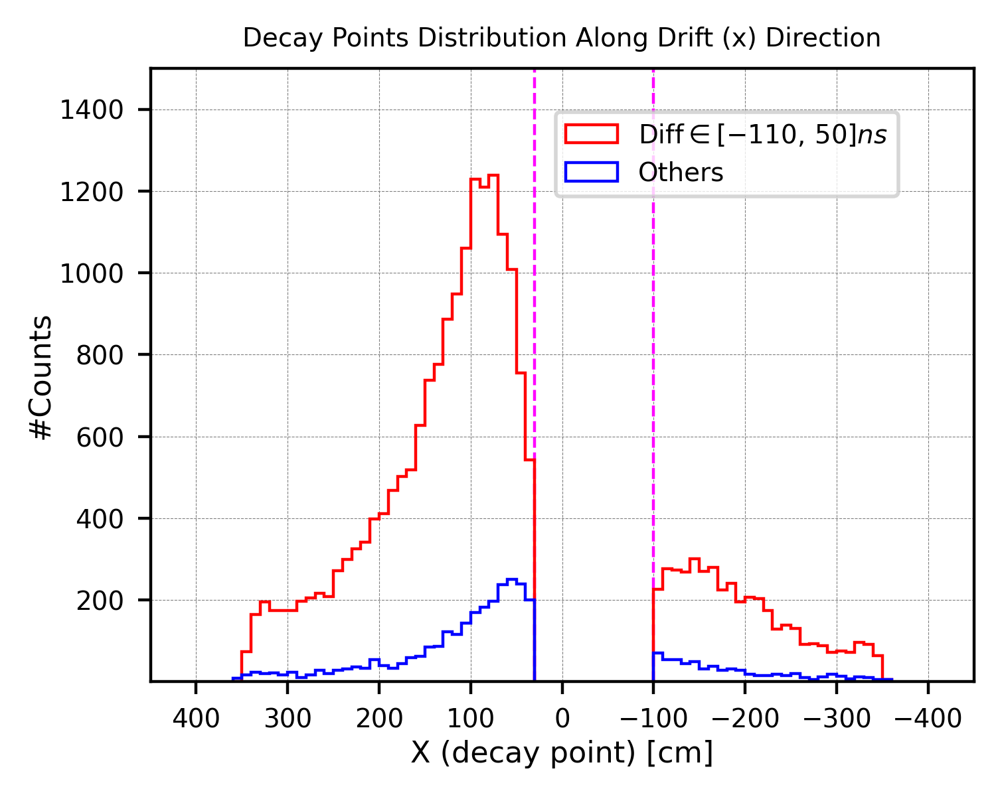

In [108]:
posX_diff500_purify9 = [ev.posX for ev in events_diff500_purify9]

posX_diff0_purify9 = [ev.posX for ev in events_diff0_purify9]



#Decay points distribution:==========================================
print("\nDecay points distribution: ")

# Plotting the histogram (X distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#APA planes---
#plt.plot([-360, -360], [0, 3000], color="blue", linewidth=0.8, linestyle='--')
#plt.plot([360, 360], [0, 3000], color="blue", linewidth=0.8, linestyle='--')

#Cut line------
plt.plot([30, 30], [0, 3000], color="magenta", linewidth=0.8, linestyle='--')
plt.plot([-100, -100], [0, 3000], color="magenta", linewidth=0.8, linestyle='--')

#Define the range and bin width
bin_width = 10
range_min = -400
range_max = 400
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(posX_diff0_purify9, bins=bins, range=(range_min, range_max), edgecolor='red', 
          histtype='step', linewidth=0.8, label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.hist(posX_diff500_purify9, bins=bins, range=(range_min, range_max), edgecolor='blue', 
          histtype='step', linewidth=0.8, label="Others")
#--------------------------------

plt.xlim(-450, 450)
plt.xlabel('X (decay point) [cm]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.gca().invert_xaxis()  # Flip x-axis
plt.ylim(0.9, 1500)
#plt.yscale('log')
plt.title('Decay Points Distribution Along Drift (x) Direction', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.7, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show()  

<br />

### Explore Validaty of -110<Diff<50 [ns] standard: 

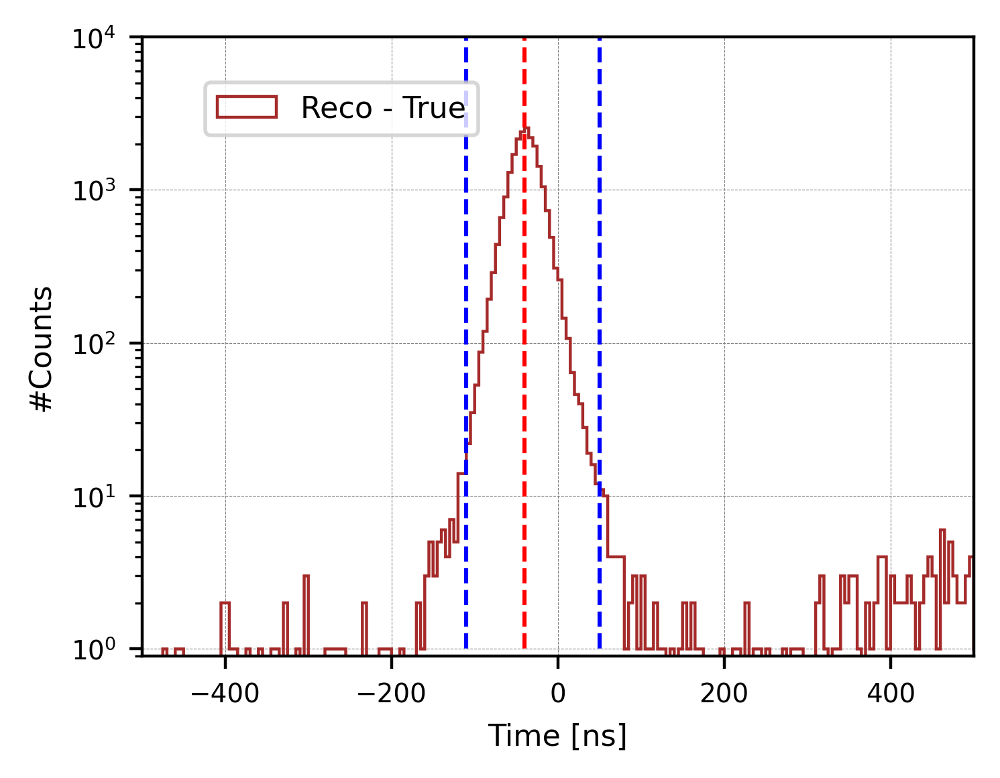

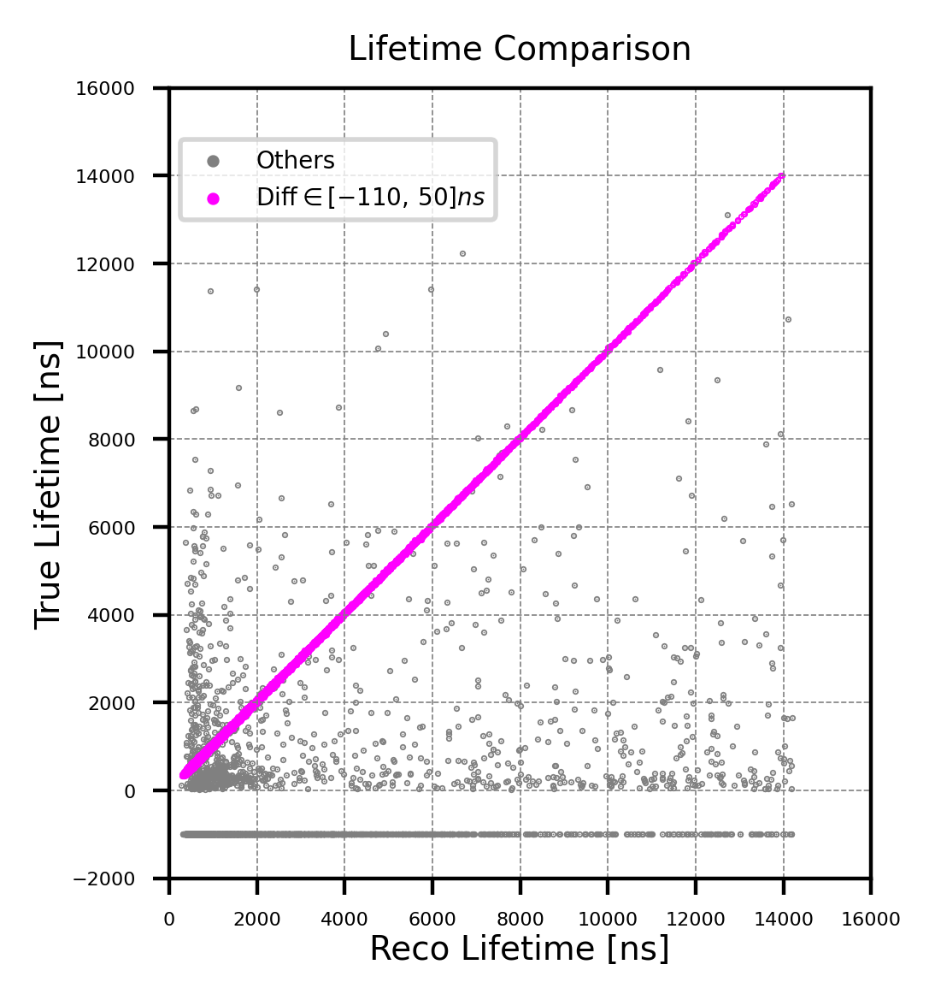

In [109]:
#The final dataset: events_diff500_purify9

diffTime_diff500_purify9 = [ev.diff_lifetime for ev in events_diff500_purify9]
trueTime_diff500_purify9 = [ev.true_lifetime for ev in events_diff500_purify9]
recoTime_diff500_purify9 = [ev.reco_lifetime for ev in events_diff500_purify9]

#Group of diff<500
diffTime_diff0_purify9 = [ev.diff_lifetime for ev in events_diff0_purify9]
trueTime_diff0_purify9 = [ev.true_lifetime for ev in events_diff0_purify9]
recoTime_diff0_purify9 = [ev.reco_lifetime for ev in events_diff0_purify9]

events_total_purify9 = events_diff0_purify9 + events_diff500_purify9
diffTime_total_purify9 = diffTime_diff500_purify9 + diffTime_diff0_purify9

#------------------------------------------
plt.figure(figsize=(4, 3), dpi=400)

# Define histogram parameters
bin_width = 5
range_min = -16000
range_max = 16000
bins = np.arange(range_min, range_max + bin_width, bin_width)

# Plot histogram-----------------
plt.hist(diffTime_total_purify9, bins=bins, range=(range_min, range_max),
         edgecolor='brown', histtype='step', linewidth=0.8,
         label='Reco - True')

plt.plot([-40, -40], [0, 30000], color="red", linewidth=1.1, linestyle='--')
plt.plot([-110, -110], [0, 30000], color="blue", linewidth=1.1, linestyle='--')
plt.plot([50, 50], [0, 30000], color="blue", linewidth=1.1, linestyle='--')

plt.xlim(-500, 500)
plt.ylim(0.9, 10000)
plt.yscale('log')
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('#Counts', fontsize=8)
#plt.title('Purified (mu time [55, 65]) Lifetime')
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.24, 0.95), fontsize=11, markerscale=5, ncol=1, prop={'size':8})
plt.show()







# ==========================================================
# TrueLife VS RecoLife
# ==========================================================
plt.figure(figsize=(4,3), dpi=400)

# Scatter plot----------
plt.scatter(recoTime_diff500_purify9, trueTime_diff500_purify9, s=0.1, c='grey', alpha=1.0, label="Others")
plt.scatter(recoTime_diff0_purify9, trueTime_diff0_purify9, s=0.1, c='magenta', alpha=1.0, label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
#-----------------------

plt.axis('scaled')
plt.xlim(0, 16000)
plt.ylim(-2000, 16000)
plt.ylabel('True Lifetime [ns]', labelpad=1, fontsize=7)
plt.xlabel('Reco Lifetime [ns]', labelpad=1, fontsize=7)
plt.title('Lifetime Comparison', fontsize=7)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.24, 0.95), fontsize=6, markerscale=5, ncol=1, prop={'size':5})
plt.show()





<br />

#### Single Event Inspection:

In [110]:
# "Signal"
for ev in events_diff0_purify9:
    if ev.diff_lifetime < -96:
        print(ev)

print("\n--------------------")
for i, ev in enumerate(events_diff0_purify9[:100]):
    print(f"Event {i}: {ev}")



# "Background"
print("\n\n=======================================")
for i, ev in enumerate(events_diff500_purify9[:100]):
    print(f"Event {i}: {ev}")



PdsEventNew(muon_time=126, michel_time=163, muon_intensity=10.5114, michel_intensity=2.90762, third_intensity=1.09945, posX=48.8941, posY=153.194, posZ=170.032, energy=49.3001, lifetime=0.688112, pdg=11, eventID=20284, trackID=4, date=20251011, michel_score=0.273017, michel_hits=24, reco_lifetime=592, true_lifetime=688.112, diff_lifetime=-96.11199999999997, michel_rise=0.15303263157894736, michel_drop=0.0787171052631579)
PdsEventNew(muon_time=126, michel_time=172, muon_intensity=6.27304, michel_intensity=1.31821, third_intensity=0.546809, posX=33.4223, posY=285.102, posZ=323.089, energy=52.1861, lifetime=0.841534, pdg=-11, eventID=22168, trackID=21, date=20251011, michel_score=0.63652, michel_hits=3, reco_lifetime=736, true_lifetime=841.534, diff_lifetime=-105.53399999999999, michel_rise=0.09023882352941176, michel_drop=0.08788066666666668)
PdsEventNew(muon_time=124, michel_time=171, muon_intensity=6.14263, michel_intensity=1.74031, third_intensity=0.396645, posX=30.2294, posY=69.9344,

<br />
<br />

#### Features of FINAL dataset (after purification 9):

In [111]:
events_total_purify9 = events_diff500_purify9 + events_diff0_purify9

events_pM_purify9 = []#e^+---
events_nM_purify9 = []

for i in range(0, len(events_total_purify9)):
    pdg = events_total_purify9[i].pdg

    if pdg < 0:
        events_pM_purify9.append(events_total_purify9[i])

    elif pdg > 0:
        events_nM_purify9.append(events_total_purify9[i])



print("\nMichel e^+: ", len(events_pM_purify9), "/", len(events_total_purify9), 
      "({:.2f}%)".format(len(events_pM_purify9)/len(events_total_purify9)*100))
print("Michel e^-: ", len(events_nM_purify9), "/", len(events_total_purify9), 
      "({:.2f}%)".format(len(events_nM_purify9)/len(events_total_purify9)*100))

print("\n#e^+ / #e^-: ", len(events_pM_purify9), "/", len(events_nM_purify9), 
      "({:.2f})".format(len(events_pM_purify9)/len(events_nM_purify9)))


Michel e^+:  20152 / 25041 (80.48%)
Michel e^-:  2740 / 25041 (10.94%)

#e^+ / #e^-:  20152 / 2740 (7.35)



Decay points distribution: 


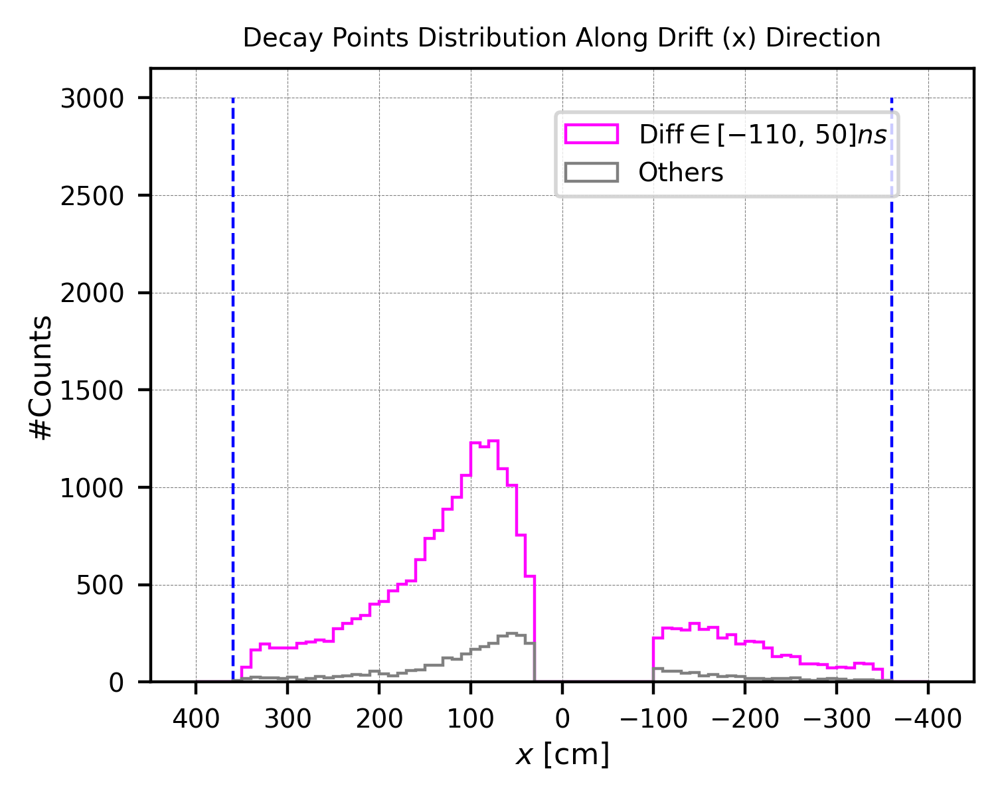

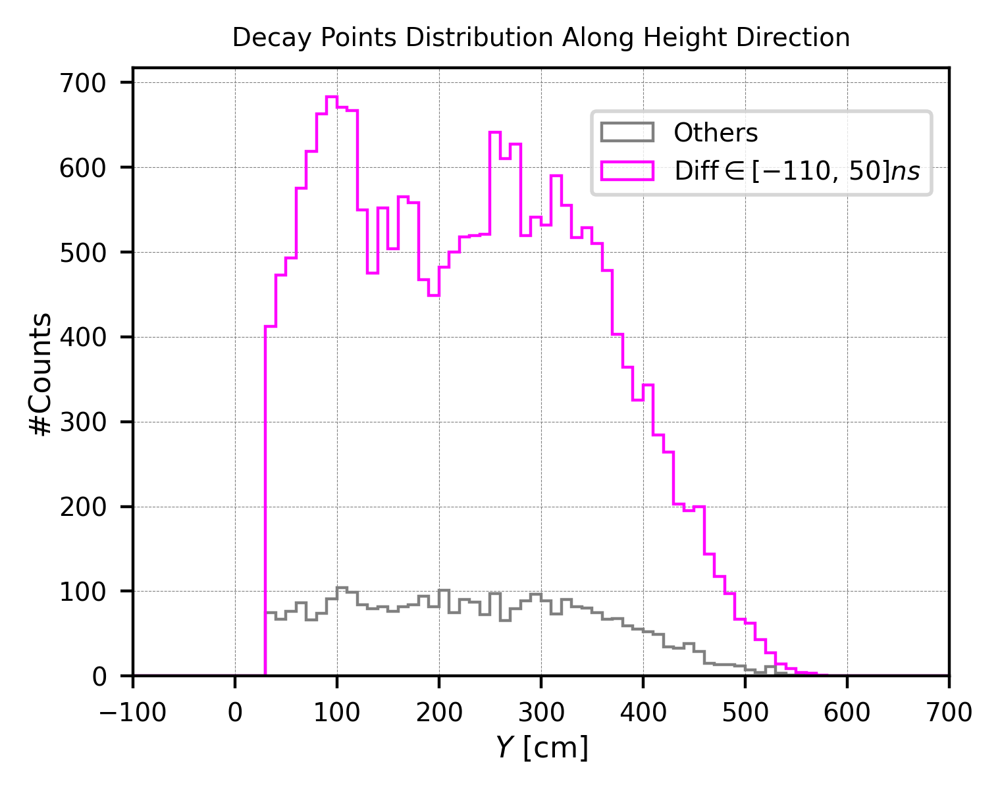

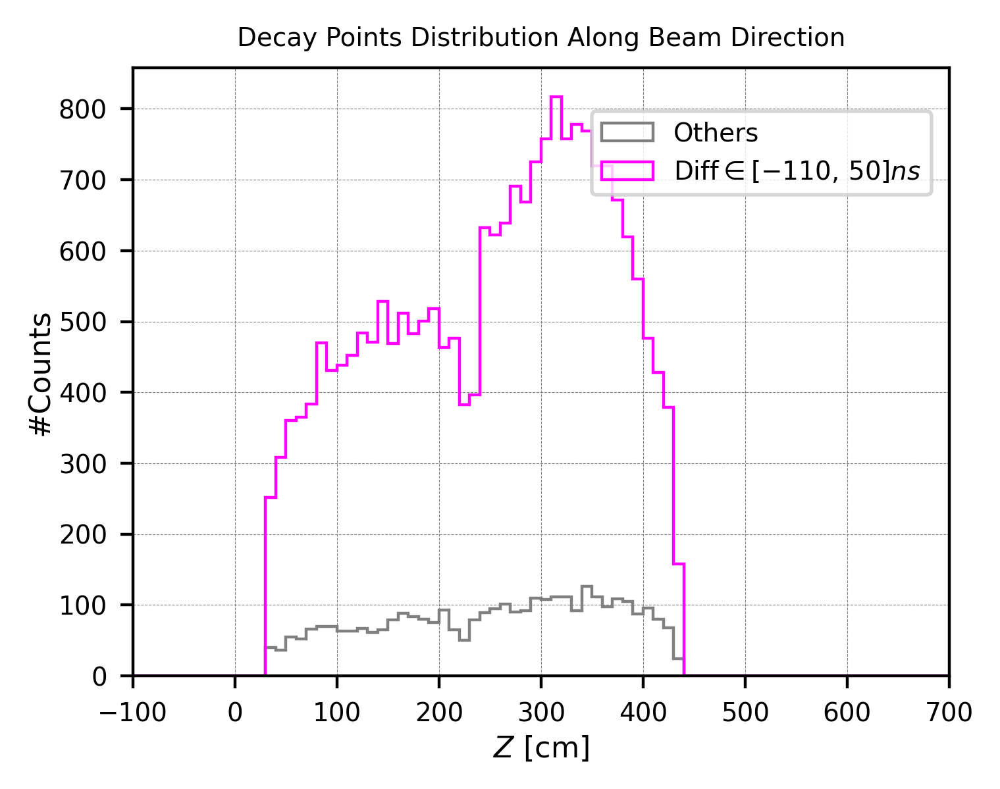

In [112]:

posX_diff500_purify9 = [ev.posX for ev in events_diff500_purify9]
posY_diff500_purify9 = [ev.posY for ev in events_diff500_purify9]
posZ_diff500_purify9 = [ev.posZ for ev in events_diff500_purify9]

posX_diff0_purify9 = [ev.posX for ev in events_diff0_purify9]
posY_diff0_purify9 = [ev.posY for ev in events_diff0_purify9]
posZ_diff0_purify9 = [ev.posZ for ev in events_diff0_purify9]



#Decay points distribution:==========================================
print("\nDecay points distribution: ")

# Plotting the histogram (X distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#APA planes---
plt.plot([-360, -360], [0, 3000], color="blue", linewidth=0.8, linestyle='--')
plt.plot([360, 360], [0, 3000], color="blue", linewidth=0.8, linestyle='--')

#Define the range and bin width
bin_width = 10
range_min = -400
range_max = 400
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(posX_diff0_purify9, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
          histtype='step', linewidth=0.8, label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.hist(posX_diff500_purify9, bins=bins, range=(range_min, range_max), edgecolor='grey', 
          histtype='step', linewidth=0.8, label="Others")
#--------------------------------

plt.xlim(-450, 450)
plt.xlabel(r'$x$ [cm]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.gca().invert_xaxis()  # Flip x-axis
#plt.ylim(0.9, 500)
#plt.yscale('log')
plt.title('Decay Points Distribution Along Drift (x) Direction', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.7, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show()  




# Plotting the histogram (Y distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#Define the range and bin width
bin_width = 10
range_min = -1000
range_max = 1000
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(posY_diff500_purify9, bins=bins, range=(range_min, range_max), edgecolor='grey', 
          histtype='step', linewidth=0.8, label="Others")
plt.hist(posY_diff0_purify9, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
          histtype='step', linewidth=0.8, label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
#--------------------------------

plt.xlim(-100, 700)
plt.xlabel(r'$Y$ [cm]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.gca().invert_xaxis()  # Flip x-axis
#plt.ylim(0.1, 300)
#plt.yscale('log')
plt.title('Decay Points Distribution Along Height Direction', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.77, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show()  




# Plotting the histogram (Z distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#Define the range and bin width
bin_width = 10
range_min = -1000
range_max = 1000
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(posZ_diff500_purify9, bins=bins, range=(range_min, range_max), edgecolor='grey', 
          histtype='step', linewidth=0.8, label="Others")
plt.hist(posZ_diff0_purify9, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
          histtype='step', linewidth=0.8, label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
#--------------------------------

plt.xlim(-100, 700)
plt.xlabel(r'$Z$ [cm]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.gca().invert_xaxis()  # Flip x-axis
#plt.ylim(0.1, 300)
#plt.yscale('log')
plt.title('Decay Points Distribution Along Beam Direction', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.77, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show() 











# Set the limits of x, y and z when drawing---
xmin = -450
xmax = 450
ymin = -100
ymax = 700
zmin = -100
zmax = 600

# Field cage range---
cageMinX = -356
cageMaxX = 356
cageMinY = 0
cageMaxY = 610
cageMinZ = 0
cageMaxZ = 465


# ==========================================================
# Y–X plane plotting (Front View)
# ==========================================================
# plt.figure(figsize=(4,3), dpi=400)

# # Auxiliary line for field cage
# aux2 = [0, 610, 610, 0, 0]
# aux1 = [356, 356, -356, -356, 356]
# plt.plot(aux1, aux2, color="blue", linewidth=0.8, linestyle='-')

# # Scatter plot----------
# # plt.scatter(posX_true500, posY_true500, s=1, c='red', alpha=1.0, label="500<True")
# # plt.scatter(posX_true0, posY_true0, s=1, c='blue', alpha=1.0, label="0<True<500")
# # plt.scatter(posX_false, posY_false, s=1, c='black', alpha=1.0, label="True<0 (False)")

# plt.scatter(posX_diff500, posY_diff500, s=1, c='grey', alpha=1.0, label="500<Diff")
# plt.scatter(posX_diff0, posY_diff0, s=1, c='magenta', alpha=1.0, label="0<Diff<500")
# #-----------------------

# plt.axis('scaled')
# plt.xlim(xmin, xmax)
# plt.ylim(-50, 660)
# plt.gca().invert_xaxis()  # Flip x-axis
# plt.xlabel('X axis [cm]', labelpad=1, fontsize=5)
# plt.ylabel('Y axis [cm]', labelpad=1, fontsize=5)
# plt.title('Front View', fontsize=7)
# plt.tick_params(labelsize=4)
# plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
# plt.legend(fontsize=5, loc="upper right")
# plt.show()


# ==========================================================
# Z–X plane plotting (Top View)
# ==========================================================
# plt.figure(figsize=(4,3), dpi=400)

# # Auxiliary line
# aux1 = [0, 465, 465, 0, 0]
# aux2 = [356, 356, -356, -356, 356]
# plt.plot(aux1, aux2, color="blue", linewidth=0.8, linestyle='-')

# # Scatter plot----------
# # plt.scatter(posZ_true500, posX_true500, s=1, c='red', alpha=1.0, label="500<True")
# # plt.scatter(posZ_true0, posX_true0, s=1, c='blue', alpha=1.0, label="0<True<500")
# # plt.scatter(posZ_false, posX_false, s=1, c='black', alpha=1.0, label="True<0 (False)")

# plt.scatter(posZ_diff500, posX_diff500, s=1, c='grey', alpha=1.0, label="500<Diff")
# plt.scatter(posZ_diff0, posX_diff0, s=1, c='magenta', alpha=1.0, label="0<Diff<500")
# #-----------------------

# plt.axis('scaled')
# plt.ylim(xmin, xmax)
# plt.xlim(-50, 515)
# plt.ylabel('X axis [cm]', labelpad=1, fontsize=5)
# plt.xlabel('Z axis [cm]', labelpad=1, fontsize=5)
# plt.title('Top View', fontsize=7)
# plt.tick_params(labelsize=4)
# plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
# plt.legend(fontsize=5, loc="upper right")
# plt.show()




# ==========================================================
# Y–Z plane plotting (Side View)
# ==========================================================
# plt.figure(figsize=(4,3), dpi=400)

# # Auxiliary line
# aux2 = [cageMinY, cageMaxY, cageMaxY, cageMinY, cageMinY]
# aux1 = [cageMinZ, cageMinZ, cageMaxZ, cageMaxZ, cageMinZ]
# plt.plot(aux1, aux2, color="blue", linewidth=0.8, linestyle='-')

# # Scatter plot----------
# # plt.scatter(posZ_true500, posY_true500, s=1, c='red', alpha=1.0, label="500<True")
# # plt.scatter(posZ_true0, posY_true0, s=1, c='blue', alpha=1.0, label="0<True<500")
# # plt.scatter(posZ_false, posY_false, s=1, c='black', alpha=1.0, label="True<0 (False)")

# plt.scatter(posZ_diff500, posY_diff500, s=1, c='grey', alpha=1.0, label="500<Diff")
# plt.scatter(posZ_diff0, posY_diff0, s=1, c='magenta', alpha=1.0, label="0<Diff<500")
# #-----------------------

# plt.axis('scaled')
# plt.xlim(-50, 515)
# plt.ylim(-50, 660)
# plt.xlabel('Z axis [cm]', labelpad=1, fontsize=5)
# plt.ylabel('Y axis [cm]', labelpad=1, fontsize=5)
# plt.title('Side View', fontsize=7)
# plt.tick_params(labelsize=4)
# plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
# plt.legend(fontsize=5, loc="upper right")
# plt.show()



Energy Distribution: 


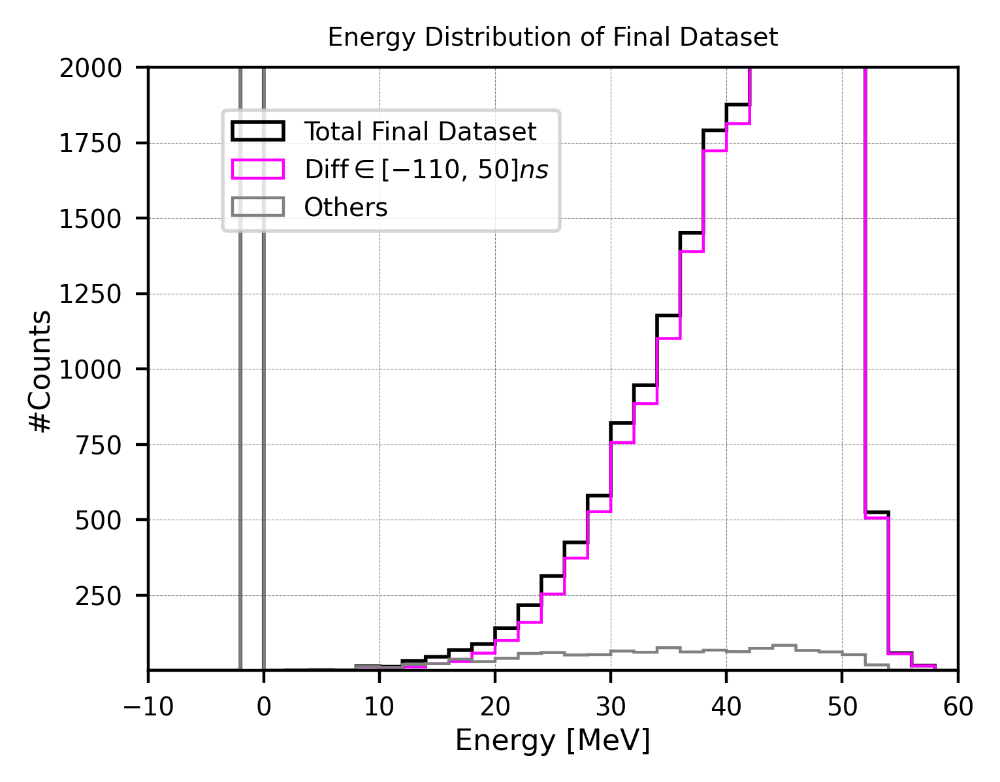

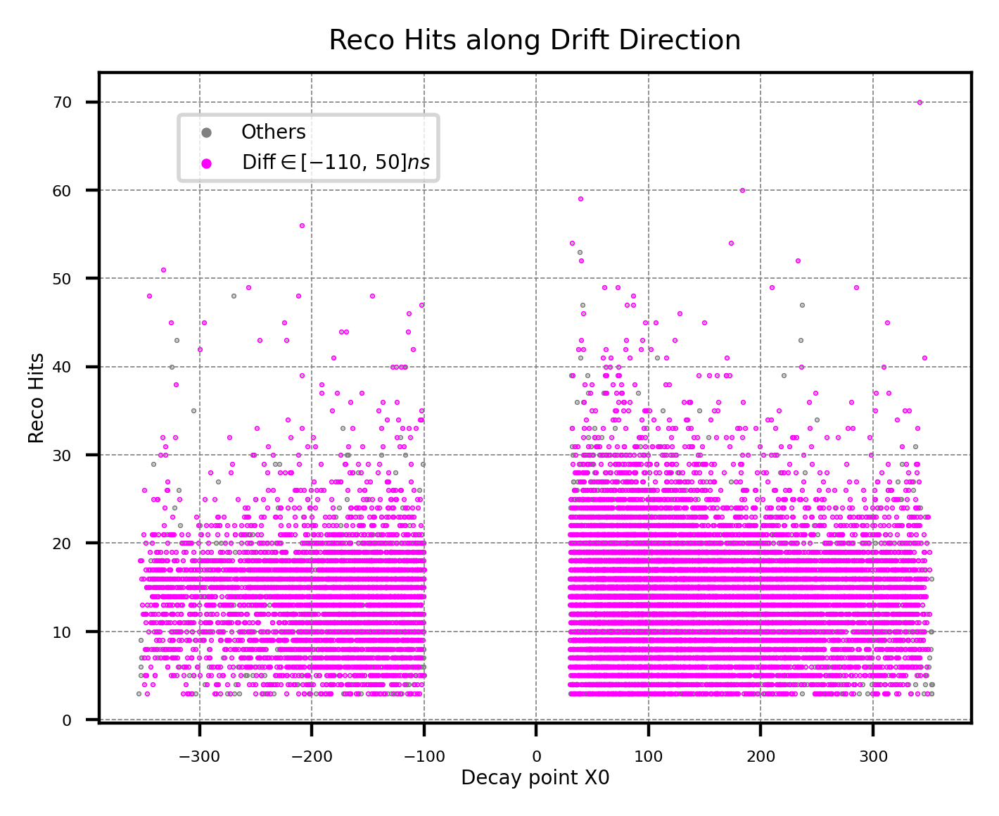


Michel Score Distribution: 


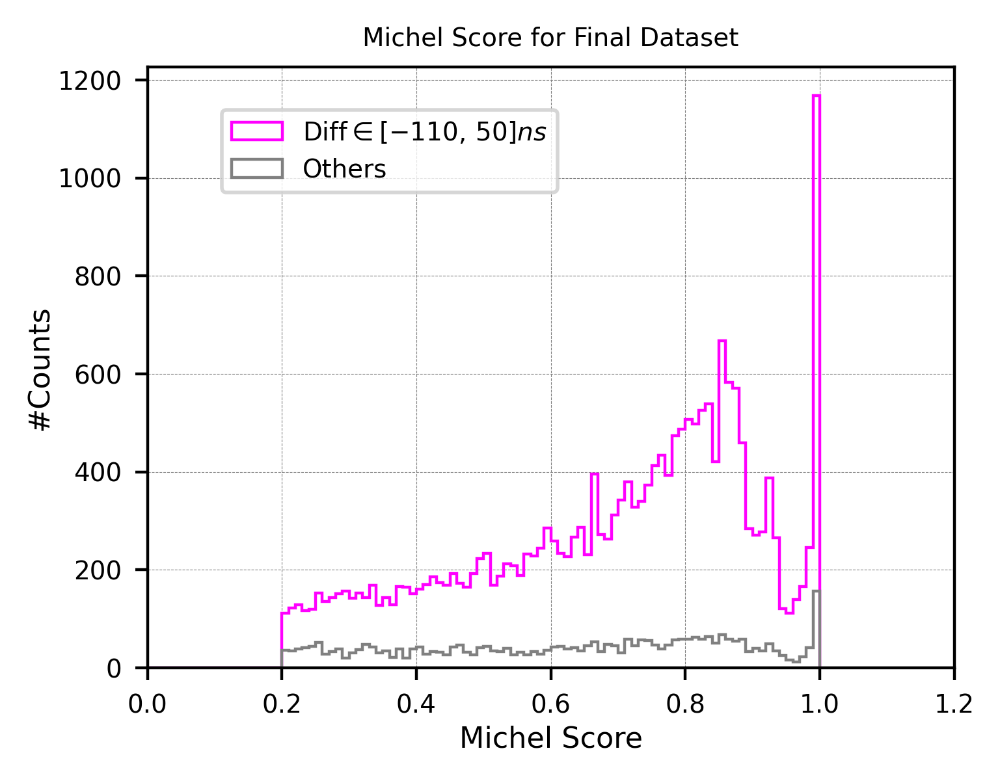


Michel Hits Distribution: 


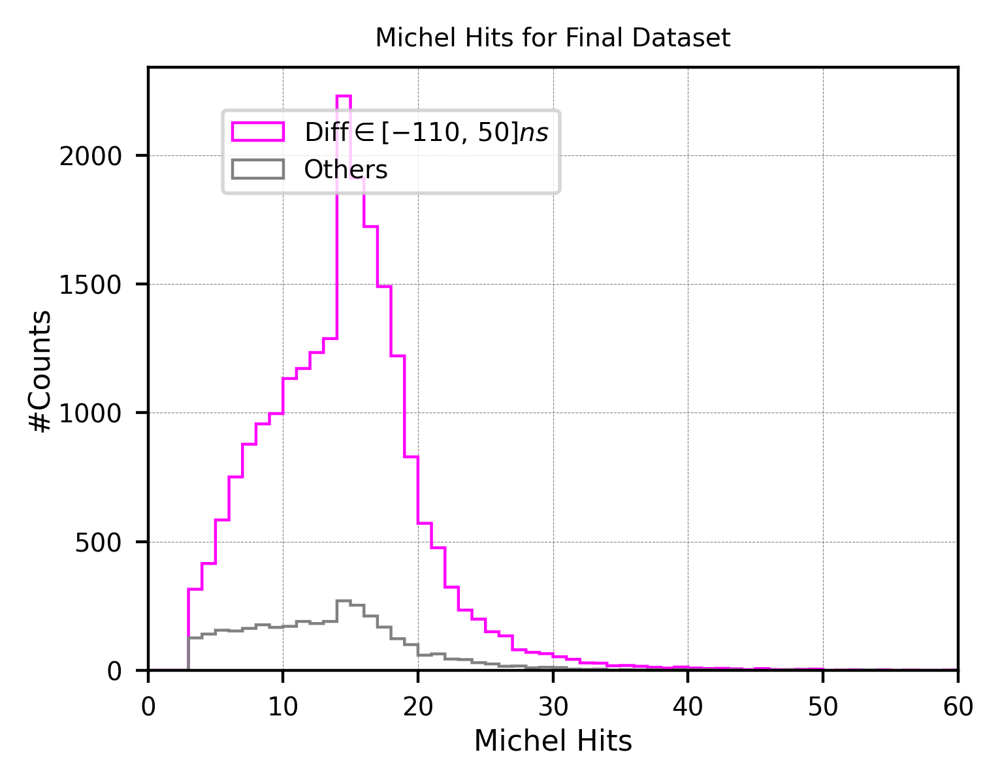

In [113]:
energy_diff500_purify9 = [ev.energy for ev in events_diff500_purify9]
energy_diff0_purify9 = [ev.energy for ev in events_diff0_purify9]
energy_total_purify9 = [ev.energy for ev in events_total_purify9]

hits_diff500_purify9 = [ev.michel_hits for ev in events_diff500_purify9]
hits_diff0_purify9 = [ev.michel_hits for ev in events_diff0_purify9]

score_diff500_purify9 = [ev.michel_score for ev in events_diff500_purify9]
score_diff0_purify9 = [ev.michel_score for ev in events_diff0_purify9]




#Decay points distribution:==========================================
print("\nEnergy Distribution: ")

# Plotting the histogram (X distribution)---------------
plt.figure(figsize=(4,3),dpi=400)


#Define the range and bin width
bin_width = 2
range_min =-1000
range_max = 1000
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(energy_total_purify9, bins=bins, range=(range_min, range_max), edgecolor='black', 
          histtype='step', linewidth=1.0, label="Total Final Dataset")
plt.hist(energy_diff0_purify9, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
          histtype='step', linewidth=0.8, label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.hist(energy_diff500_purify9, bins=bins, range=(range_min, range_max), edgecolor='grey', 
          histtype='step', linewidth=0.8, label="Others")

#--------------------------------


plt.xlim(-10, 60)
plt.xlabel('Energy [MeV]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.ylim(0.9, 2000)
#plt.yscale('log')
plt.title('Energy Distribution of Final Dataset', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.3, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show() 










# ==========================================================
# reco hits VS posX
# ==========================================================
plt.figure(figsize=(4,3), dpi=400)

# Scatter plot----------
plt.scatter(posX_diff500_purify9, hits_diff500_purify9, s=0.1, c='grey', alpha=1.0, label="Others")
plt.scatter(posX_diff0_purify9, hits_diff0_purify9, s=0.1, c='magenta', alpha=1.0, label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
#-----------------------

#plt.axis('scaled')
#plt.xlim(0, 2000)
#plt.ylim(0, 2000)
plt.ylabel('Reco Hits', labelpad=1, fontsize=5)
plt.xlabel('Decay point X0', labelpad=1, fontsize=5)
plt.title('Reco Hits along Drift Direction', fontsize=7)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.24, 0.95), fontsize=6, markerscale=5, ncol=1, prop={'size':5})
plt.show()








#Michel Score distribution:==========================================
print("\nMichel Score Distribution: ")

# Plotting the histogram (X distribution)---------------
plt.figure(figsize=(4,3),dpi=400)


#Define the range and bin width
bin_width = 0.01
range_min =-1
range_max = 1
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(score_diff0_purify9, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
          histtype='step', linewidth=0.8, label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.hist(score_diff500_purify9, bins=bins, range=(range_min, range_max), edgecolor='grey', 
          histtype='step', linewidth=0.8, label="Others")

#--------------------------------

plt.xlim(0, 1.2)
plt.xlabel('Michel Score', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.ylim(0.1, 200)
#plt.yscale('log')
plt.title('Michel Score for Final Dataset', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.3, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show() 







#Michel Hits distribution:==========================================
print("\nMichel Hits Distribution: ")

# Plotting the histogram (X distribution)---------------
plt.figure(figsize=(4,3),dpi=400)


#Define the range and bin width
bin_width = 1
range_min =0
range_max = 600
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(hits_diff0_purify9, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
          histtype='step', linewidth=0.8, label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.hist(hits_diff500_purify9, bins=bins, range=(range_min, range_max), edgecolor='grey', 
          histtype='step', linewidth=0.8, label="Others")

#--------------------------------

plt.xlim(0, 60)
plt.xlabel('Michel Hits', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.ylim(0.1, 200)
#plt.yscale('log')
plt.title('Michel Hits for Final Dataset', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.3, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show() 





<br />
<br />
<br />

#### Lifetime Distribution of Final Dataset (purification 9):

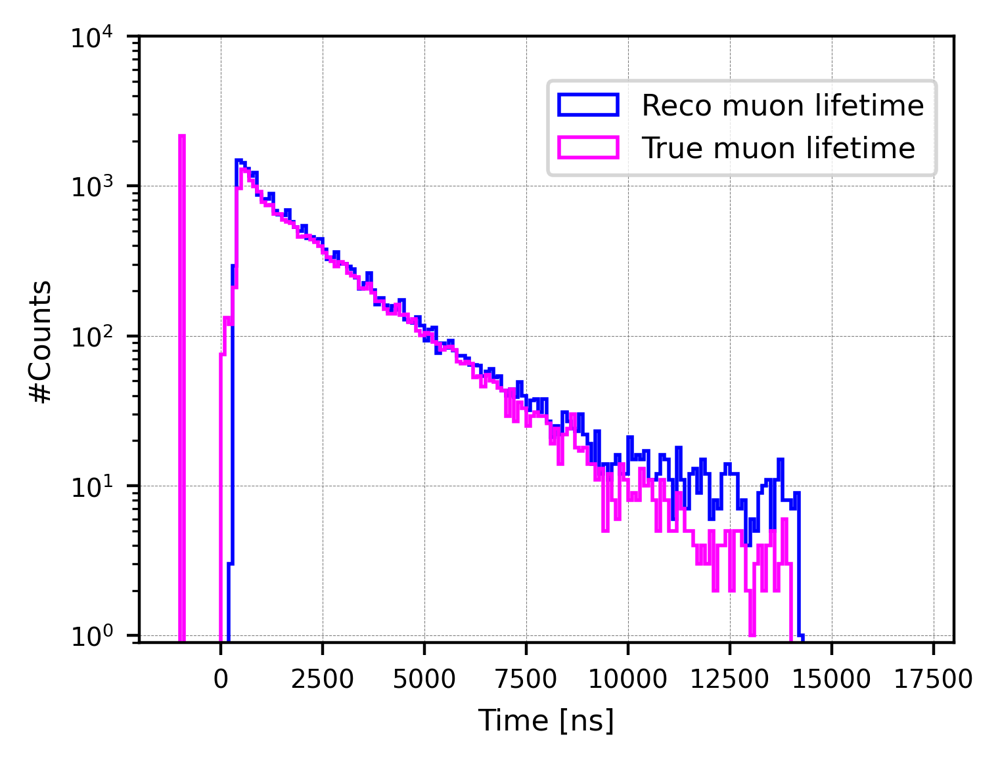



For each event, +40ns for reco time


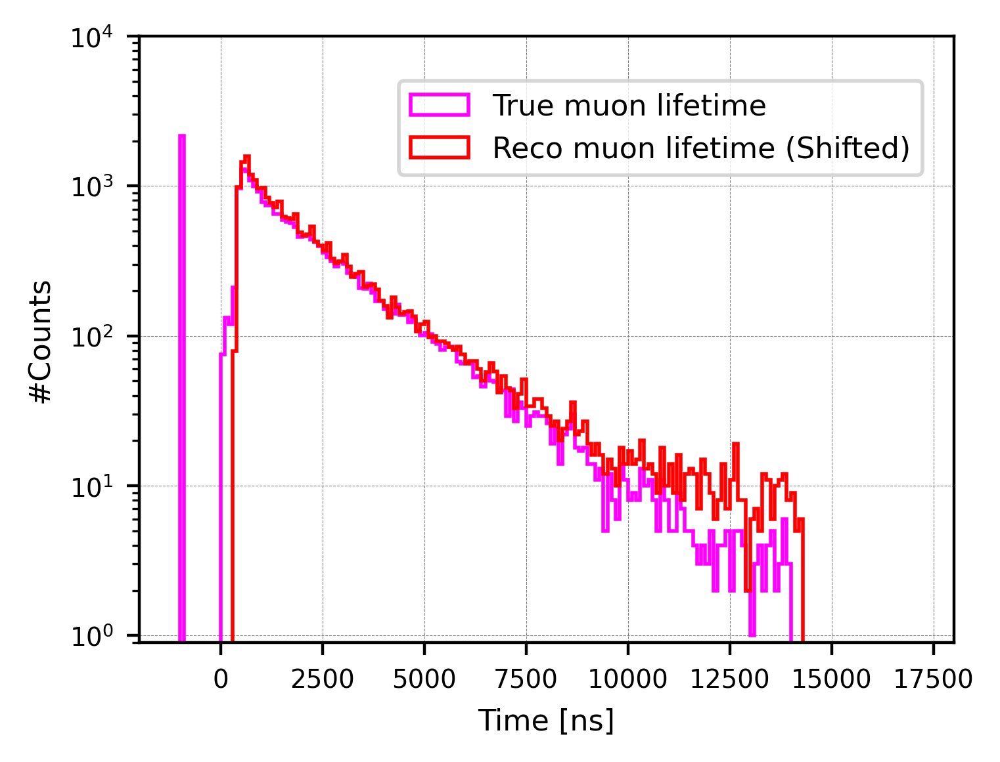

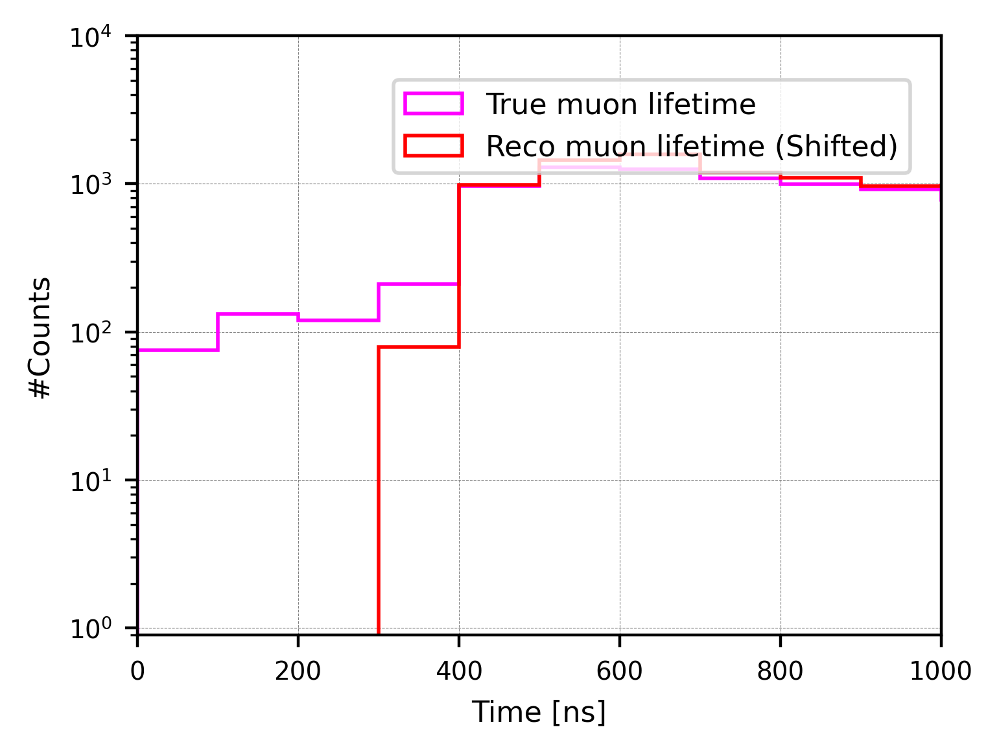



BKG distribution===========================

reco_true / reco_total:  22892 / 25041 (91.42%)


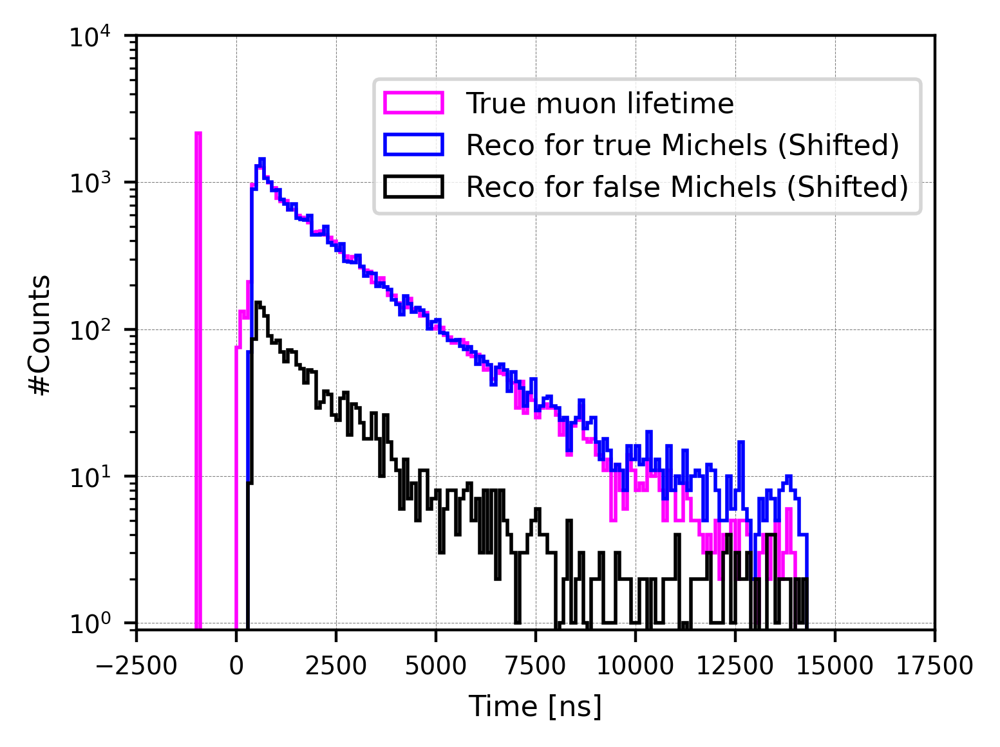

In [114]:

recoT_total_purify9 = [ev.reco_lifetime for ev in events_total_purify9]
trueT_total_purify9 = [ev.true_lifetime for ev in events_total_purify9]



# Muon Lifetime distribution (INITIAL; NO fitting)--------------------------------------------
plt.figure(figsize=(4, 3), dpi=400)


# Define histogram parameters
bin_width = 100
range_min = -16000
range_max = 16000
bins = np.arange(range_min, range_max + bin_width, bin_width)

# Plot histogram-----------------
plt.hist(recoT_total_purify9, bins=bins, range=(range_min, range_max),
         edgecolor='blue', histtype='step', linewidth=1.0,
         label='Reco muon lifetime')

plt.hist(trueT_total_purify9, bins=bins, range=(range_min, range_max),
         edgecolor='magenta', histtype='step', linewidth=1.0,
         label='True muon lifetime')

plt.xlim(-2000, 18000)
plt.ylim(0.9, 10000)
plt.yscale("log")
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('#Counts', fontsize=8)
#plt.title('Purified (mu time [55, 65]) Lifetime')
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.74, 0.95), fontsize=11, markerscale=5, ncol=1, prop={'size':8})
plt.show()




#Shift +40ns=========================================
print("\n\n===================================")
print("For each event, +40ns for reco time")
recoT_total_purify9_shift40 = [x + 40 for x in recoT_total_purify9]


bin_width = 100
range_min = -16000
range_max = 16000
bins = np.arange(range_min, range_max + bin_width, bin_width)

# Plot histogram-----------------
plt.figure(figsize=(4, 3), dpi=400)
#plt.hist(recoT_total_purify9, bins=bins, range=(range_min, range_max),
#         edgecolor='blue', histtype='step', linewidth=1.0,
#         label='Reco muon lifetime')

plt.hist(trueT_total_purify9, bins=bins, range=(range_min, range_max),
         edgecolor='magenta', histtype='step', linewidth=1.0,
         label='True muon lifetime')

plt.hist(recoT_total_purify9_shift40, bins=bins, range=(range_min, range_max),
         edgecolor='red', histtype='step', linewidth=1.0,
         label='Reco muon lifetime (Shifted)')

plt.xlim(-2000, 18000)
plt.ylim(0.9, 10000)
plt.yscale("log")
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('#Counts', fontsize=8)
#plt.title('Purified (mu time [55, 65]) Lifetime')
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.64, 0.95), fontsize=11, markerscale=5, ncol=1, prop={'size':8})
plt.show()







#Zoomed-in plot=========================================
print("\n\n===================================")


# Plot histogram-----------------
plt.figure(figsize=(4, 3), dpi=400)

plt.hist(trueT_total_purify9, bins=bins, range=(range_min, range_max),
         edgecolor='magenta', histtype='step', linewidth=1.0,
         label='True muon lifetime')

plt.hist(recoT_total_purify9_shift40, bins=bins, range=(range_min, range_max),
         edgecolor='red', histtype='step', linewidth=1.0,
         label='Reco muon lifetime (Shifted)')

plt.xlim(0, 1000)
plt.ylim(0.9, 10000)
plt.yscale("log")
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('#Counts', fontsize=8)
#plt.title('Purified (mu time [55, 65]) Lifetime')
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.64, 0.95), fontsize=11, markerscale=5, ncol=1, prop={'size':8})
plt.show()








#BKG distribution=========================================
print("\n\nBKG distribution===========================")
reco_true_finalEvents = []
reco_false_finalEvents = []

for i in range(0, len(trueT_total_purify9)):
    true = trueT_total_purify9[i]
    reco = recoT_total_purify9_shift40[i]

    if true > 0:
        reco_true_finalEvents.append(reco)
    else:
        reco_false_finalEvents.append(reco)

print("\nreco_true / reco_total: ", len(reco_true_finalEvents), "/", len(recoT_total_purify9_shift40),
       "({:.2f}%)".format(len(reco_true_finalEvents)/len(recoT_total_purify9_shift40)*100))

# Plot histogram-----------------
plt.figure(figsize=(4, 3), dpi=400)

plt.hist(trueT_total_purify9, bins=bins, range=(range_min, range_max),
         edgecolor='magenta', histtype='step', linewidth=1.0,
         label='True muon lifetime')

plt.hist(reco_true_finalEvents, bins=bins, range=(range_min, range_max),
         edgecolor='blue', histtype='step', linewidth=1.0,
         label='Reco for true Michels (Shifted)')

plt.hist(reco_false_finalEvents, bins=bins, range=(range_min, range_max),
         edgecolor='black', histtype='step', linewidth=1.0,
         label='Reco for false Michels (Shifted)')


plt.xlim(-2500, 17500)
plt.ylim(0.9, 10000)
plt.yscale("log")
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('#Counts', fontsize=8)
#plt.title('Purified (mu time [55, 65]) Lifetime')
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.64, 0.95), fontsize=11, markerscale=5, ncol=1, prop={'size':8})
plt.show()




<br />
<br />
<br />

#### Quick Check of Final Distribution:

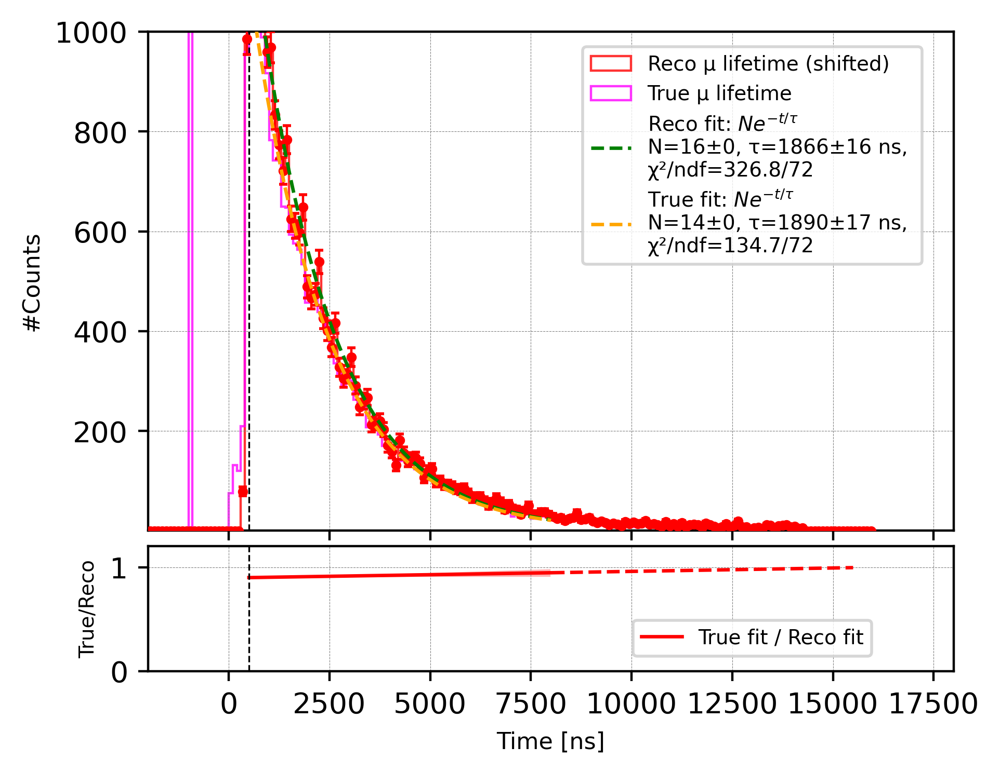

In [115]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from matplotlib.gridspec import GridSpec


#======Double Fitting with Ratio Panel==================================================
fig = plt.figure(figsize=(5, 4), dpi=400)
gs = GridSpec(2, 1, height_ratios=[4, 1], hspace=0.05)

# Histogram binning
bin_width = 100
range_min = -16000
range_max = 16000
bins = np.arange(range_min, range_max + bin_width, bin_width)

# --- Bin-integrated models ---
def exp1_integrated(edges, N, tau):
    a, b = edges[:-1], edges[1:]
    return N * tau * (np.exp(-a/tau) - np.exp(-b/tau))

def exp1C_integrated(edges, N, tau, C):
    a, b = edges[:-1], edges[1:]
    return N * tau * (np.exp(-a/tau) - np.exp(-b/tau)) + C * (b - a)

# --- Helpers ---
def _safe_sigma(y):
    return np.sqrt(np.clip(y, 1.0, None))

def numerical_grad(func, params, cov, x, h=1e-6):
    """Compute propagated uncertainty for func(x,*params) given parameter covariance."""
    f0 = func(x, *params)
    nparams = len(params)
    grads = np.zeros((nparams, len(x)))

    # finite difference for each parameter
    for i in range(nparams):
        dp = np.zeros_like(params, dtype=float)
        dp[i] = h * (abs(params[i]) + 1.0)
        f1 = func(x, *(params+dp))
        f2 = func(x, *(params-dp))
        grads[i] = (f1 - f2) / (2*dp[i])

    # propagate covariance: per point variance
    var = np.zeros(len(x))
    for k in range(len(x)):
        gk = grads[:, k]               # gradient at point k
        var[k] = gk @ cov @ gk         # g^T Cov g
    return np.sqrt(var)


# --- Reco fit: N*exp(-t/tau) + C ---
def fit_and_overlay_exp1C(ax, sample, label, fit_min, fit_max, color=None, line_style='--'):
    counts, bin_edges = np.histogram(sample, bins=bins, range=(range_min, range_max))
    centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
    m = (centers >= fit_min) & (centers <= fit_max)
    y = counts[m]

    if len(y) < 3 or y.sum() <= 0:
        return None, None, None, None

    edges_fit = bin_edges[np.where(m)[0][0] : np.where(m)[0][-1] + 2]
    sigma = _safe_sigma(y)

    N0 = np.sum(y); tau0 = 2000.0; C0 = np.min(y)/max(bin_width,1)
    p0 = [N0, tau0, C0]

    popt, pcov = curve_fit(
        lambda e, N, tau, C: exp1C_integrated(e, N, tau, C),
        edges_fit, y, p0=p0, sigma=sigma,
        absolute_sigma=True, maxfev=20000
    )
    perr = np.sqrt(np.diag(pcov))

    chi2 = np.sum(((y - exp1C_integrated(edges_fit, *popt))/sigma)**2)
    ndf = len(y) - len(popt)

    t_smooth = np.linspace(fit_min, fit_max, 400)
    y_smooth = popt[0]*np.exp(-t_smooth/popt[1])*bin_width + popt[2]*bin_width

    ax.plot(t_smooth, y_smooth, line_style, linewidth=1.2, color=color, zorder=5,
            label=(rf"{label} fit: $Ne^{{-t/\tau}} + C$"
                   f"\nN={popt[0]:.0f}±{perr[0]:.0f}, "
                   f"τ={popt[1]:.0f}±{perr[1]:.0f} ns, "
                   f"\nC={popt[2]:.1f}±{perr[2]:.1f}, "
                   f"χ²/ndf={chi2:.1f}/{ndf}"))

    return t_smooth, y_smooth, popt, pcov

# --- True fit: N*exp(-t/tau) ---
def fit_and_overlay_exp1(ax, sample, label, fit_min, fit_max, color=None):
    counts, bin_edges = np.histogram(sample, bins=bins, range=(range_min, range_max))
    centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
    m = (centers >= fit_min) & (centers <= fit_max)
    y = counts[m]

    if len(y) < 3 or y.sum() <= 0:
        return None, None, None, None

    edges_fit = bin_edges[np.where(m)[0][0] : np.where(m)[0][-1] + 2]
    sigma = _safe_sigma(y)

    N0 = np.sum(y); tau0 = 2000.0
    p0 = [N0, tau0]

    popt, pcov = curve_fit(
        lambda e, N, tau: exp1_integrated(e, N, tau),
        edges_fit, y, p0=p0, sigma=sigma,
        absolute_sigma=True, maxfev=20000
    )
    perr = np.sqrt(np.diag(pcov))

    chi2 = np.sum(((y - exp1_integrated(edges_fit, *popt))/sigma)**2)
    ndf = len(y) - len(popt)

    t_smooth = np.linspace(fit_min, fit_max, 400)
    y_smooth = popt[0]*np.exp(-t_smooth/popt[1])*bin_width

    ax.plot(t_smooth, y_smooth, linestyle='--', linewidth=1.2, color=color, zorder=5,
            label=(rf"{label} fit: $Ne^{{-t/\tau}}$"
                   f"\nN={popt[0]:.0f}±{perr[0]:.0f}, "
                   f"τ={popt[1]:.0f}±{perr[1]:.0f} ns, "
                   f"\nχ²/ndf={chi2:.1f}/{ndf}"))

    return t_smooth, y_smooth, popt, pcov

# -------- Top panel --------
ax1 = fig.add_subplot(gs[0])

# Histograms (faint outlines) + errors
counts_reco, bin_edges_reco, _ = ax1.hist(
    recoT_total_purify9_shift40, bins=bins, range=(range_min, range_max),
    edgecolor='red', histtype='step', linewidth=0.8, alpha=0.8,
    label='Reco μ lifetime (shifted)', zorder=1
)
bin_centers_reco = 0.5*(bin_edges_reco[:-1]+bin_edges_reco[1:])
ax1.errorbar(bin_centers_reco, counts_reco,
             yerr=np.sqrt(np.clip(counts_reco,0,None)),
             fmt='o', color='red', markersize=2.5,
             elinewidth=0.8, capsize=1.5, zorder=3)

ax1.hist(trueT_total_purify9, bins=bins, range=(range_min, range_max),
         edgecolor='magenta', histtype='step', linewidth=0.8,
         alpha=0.8, label='True μ lifetime', zorder=1)

# Fits
#t_reco, fit_reco, popt_reco, pcov_reco = fit_and_overlay_exp1C(ax1, recoT_total_purify9_shift40, "Reco",
#                                                               500, 8000, color="green")
t_reco, fit_reco, popt_reco, pcov_reco = fit_and_overlay_exp1(ax1, recoT_total_purify9_shift40, "Reco",
                                                               600, 8000, color="green")
t_true, fit_true, popt_true, pcov_true = fit_and_overlay_exp1(ax1, trueT_total_purify9, "True",
                                                              600, 8000, color="orange")

# Style
ax1.set_xlim(-2000, 16000)
ax1.tick_params(labelbottom=False)
ax1.set_ylim(0.1, 1000)
#ax1.set_yscale('log')
ax1.axvline(x=500, color='black', linestyle='--', linewidth=0.6)
ax1.set_ylabel('#Counts', fontsize=8)
ax1.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
ax1.legend(loc='upper center', bbox_to_anchor=(0.75, 0.99),
           fontsize=8, markerscale=5, ncol=1, prop={'size':7})

# -------- Bottom panel (ratio) --------
ax2 = fig.add_subplot(gs[1], sharex=ax1)
if (popt_reco is not None) and (popt_true is not None):
    t_common = np.linspace(500, 15500, 400)

#    f_reco = lambda x, N, tau, C: N*np.exp(-x/tau)*bin_width + C*bin_width
    f_reco = lambda x, N, tau: N*np.exp(-x/tau)*bin_width
    f_true = lambda x, N, tau: N*np.exp(-x/tau)*bin_width

    fit_reco_common = f_reco(t_common, *popt_reco)
    fit_true_common = f_true(t_common, *popt_true)
    ratio = np.divide(fit_true_common, fit_reco_common,
                      out=np.zeros_like(fit_true_common),
                      where=(fit_reco_common>0))

    # --- Error bands (only valid in fit range ≤ 8000) ---
    sigma_true = numerical_grad(f_true, np.array(popt_true), pcov_true, t_common)
    sigma_reco = numerical_grad(f_reco, np.array(popt_reco), pcov_reco, t_common)
    sigma_ratio = np.sqrt((sigma_true/fit_reco_common)**2 +
                          (fit_true_common * sigma_reco / fit_reco_common**2)**2)

    mask_fit = t_common <= 8000
    mask_extrap = t_common > 8000

    # Plot ratio: solid inside fit range, dashed outside
    ax2.plot(t_common[mask_fit], ratio[mask_fit],
             color='red', linewidth=1.2, label='True fit / Reco fit')
    ax2.plot(t_common[mask_extrap], ratio[mask_extrap],
             color='red', linewidth=1.2, linestyle='--')

    # Fill band only in fit range
    ax2.fill_between(t_common[mask_fit],
                     ratio[mask_fit] - sigma_ratio[mask_fit],
                     ratio[mask_fit] + sigma_ratio[mask_fit],
                     color='red', alpha=0.3, linewidth=0)

ax2.axvline(x=500, color='black', linestyle='--', linewidth=0.6)
ax2.set_xlim(-2000, 18000)
ax2.set_ylim(0.0, 1.2)
ax2.set_xlabel('Time [ns]', fontsize=8)
ax2.set_ylabel('True/Reco', fontsize=7)
ax2.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
ax2.legend(loc='upper center', bbox_to_anchor=(0.75, 0.49),
           fontsize=8, markerscale=5, ncol=1, prop={'size':7})

plt.show()

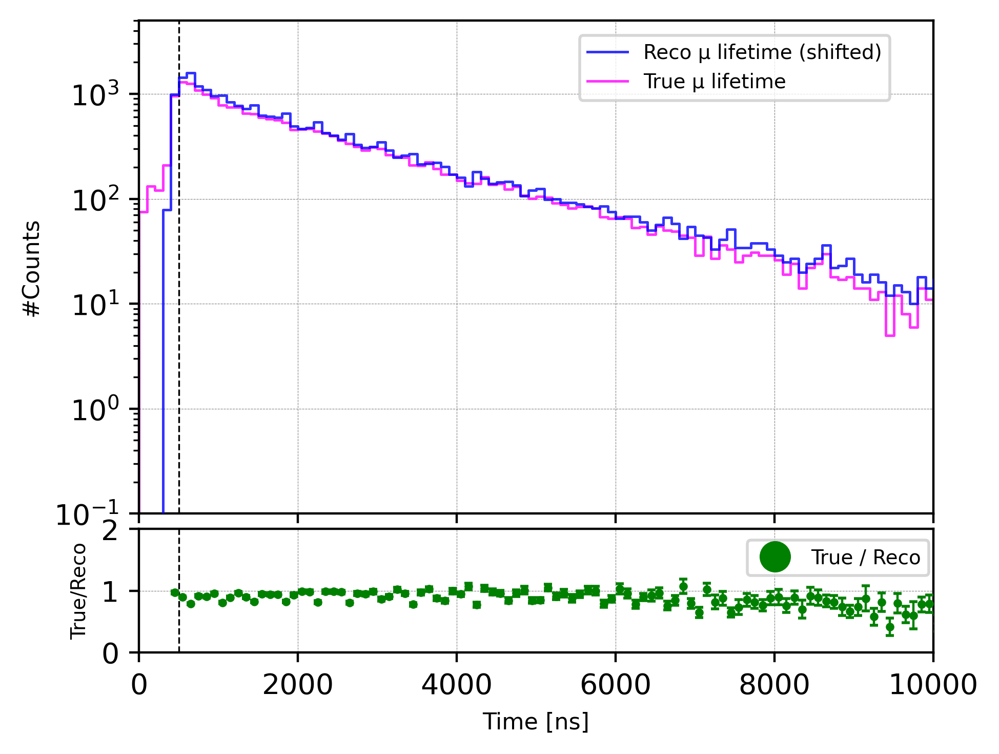

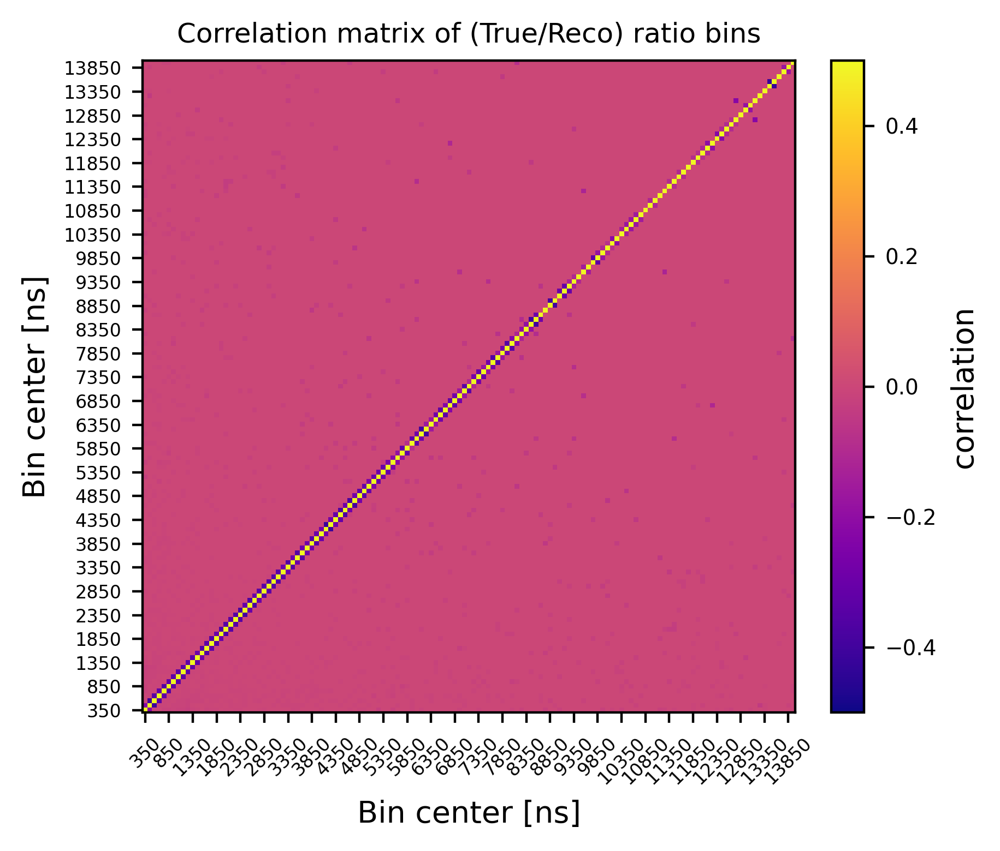

In [116]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

# ====== Extract lifetimes =====================================================
recoT_total_purify9 = [ev.reco_lifetime for ev in events_total_purify9]
trueT_total_purify9 = [ev.true_lifetime for ev in events_total_purify9]
recoT_total_purify9_shift40 = [x + 40 for x in recoT_total_purify9]  # ns shift

# ====== Double Panel: Hist + Ratio ============================================
fig = plt.figure(figsize=(5, 4), dpi=400)
gs = GridSpec(2, 1, height_ratios=[4, 1], hspace=0.05)

# Histogram binning
bin_width = 100
range_min = -16000
range_max = 16000
bins = np.arange(range_min, range_max + bin_width, bin_width)
bin_centers = 0.5 * (bins[:-1] + bins[1:])
nb = len(bin_centers)

# -------- Top panel -----------------------------------------------------------
ax1 = fig.add_subplot(gs[0])

# Histograms (paired events)
counts_reco, _ = np.histogram(recoT_total_purify9_shift40, bins=bins, range=(range_min, range_max))
counts_true, _ = np.histogram(trueT_total_purify9, bins=bins, range=(range_min, range_max))

# Plot both as step histograms
ax1.step(bins[:-1], counts_reco, where='post', color='blue',
         linewidth=0.9, alpha=0.8, label='Reco μ lifetime (shifted)', zorder=3)
ax1.step(bins[:-1], counts_true, where='post', color='magenta',
         linewidth=0.9, alpha=0.8, label='True μ lifetime', zorder=2)

# Style
ax1.set_xlim(-2000, 16000)
ax1.tick_params(labelbottom=False)
ax1.set_ylim(0.1, 5000)
ax1.set_yscale('log')
ax1.axvline(x=500, color='black', linestyle='--', linewidth=0.6)
ax1.set_ylabel('#Counts', fontsize=8)
ax1.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
ax1.legend(loc='upper center', bbox_to_anchor=(0.75, 0.99),
           fontsize=8, markerscale=5, ncol=1, prop={'size':7})

# -------- Build 2D joint histogram (True vs Reco) -----------------------------
joint, _, _ = np.histogram2d(trueT_total_purify9, recoT_total_purify9_shift40, bins=[bins, bins])
N = joint.sum()
if N == 0:
    raise ValueError("No events found in joint histogram!")

# Empirical probabilities
p = joint / N
pT = p.sum(axis=1)  # marginal over reco (true dist)
pC = p.sum(axis=0)  # marginal over true (reco dist)

# -------- Build covariance matrices ------------------------------------------
Cov_TT = np.zeros((nb, nb))
Cov_CC = np.zeros((nb, nb))
Cov_TC = np.zeros((nb, nb))
for i in range(nb):
    for j in range(nb):
        Cov_TT[i, j] = N * ((pT[i] if i == j else 0.0) - pT[i] * pT[j])
        Cov_CC[i, j] = N * ((pC[i] if i == j else 0.0) - pC[i] * pC[j])
for i in range(nb):
    for k in range(nb):
        Cov_TC[i, k] = N * (p[i, k] - pT[i] * pC[k])

# -------- Ratio and correlated propagation -----------------------------------
mask = counts_reco > 0
ratio = np.full(nb, np.nan)
ratio[mask] = counts_true[mask] / counts_reco[mask]

# Jacobians for delta propagation
J_T = np.zeros((nb, nb))
J_C = np.zeros((nb, nb))
for i in range(nb):
    if counts_reco[i] > 0:
        J_T[i, i] = 1.0 / counts_reco[i]
        J_C[i, i] = -counts_true[i] / (counts_reco[i] ** 2)

# Full covariance of ratio (includes bin correlations!)
Cov_R = (
    J_T @ Cov_TT @ J_T.T +
    J_C @ Cov_CC @ J_C.T +
    J_T @ Cov_TC @ J_C.T +
    J_C @ Cov_TC.T @ J_T.T
)
sigma_ratio = np.sqrt(np.clip(np.diag(Cov_R), 0, np.inf))

# -------- Bottom panel (ratio) -----------------------------------------------
ax2 = fig.add_subplot(gs[1], sharex=ax1)
ax2.errorbar(bin_centers, ratio, yerr=sigma_ratio,
             fmt='o', color='green', markersize=2.0,
             elinewidth=0.8, capsize=1.5, label='True / Reco', zorder=3)

ax2.axvline(x=500, color='black', linestyle='--', linewidth=0.6)
ax2.set_xlim(0, 10000)
ax2.set_ylim(0.0, 2.0)
ax2.set_xlabel('Time [ns]', fontsize=8)
ax2.set_ylabel('True/Reco', fontsize=7)
ax2.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
ax2.legend(loc='upper center', bbox_to_anchor=(0.88, 0.99),
           fontsize=8, markerscale=5, ncol=1, prop={'size':7})

plt.show()






good_bins = np.where(mask & np.isfinite(ratio) & (sigma_ratio > 0))[0]

# Build correlation matrix
Cov_valid = Cov_R[np.ix_(good_bins, good_bins)]
sigma_valid = np.sqrt(np.clip(np.diag(Cov_valid), 1e-12, np.inf))
corr_masked = Cov_valid / np.outer(sigma_valid, sigma_valid)
corr_masked = np.clip(corr_masked, -1.0, 1.0)


# Example: show tick labels every Nth bin
tick_step = 5
tick_idx = np.arange(0, len(good_bins), tick_step)
tick_labels = (bin_centers[good_bins][tick_idx]).astype(int)

plt.figure(figsize=(5, 4), dpi=400)
im = plt.imshow(
    corr_masked,
    vmin=-0.5, vmax=0.5,
    cmap='plasma',
    origin='lower',
    interpolation='nearest'
)
plt.title("Correlation matrix of (True/Reco) ratio bins", fontsize=9)
plt.xticks(tick_idx, tick_labels, rotation=45, fontsize=6)
plt.yticks(tick_idx, tick_labels, fontsize=6)
plt.xlabel("Bin center [ns]")
plt.ylabel("Bin center [ns]")
cbar = plt.colorbar(im, label='correlation', fraction=0.046, pad=0.04)
cbar.ax.tick_params(labelsize=7)
plt.tight_layout()
plt.show()





<br />
<br />
<br />
<br />
<br />

## Lifetime measurement efficiency:

#### Initial True Michel and Final True Michel---

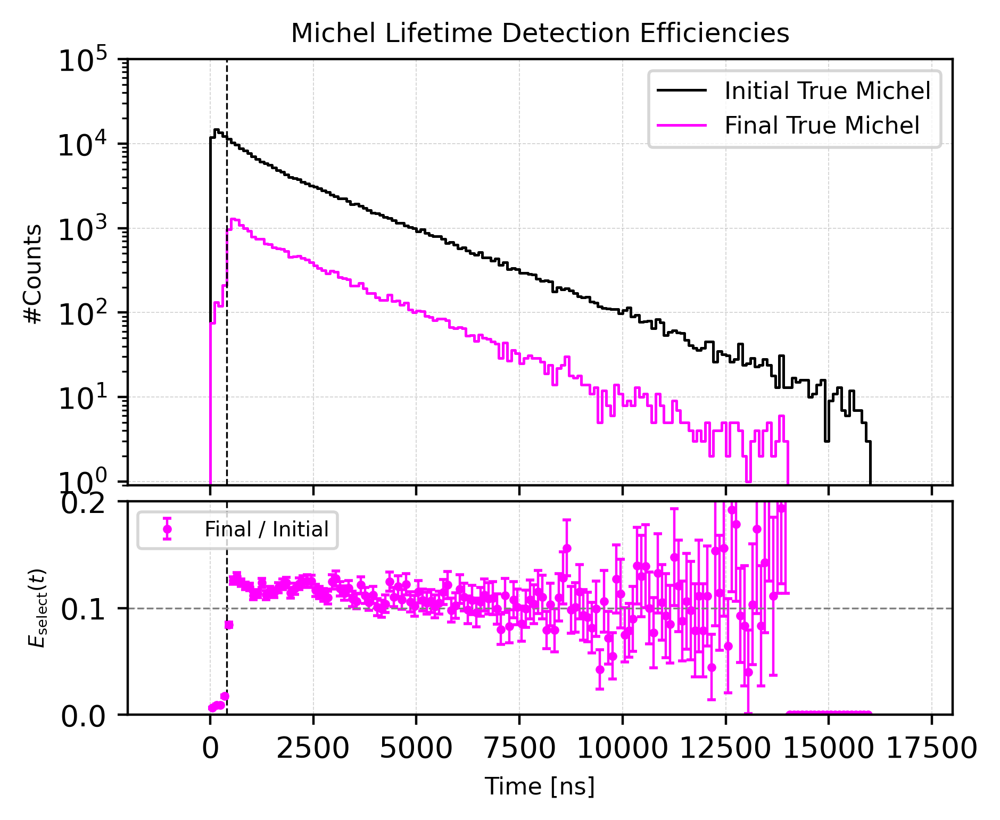

✅ Efficiency ratio and binomial uncertainties stored.
  Number of bins: 320
  Example efficiency range: 0.000–0.231
  Mean relative error: 21.675%
Saved efficiency ratios to michel_efficiency_ratios.npz
  → bins:   (160,)
  → ratio:  (160,)
  → error:  (160,)


/var/folders/c9/547_2pf11mv74b226lzvqwj00000gn/T/ipykernel_28341/1708360408.py:90: RuntimeWarning: invalid value encountered in divide
  rel_err = err_eff[mask] / eff[mask]


In [117]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import numpy.ma as ma

# ----------------------------- Inputs ---------------------------------
trueMichel_initial = np.load("trueMichel_initial.npy", allow_pickle=True).tolist()
trueT_total_purify9 = np.asarray(trueT_total_purify9)

# ----------------------------- Binning --------------------------------
bin_width = 100
range_min, range_max = -16000, 16000
bins = np.arange(range_min, range_max + bin_width, bin_width)
centers = 0.5 * (bins[:-1] + bins[1:])
nb = len(centers)

# ----------------------------- Histos ---------------------------------
I, _ = np.histogram(trueMichel_initial, bins=bins, range=(range_min, range_max))
F, _ = np.histogram(trueT_total_purify9, bins=bins, range=(range_min, range_max))

I = I.astype(float)
F = np.minimum(F.astype(float), I)  # guard: ensure F ≤ I
mask = I > 0

# ----------------------------- Efficiency -----------------------------
eff = np.full(nb, np.nan)
eff[mask] = F[mask] / I[mask]

# Binomial (conditional) uncertainty: sqrt(p(1-p)/I)
err_eff = np.full(nb, np.nan)
err_eff[mask] = np.sqrt(np.clip(eff[mask] * (1 - eff[mask]) / I[mask], 0, np.inf))

# Covariance: diagonal only (bins independent)
Cov_eff = np.zeros((nb, nb))
Cov_eff[np.diag_indices(nb)] = np.nan_to_num(err_eff ** 2, nan=0.0)


# ----------------------------- Plots ----------------------------------
fig = plt.figure(figsize=(5, 4), dpi=400)
gs = GridSpec(2, 1, height_ratios=[2, 1], hspace=0.05)

# Top panel: counts
ax1 = fig.add_subplot(gs[0])

I_closed = np.append(I, 0.0)
F_closed = np.append(F, 0.0)

ax1.step(bins, I_closed, where='post', color='black', lw=0.9, label='Initial True Michel')
ax1.step(bins, F_closed, where='post', color='magenta', lw=0.9, label='Final True Michel')




ax1.set_yscale('log')
ax1.set_ylim(0.9, 100000)
ax1.set_xlim(-2000, 18000)
ax1.axvline(400, ls='--', c='k', lw=0.6)
ax1.set_ylabel('#Counts', fontsize=8)
ax1.set_title("Michel Lifetime Detection Efficiencies", fontsize=9)
ax1.legend(fontsize=8, loc='upper right')
ax1.grid(ls='--', lw=0.3, alpha=0.6)
ax1.tick_params(labelbottom=False)

# Bottom panel: efficiency
ax2 = fig.add_subplot(gs[1], sharex=ax1)
ax2.errorbar(centers[mask], eff[mask], yerr=err_eff[mask],
             fmt='o', ms=2.0, elinewidth=0.8, capsize=1.5,
             color='magenta', label='Final / Initial')
ax2.axvline(400, ls='--', c='k', lw=0.6)
ax2.axhline(0.1, ls='--', c='gray', lw=0.6)
ax2.set_xlim(-2000, 18000)
ax2.set_ylim(0.0, 0.2)
ax2.set_xlabel('Time [ns]', fontsize=8)
ax2.set_ylabel(r'$E_{\mathrm{select}}(t)$', fontsize=7)
ax2.grid(ls='--', lw=0.3, alpha=0.6)
ax2.legend(fontsize=7, loc='upper left')
plt.show()

# ----------------------------- Save Results ---------------------------
lifetime_efficiency = eff.copy()
lifetime_efficiency_unc = err_eff.copy()
Cov_efficiency = Cov_eff.copy()
bin_edges_eff = bins.copy()
bin_centers_eff = centers.copy()

print("✅ Efficiency ratio and binomial uncertainties stored.")
print(f"  Number of bins: {len(lifetime_efficiency)}")
print(f"  Example efficiency range: {np.nanmin(lifetime_efficiency):.3f}–{np.nanmax(lifetime_efficiency):.3f}")

rel_err = err_eff[mask] / eff[mask]
print(f"  Mean relative error: {np.nanmean(rel_err):.3%}")



# ============================================================
# Save efficiency ratios and uncertainties for later notebook use
# ============================================================

# Keep only valid (I > 0) bins
valid_idx = np.where(I > 0)[0]


# Prepare arrays
bins_save   = centers[valid_idx]
ratio_save  = eff[valid_idx]
error_save  = err_eff[valid_idx]

# Save to a compressed .npz file
np.savez("michel_efficiency_ratios.npz",
         bins=bins_save,
         ratio=ratio_save,
         error=error_save)

print("Saved efficiency ratios to michel_efficiency_ratios.npz")
print(f"  → bins:   {bins_save.shape}")
print(f"  → ratio:  {ratio_save.shape}")
print(f"  → error:  {error_save.shape}")




<br />
<br />

#### Apply efficiency curve (CORE):

n_final total entries: 25040.0
Nonzero bins: 1187 / 102400


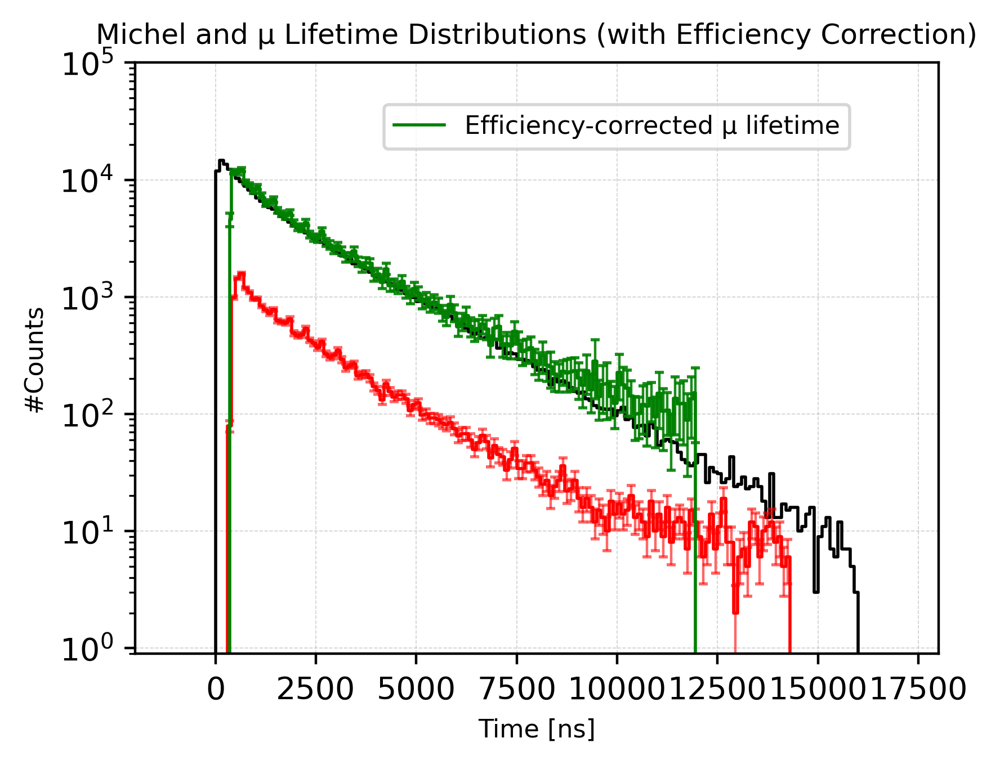

✅ Efficiency-corrected reco histogram built for 120 bins.
   Mean correction factor ≈ 125000000010.90×

BinCenter [ns] | TotalError | DataTerm | EffTerm
--------------------------------------------------
      350      605.415     517.293     314.541
      450      519.412     372.853     361.620
      550      424.124     301.725     298.065
      650      445.033     306.735     322.440
      750      389.526     278.436     272.404
      850      385.406     274.272     270.764
      950      358.451     258.650     248.168
     1050      404.267     279.006     292.554
     1150      359.106     254.232     253.621
     1250      310.696     225.062     214.195
     1350      337.626     239.553     237.920
     1450      347.346     241.354     249.795
     1550      303.826     218.508     211.103
     1650      288.519     207.446     200.523
     1750      277.759     199.895     192.853
     1850      295.680     205.840     212.266
     1950      269.848     193.359     188.2

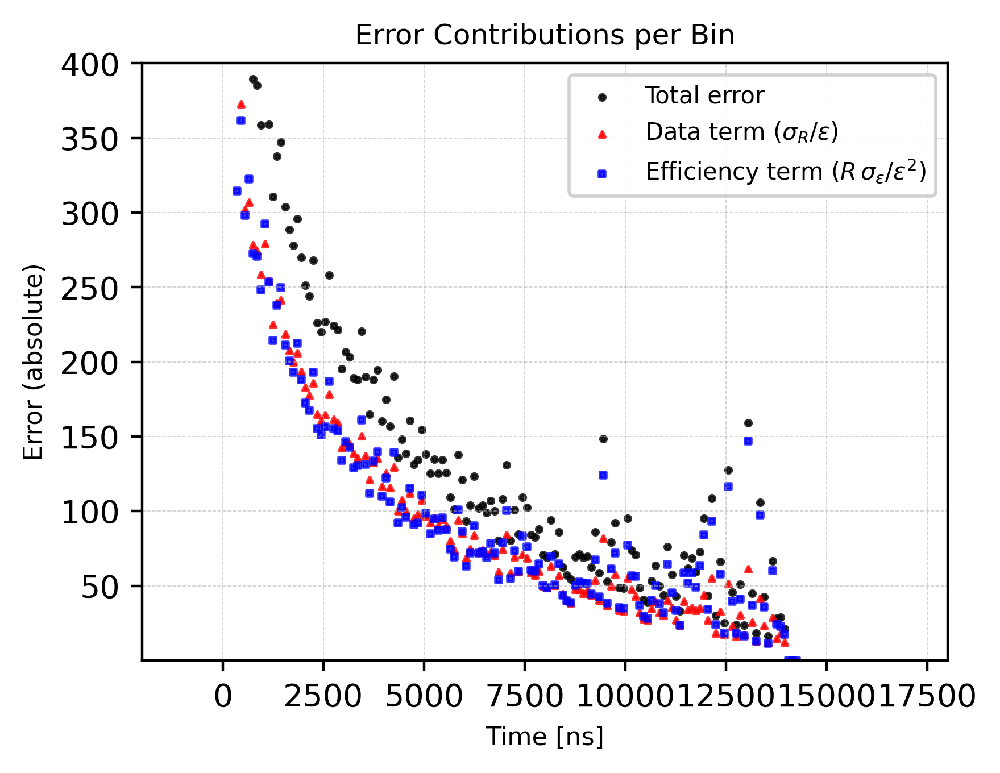

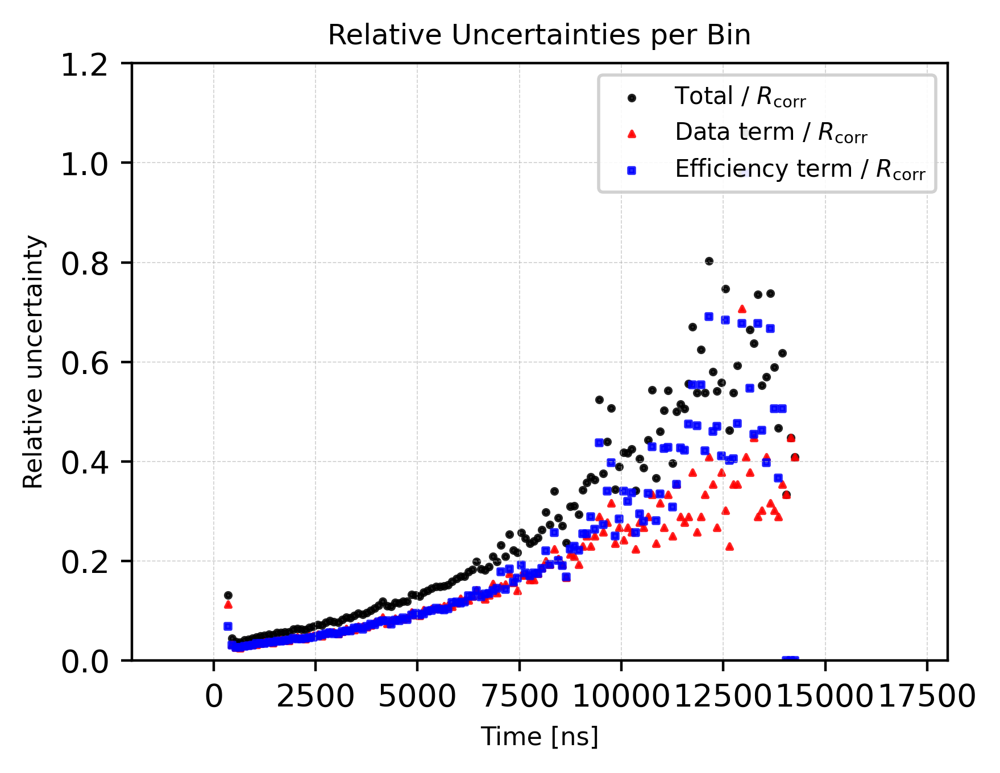

In [118]:
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# 1. Binning setup — reuse from efficiency calculation
# ============================================================
bins = bin_edges_eff.copy()
centers = bin_centers_eff.copy()
nb = len(centers)


# ============================================================
# 2. Load efficiency results from previous cell
# ============================================================
eff = np.clip(lifetime_efficiency, 1e-12, None)              # ratio Final/Initial
eff_unc = np.nan_to_num(lifetime_efficiency_unc, nan=0.0)    # binomial uncertainty
Cov_eff = Cov_efficiency.copy()                              # diagonal covariance


# ============================================================
# 3. Build final true–reco 2D table from paired events
# ============================================================
true_idx = np.digitize(trueT_total_purify9, bins) - 1
reco_idx = np.digitize(recoT_total_purify9_shift40, bins) - 1

valid = (
    (true_idx >= 0) & (true_idx < nb) &
    (reco_idx >= 0) & (reco_idx < nb)
)
true_idx = true_idx[valid]
reco_idx = reco_idx[valid]

# 2D true–reco histogram after cuts
n_final = np.zeros((nb, nb), dtype=float)
np.add.at(n_final, (true_idx, reco_idx), 1.0)

print(f"n_final total entries: {np.sum(n_final)}")
print(f"Nonzero bins: {np.count_nonzero(n_final)} / {nb*nb}")


# ============================================================
# 4. Apply efficiency correction (A/B-style propagation)
# ============================================================
# Reco histogram before correction
counts_reco, _ = np.histogram(recoT_total_purify9_shift40, bins=bins)
sigma_reco = np.sqrt(np.clip(counts_reco, 0, None))

# Efficiency-corrected spectrum: simple division (float-safe)
R_corr = np.divide(counts_reco.astype(float), eff,
                   out=np.zeros_like(counts_reco, dtype=float),
                   where=eff > 0)

# Propagate error: σ² = (σ_R/ε)² + (R * σ_ε / ε²)²
Var_Rcorr = (
    (sigma_reco / np.clip(eff, 1e-12, None)) ** 2 +
    ((counts_reco * eff_unc) / np.clip(eff, 1e-12, None) ** 2) ** 2
)
sigma_R_corr = np.sqrt(np.clip(Var_Rcorr, 0, None))


# ============================================================
# 5. Reference histograms (for visual comparison)
# ============================================================
counts_initial, _ = np.histogram(trueMichel_initial, bins=bins, range=(range_min, range_max))

# ============================================================
# 6. Plot
# ============================================================
plt.figure(figsize=(4.5, 3.5), dpi=400)

# (a) Initial true Michel
counts_initial_closed = np.append(counts_initial, 0.0)
plt.step(bins, counts_initial_closed, where='post', color='black', lw=1.0)


# (b) Reco μ lifetime (shifted)
counts_reco_closed = np.append(counts_reco, 0.0)
plt.step(bins, counts_reco_closed, where='post', color='red', lw=1.0)
plt.errorbar(centers, counts_reco, yerr=sigma_reco,
             fmt='none', ecolor='red', elinewidth=0.8, capsize=1.5, alpha=0.6)

# (c) Efficiency-corrected μ lifetime
mask = (centers >= 0) & (centers <= 12000) & np.isfinite(R_corr) & (R_corr > 0)
# Select only valid points
x_c = centers[mask]
y_c = R_corr[mask]

# Build step x-array and closed y-array
x_step = np.r_[x_c[0], x_c, x_c[-1]]
y_step = np.r_[0.0, y_c, 0.0]

# Now they're equal length → perfect for 'steps-mid'
plt.step(x_step, y_step,
         where='mid', color='green', lw=1.0,
         label='Efficiency-corrected μ lifetime')

# Error bars
plt.errorbar(x_c, y_c, yerr=sigma_R_corr[mask],
             fmt='none', ecolor='green', elinewidth=0.8,
             capsize=1.5, alpha=0.9)








# Axes and style
plt.xlim(-2000, 18000)
plt.ylim(0.9, 100000)
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('#Counts', fontsize=8)
plt.yscale('log')
plt.grid(ls='--', lw=0.3, alpha=0.6)
plt.legend(loc='upper center', bbox_to_anchor=(0.6, 0.95), fontsize=8)
plt.title('Michel and μ Lifetime Distributions (with Efficiency Correction)', fontsize=9)
plt.tight_layout()
plt.show()


# ============================================================
# 7. Save outputs for later fitting or ratio comparisons
# ============================================================
effcorr_reco_counts = R_corr.copy()
effcorr_reco_unc = sigma_R_corr.copy()

Var_data = (sigma_reco / np.clip(eff, 1e-12, None)) ** 2
Var_eff = ((counts_reco * eff_unc) / np.clip(eff, 1e-12, None) ** 2) ** 2
Cov_effcorr_reco = np.diag(Var_data + Var_eff)

region_mask = (
    np.isfinite(eff) &
    (eff > 0) &
    (centers >= 0) &
    (centers <= 12000)
)


print(f"✅ Efficiency-corrected reco histogram built for {np.count_nonzero(region_mask)} bins.")
print(f"   Mean correction factor ≈ {np.nanmean(1/eff[eff>0]):.2f}×")




# ============================================================
# 8. Print per-bin error decomposition
# ============================================================

# Compute the two contributions explicitly
term_data = (sigma_reco / np.clip(eff, 1e-12, None)) ** 2
term_eff  = ((counts_reco * eff_unc) / np.clip(eff, 1e-12, None) ** 2) ** 2

print("\nBinCenter [ns] | TotalError | DataTerm | EffTerm")
print("--------------------------------------------------")
for i in range(nb):
    if not np.isfinite(R_corr[i]) or R_corr[i] <= 0:
        continue  # skip empty bins
    total_err = np.sqrt(term_data[i] + term_eff[i])
    data_err  = np.sqrt(term_data[i])
    eff_err   = np.sqrt(term_eff[i])
    print(f"{centers[i]:9.0f}   {total_err:10.3f}   {data_err:9.3f}   {eff_err:9.3f}")







# ============================================================
# 8b. Save errors and plot contributions vs. time
# ============================================================

# Initialize storage lists
bin_center_list = []
total_err_list  = []
data_err_list   = []
eff_err_list    = []

for i in range(nb):
    if not np.isfinite(R_corr[i]) or R_corr[i] <= 0:
        continue
    total_err = np.sqrt(term_data[i] + term_eff[i])
    data_err  = np.sqrt(term_data[i])
    eff_err   = np.sqrt(term_eff[i])
    bin_center_list.append(centers[i])
    total_err_list.append(total_err)
    data_err_list.append(data_err)
    eff_err_list.append(eff_err)

# Convert to numpy arrays (optional)
bin_center_arr = np.array(bin_center_list)
total_err_arr  = np.array(total_err_list)
data_err_arr   = np.array(data_err_list)
eff_err_arr    = np.array(eff_err_list)

# ============================================================
# Plot error components as scatter points
# ============================================================
plt.figure(figsize=(4.5, 3.5), dpi=400)

# total error — solid black circles
plt.scatter(bin_center_arr, total_err_arr, color='black', s=3, label='Total error', alpha=0.8)

# data term — red triangles
plt.scatter(bin_center_arr, data_err_arr, color='red', marker='^', s=3,
            label=r'Data term $(\sigma_R/\varepsilon)$', alpha=0.8)

# efficiency term — blue squares
plt.scatter(bin_center_arr, eff_err_arr, color='blue', marker='s', s=3,
            label=r'Efficiency term $(R\,\sigma_\varepsilon/\varepsilon^2)$', alpha=0.8)

# Axis & style
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('Error (absolute)', fontsize=8)
#plt.yscale('log')
plt.xlim(-2000, 18000)
plt.ylim(1e-3, 400)
plt.grid(ls='--', lw=0.3, alpha=0.6)

# Legend
plt.legend(fontsize=7.5, loc='upper right', frameon=True, framealpha=0.9)
plt.title('Error Contributions per Bin', fontsize=9)
plt.tight_layout()
plt.show()







# ============================================================
# 8c. Calculate and plot relative uncertainties
# ============================================================

# Match R_corr values to the same valid bins as in bin_center_arr
R_corr_valid = np.array([R_corr[np.where(centers == c)[0][0]] for c in bin_center_arr])

# Compute relative uncertainties (σ / R_corr)
rel_total_arr = np.divide(total_err_arr, R_corr_valid, out=np.full_like(total_err_arr, np.nan))
rel_data_arr  = np.divide(data_err_arr,  R_corr_valid, out=np.full_like(data_err_arr,  np.nan))
rel_eff_arr   = np.divide(eff_err_arr,   R_corr_valid, out=np.full_like(eff_err_arr,   np.nan))

# --- Plot relative uncertainties ---
plt.figure(figsize=(4.5, 3.5), dpi=400)

# total — black circles
plt.scatter(bin_center_arr, rel_total_arr, color='black', s=3, label='Total / $R_{\\mathrm{corr}}$', alpha=0.85)

# data term — red triangles
plt.scatter(bin_center_arr, rel_data_arr, color='red', marker='^', s=3,
            label=r'Data term / $R_{\mathrm{corr}}$', alpha=0.85)

# efficiency term — blue squares
plt.scatter(bin_center_arr, rel_eff_arr, color='blue', marker='s', s=3,
            label=r'Efficiency term / $R_{\mathrm{corr}}$', alpha=0.85)

# Axes & style
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('Relative uncertainty', fontsize=8)
plt.xlim(-2000, 18000)
plt.ylim(0, 1.2)
plt.grid(ls='--', lw=0.3, alpha=0.6)

# Legend & title
plt.legend(fontsize=7.5, loc='upper right', frameon=True, framealpha=0.9)
plt.title('Relative Uncertainties per Bin', fontsize=9)
plt.tight_layout()
plt.show()






<br />

#### Double exponential fitting (fixed tau2 ) (WITH Complete Error)

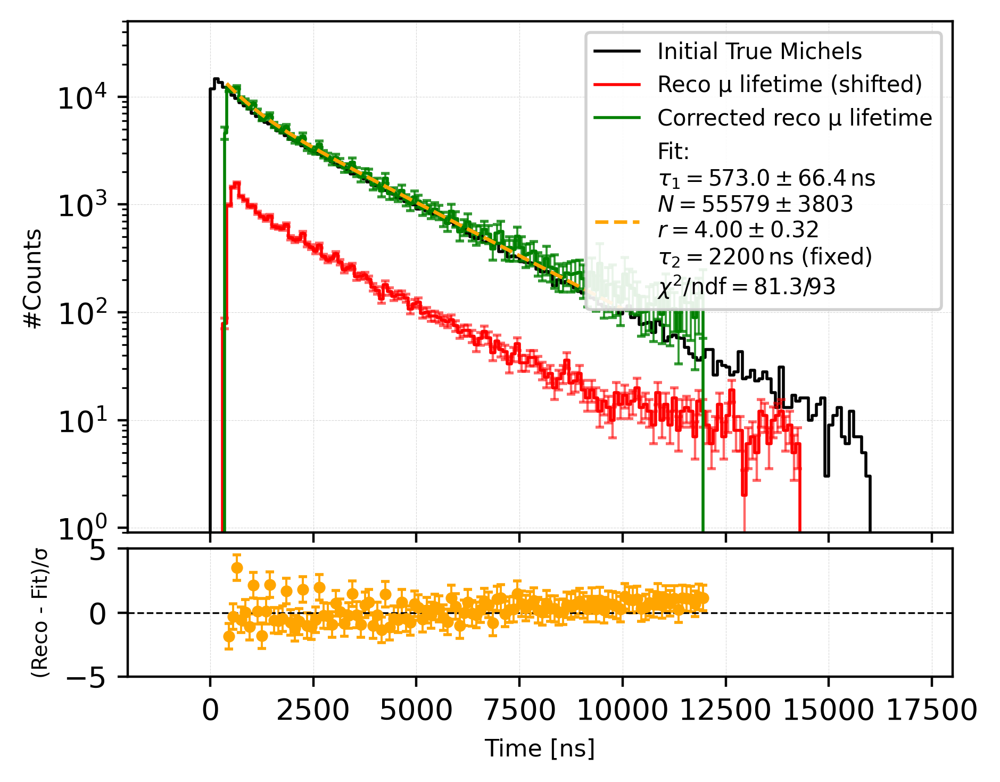


Fit results:
  N     = 55579.091 ± 3803.365
  τ₁    = 572.955 ± 66.445 ns
  r     = 3.998 ± 0.317
  τ₂    = 2200.0 ns  (fixed)
  χ²/ndf = 81.3/93 = 0.87


In [119]:
# ============================================================
# 9. Perform double-exponential lifetime fit (with styled legend)
# ============================================================
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt
import numpy as np

# --- Integrated double exponential model --------------------
def exp2_integrated(bin_edges, N, tau1, r, tau2=2200.0):
    a = bin_edges[:-1]
    b = bin_edges[1:]
    term1 = np.exp(-a / tau1) - np.exp(-b / tau1)
    term2 = np.exp(-a / tau2) - np.exp(-b / tau2)
    return N * (term1 + r * term2)

# ============================================================
# 1. Prepare data for fit
# ============================================================
bin_edges   = bins.copy()
bin_centers = centers.copy()

y     = R_corr.copy()
yerr  = sigma_R_corr.copy()
counts_initial = counts_initial.copy()
counts_reco    = counts_reco.copy()
sigma_reco     = sigma_reco.copy()

bin_width = bin_edges[1] - bin_edges[0]
tau2      = 2200.0

# ------------------- NEW: mask for green drawing --------------------
mask_green = (bin_centers >= 0) & (bin_centers <= 12000) & (y > 0) & np.isfinite(y)

# ------------------- Existing mask for fitting ----------------------
fit_range = (400, 10000)#=======================================================
mask_fit = (
    (bin_centers >= fit_range[0]) & 
    (bin_centers <= fit_range[1]) &
    (y > 0) & np.isfinite(y)
)

if not np.any(mask_fit):
    print("⚠ No valid bins in fit region.")
else:
    # Prepare edges for fit window
    i0, i1 = np.where(mask_fit)[0][[0, -1]]
    edges_fit = bin_edges[i0 : i1 + 2]
    y_fit     = y[mask_fit]
    sigma_fit = np.clip(yerr[mask_fit], 1.0, None)

    # Initial guesses
    N0      = np.sum(y_fit)
    tau1_0  = 1000.0
    r_0     = 4.7       # NEW: r floats

    # ------------------- NEW: Fit r as a free parameter --------------------
    popt, pcov = curve_fit(
        lambda edges, N, tau1, r: exp2_integrated(edges, N, tau1, r, tau2),
        edges_fit, y_fit,
        p0=[N0, tau1_0, r_0],
        sigma=sigma_fit, absolute_sigma=True,
        bounds=([0, 1e-6, 0], [np.inf, np.inf, 20.0])
    )

    N_fit, tau1_fit, r_fit = popt
    N_err, tau1_err, r_err = np.sqrt(np.diag(pcov))

    # Compute χ²
    chi2 = np.sum(((y_fit - exp2_integrated(edges_fit, *popt, tau2)) / sigma_fit)**2)
    ndf  = len(y_fit) - len(popt)

    # ============================================================
    # 2. Plot (main + residuals)
    # ============================================================
    fig, (ax, ax_resid) = plt.subplots(
        2, 1, figsize=(5, 4), dpi=400, sharex=True,
        gridspec_kw={'height_ratios': [4, 1], 'hspace': 0.05}
    )

    # --- initial true Michels (black) ---
    # --- CLOSED black curve (Initial True Michels) ---
    x_b = bin_edges
    y_b = np.append(counts_initial, 0.0)   # <--- closes the curve

    ax.step(x_b, y_b, where='post',
        color='black', lw=1.0, label='Initial True Michels')



    # --- reco μ lifetime (red) ---
    ax.step(bin_edges, np.append(counts_reco, counts_reco[-1]),
            where='post', color='red', lw=1.0, label='Reco μ lifetime (shifted)')
    ax.errorbar(bin_centers, counts_reco, yerr=sigma_reco,
                fmt='none', ecolor='red', elinewidth=0.8, capsize=1.5, alpha=0.6)

    # --- NEW: corrected reco μ lifetime (green, masked + closed) ---
    xg = bin_centers[mask_green]
    yg = y[mask_green]
    yg_err = yerr[mask_green]

    x_step = np.r_[xg[0], xg, xg[-1]]
    y_step = np.r_[0.0, yg, 0.0]

    ax.step(x_step, y_step, where='mid', color='green', lw=1.0,
            label='Corrected reco μ lifetime')
    ax.errorbar(xg, yg, yerr=yg_err,
                fmt='none', ecolor='green', elinewidth=0.7, capsize=1.5, alpha=0.8)

    # --- NEW: fitted curve with fluctuating r ---
    x_smooth = np.linspace(fit_range[0], fit_range[1], 400)
    y_smooth = (
        (N_fit / tau1_fit) * np.exp(-x_smooth / tau1_fit) * bin_width +
        (N_fit * r_fit / tau2) * np.exp(-x_smooth / tau2) * bin_width
    )

    ax.plot(
    x_smooth, y_smooth,
    color='orange', ls='--', lw=1.2,
    label=(
        r"Fit:" "\n"
        + rf"$\tau_1 = {tau1_fit:.1f} \pm {tau1_err:.1f}\,\mathrm{{ns}}$" "\n"
        + rf"$N = {N_fit:.0f} \pm {N_err:.0f}$" "\n"
        + rf"$r = {r_fit:.2f} \pm {r_err:.2f}$" "\n"
        + r"$\tau_2 = 2200\,\mathrm{ns}$ (fixed)" "\n"
        + rf"$\chi^2/\mathrm{{ndf}} = {chi2:.1f}/{ndf}$"
    ))



    # axis cosmetics
    ax.set_yscale('log')
    ax.set_xlim(-2000, 18000)
    ax.set_ylim(0.9, 5e4)
    ax.set_ylabel('#Counts', fontsize=8)
    ax.grid(ls='--', lw=0.2, alpha=0.5)
    ax.tick_params(labelbottom=False)

    ax.legend(loc='upper right', fontsize=7.5, framealpha=0.9)

    # residuals
    y_model_full = exp2_integrated(bin_edges, *popt, tau2)
    pulls = (y - y_model_full) / np.where(yerr > 0, yerr, np.inf)


    
    ax_resid.errorbar(bin_centers[mask], pulls[mask], yerr=np.ones(np.sum(mask)),
                      fmt='o', color='orange', markersize=3, elinewidth=0.7, capsize=1.5)


    ax_resid.axhline(0, color='black', lw=0.6, ls='--')
    ax_resid.set_xlabel('Time [ns]', fontsize=8)
    ax_resid.set_ylabel('(Reco - Fit)/σ', fontsize=7)
    ax_resid.set_xlim(-2000, 18000)
    ax_resid.set_ylim(-5, 5)
    ax_resid.grid(ls='--', lw=0.2, alpha=0.5)

    plt.show()

    # ============================================================
    # 3. Print results
    # ============================================================
    print("\nFit results:")
    print(f"  N     = {N_fit:.3f} ± {N_err:.3f}")
    print(f"  τ₁    = {tau1_fit:.3f} ± {tau1_err:.3f} ns")
    print(f"  r     = {r_fit:.3f} ± {r_err:.3f}")
    print(f"  τ₂    = {tau2:.1f} ns  (fixed)")
    print(f"  χ²/ndf = {chi2:.1f}/{ndf:.0f} = {chi2/ndf:.2f}")


<br />
<br />

### Applying new fitting formula:

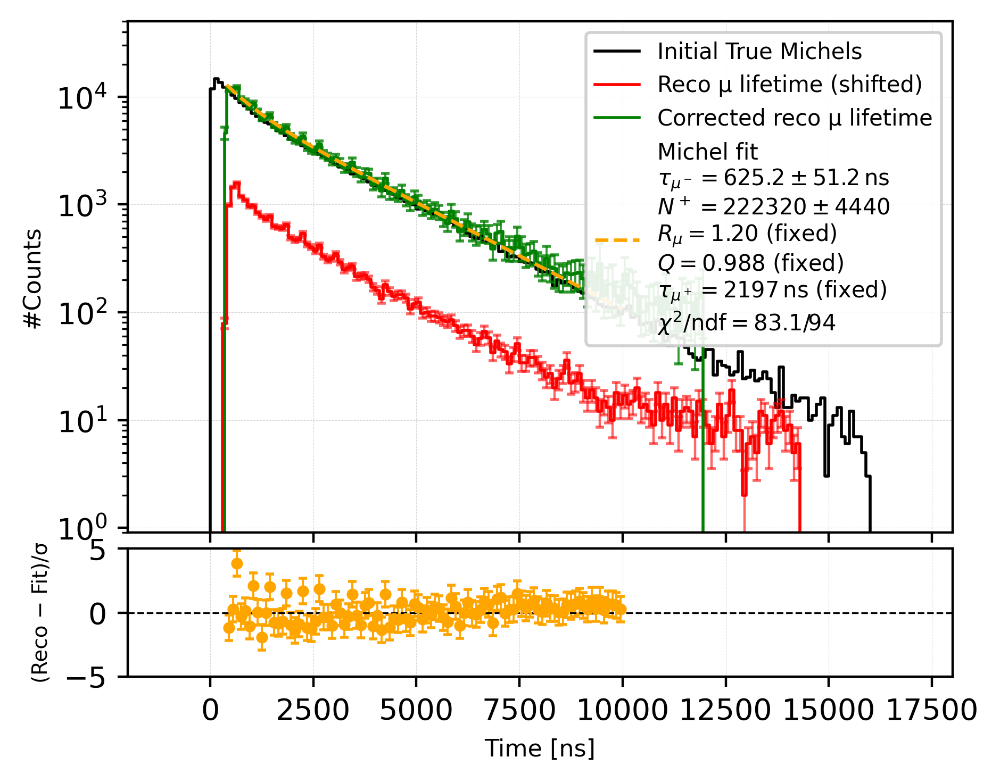


Michel fit results:
  N⁺       = 222319.859 ± 4440.484
  τ(μ⁻)    = 625.218 ± 51.181 ns
  τ(μ⁺)    = 2197.0 ns (fixed)
  χ²/ndf   = 83.1/94 = 0.88


In [120]:
# ============================================================
# 9. Perform Michel lifetime fit with physics model
# ============================================================
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt
import numpy as np

# ============================================================
# 1. Physics constants (FIXED)
# ============================================================
tau_mu_plus = 2197.0   # ns
Q = 0.988
R_mu = 1.2

# ============================================================
# 2. Integrated Michel model (physics-based)
# ============================================================
def michel_integrated(bin_edges, N_plus, tau_mu_minus):
    a = bin_edges[:-1]
    b = bin_edges[1:]

    term_plus  = np.exp(-a / tau_mu_plus)  - np.exp(-b / tau_mu_plus)
    term_minus = np.exp(-a / tau_mu_minus) - np.exp(-b / tau_mu_minus)

    prefactor = (Q * tau_mu_minus) / (R_mu * tau_mu_plus)

    return N_plus * (term_plus + prefactor * term_minus)

# ============================================================
# 3. Prepare data
# ============================================================
bin_edges   = bins.copy()
bin_centers = centers.copy()

y    = R_corr.copy()
yerr = sigma_R_corr.copy()

bin_width = bin_edges[1] - bin_edges[0]

# ------------------ mask for plotting corrected spectrum ----
mask_green = (
    (bin_centers >= 0) &
    (bin_centers <= 12000) &
    (y > 0) &
    np.isfinite(y)
)

# ------------------ mask for fitting ------------------------
fit_range = (400, 10000)#==========================================================
mask_fit = (
    (bin_centers >= fit_range[0]) &
    (bin_centers <= fit_range[1]) &
    (y > 0) &
    np.isfinite(y)
)

if not np.any(mask_fit):
    print("⚠ No valid bins in fit region.")
else:
    i0, i1 = np.where(mask_fit)[0][[0, -1]]
    edges_fit = bin_edges[i0 : i1 + 2]
    y_fit     = y[mask_fit]
    sigma_fit = np.clip(yerr[mask_fit], 1.0, None)

    # ========================================================
    # 4. Fit
    # ========================================================
    N0 = np.sum(y_fit)
    tau_minus_0 = 600.0  # ns

    popt, pcov = curve_fit(
        michel_integrated,
        edges_fit, y_fit,
        p0=[N0, tau_minus_0],
        sigma=sigma_fit,
        absolute_sigma=True,
        bounds=([0.0, 50.0], [np.inf, 3000.0])
    )

    N_fit, tau_mu_minus_fit = popt
    N_err, tau_mu_minus_err = np.sqrt(np.diag(pcov))

    # χ²
    y_model_fit = michel_integrated(edges_fit, *popt)
    chi2 = np.sum(((y_fit - y_model_fit) / sigma_fit) ** 2)
    ndf  = len(y_fit) - len(popt)

    # ========================================================
    # 5. Plot (main + residuals)
    # ========================================================
    fig, (ax, ax_resid) = plt.subplots(
        2, 1, figsize=(5, 4), dpi=400, sharex=True,
        gridspec_kw={'height_ratios': [4, 1], 'hspace': 0.05}
    )

    # --- initial true Michels (black) ---
    ax.step(bin_edges, np.append(counts_initial, 0.0),
            where='post', color='black', lw=1.0,
            label='Initial True Michels')

    # --- reco μ lifetime (red) ---
    ax.step(bin_edges, np.append(counts_reco, counts_reco[-1]),
            where='post', color='red', lw=1.0,
            label='Reco μ lifetime (shifted)')
    ax.errorbar(bin_centers, counts_reco, yerr=sigma_reco,
                fmt='none', ecolor='red', elinewidth=0.8,
                capsize=1.5, alpha=0.6)

    # --- corrected reco μ lifetime (green) ---
    xg = bin_centers[mask_green]
    yg = y[mask_green]
    yg_err = yerr[mask_green]

    x_step = np.r_[xg[0], xg, xg[-1]]
    y_step = np.r_[0.0, yg, 0.0]

    ax.step(x_step, y_step, where='mid', color='green', lw=1.0,
            label='Corrected reco μ lifetime')
    ax.errorbar(xg, yg, yerr=yg_err,
                fmt='none', ecolor='green',
                elinewidth=0.7, capsize=1.5, alpha=0.8)

    # --- fitted Michel curve (smooth, visual only) ---
    x_smooth = np.linspace(fit_range[0], fit_range[1], 400)
    y_smooth = (
        (N_fit / tau_mu_plus) * np.exp(-x_smooth / tau_mu_plus)
        + (N_fit * Q / (R_mu * tau_mu_plus)) * np.exp(-x_smooth / tau_mu_minus_fit)
    ) * bin_width

    ax.plot(
        x_smooth, y_smooth,
        color='orange', ls='--', lw=1.2,
        label=(
            r"Michel fit" "\n"
            + rf"$\tau_{{\mu^-}} = {tau_mu_minus_fit:.1f} \pm {tau_mu_minus_err:.1f}\,\mathrm{{ns}}$" "\n"
            + rf"$N^+ = {N_fit:.0f} \pm {N_err:.0f}$" "\n"
            + rf"$R_\mu = {R_mu:.2f}$ (fixed)" "\n"
            + rf"$Q = {Q:.3f}$ (fixed)" "\n"
            + rf"$\tau_{{\mu^+}} = {tau_mu_plus:.0f}\,\mathrm{{ns}}$ (fixed)" "\n"
            + rf"$\chi^2/\mathrm{{ndf}} = {chi2:.1f}/{ndf}$"
        )

    )

    ax.set_yscale('log')
    ax.set_xlim(-2000, 18000)
    ax.set_ylim(0.9, 5e4)
    ax.set_ylabel('#Counts', fontsize=8)
    ax.grid(ls='--', lw=0.2, alpha=0.5)
    ax.tick_params(labelbottom=False)
    ax.legend(loc='upper right', fontsize=7.5, framealpha=0.9)

    # ========================================================
    # 6. Residuals
    # ========================================================
    y_model_full = michel_integrated(bin_edges, *popt)
    pulls = (y - y_model_full) / np.where(yerr > 0, yerr, np.inf)

    ax_resid.errorbar(
        bin_centers[mask_fit], pulls[mask_fit],
        yerr=np.ones(np.sum(mask_fit)),
        fmt='o', color='orange',
        markersize=3, elinewidth=0.7, capsize=1.5
    )

    ax_resid.axhline(0, color='black', lw=0.6, ls='--')
    ax_resid.set_xlabel('Time [ns]', fontsize=8)
    ax_resid.set_ylabel('(Reco − Fit)/σ', fontsize=7)
    ax_resid.set_xlim(-2000, 18000)
    ax_resid.set_ylim(-5, 5)
    ax_resid.grid(ls='--', lw=0.2, alpha=0.5)

    plt.show()

    # ========================================================
    # 7. Print results
    # ========================================================
    print("\nMichel fit results:")
    print(f"  N⁺       = {N_fit:.3f} ± {N_err:.3f}")
    print(f"  τ(μ⁻)    = {tau_mu_minus_fit:.3f} ± {tau_mu_minus_err:.3f} ns")
    print(f"  τ(μ⁺)    = {tau_mu_plus:.1f} ns (fixed)")
    print(f"  χ²/ndf   = {chi2:.1f}/{ndf} = {chi2/ndf:.2f}")
